<a href="https://colab.research.google.com/github/0x544852/mlcio/blob/master/week_6/week6_fashion_mnist_keras_gan_sample.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from __future__ import print_function, division

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

import matplotlib.pyplot as plt
import sys
import numpy as np

Using TensorFlow backend.


In [0]:
# coding: utf-8
class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        # 
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        #model.add(Dense(2048))
        #model.add(LeakyReLU(alpha=0.2))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        #model.add(Dense(512))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        (X_train, _), (_, _) = fashion_mnist.load_data()

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png" % epoch)
        plt.show()
        plt.close()

    def plot_image(self, epoch):
        r, c = 1, 1
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png" % epoch)
        plt.show()
        plt.close()




Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_____________________________________________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



0 [D loss: 0.773713, acc.: 51.56%] [G loss: 0.829498]


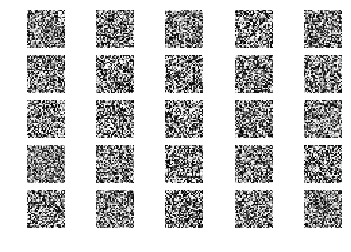

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.386713, acc.: 90.62%] [G loss: 0.885471]
2 [D loss: 0.279017, acc.: 95.31%] [G loss: 0.972480]
3 [D loss: 0.334535, acc.: 90.62%] [G loss: 1.048443]
4 [D loss: 0.276134, acc.: 93.75%] [G loss: 1.163341]
5 [D loss: 0.184043, acc.: 98.44%] [G loss: 1.376971]
6 [D loss: 0.150950, acc.: 100.00%] [G loss: 1.439445]
7 [D loss: 0.145204, acc.: 100.00%] [G loss: 1.558209]
8 [D loss: 0.163665, acc.: 100.00%] [G loss: 1.628713]
9 [D loss: 0.131228, acc.: 100.00%] [G loss: 1.586666]
10 [D loss: 0.108270, acc.: 100.00%] [G loss: 1.776164]
11 [D loss: 0.099743, acc.: 100.00%] [G loss: 1.828669]
12 [D loss: 0.135609, acc.: 98.44%] [G loss: 1.937154]
13 [D loss: 0.095060, acc.: 100.00%] [G loss: 2.019236]
14 [D loss: 0.092237, acc.: 100.00%] [G loss: 2.056545]
15 [D loss: 0.096205, acc.: 100.00%] [G loss: 2.176095]
16 [D loss: 0.076249, acc.: 100.00%] [G loss: 2.226504]
17 [D loss: 0.073609, acc.: 100.00%] [G loss: 2.196987]
18 [D loss: 0.059879, acc.: 100.00%] [G loss: 2.359037]
19 [D l

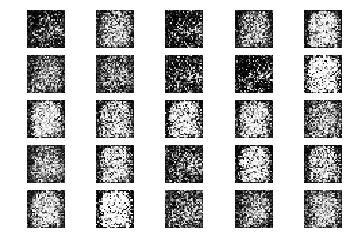

201 [D loss: 0.504006, acc.: 76.56%] [G loss: 2.499797]
202 [D loss: 0.547228, acc.: 75.00%] [G loss: 2.836259]
203 [D loss: 0.415386, acc.: 79.69%] [G loss: 2.822240]
204 [D loss: 0.460602, acc.: 81.25%] [G loss: 2.543609]
205 [D loss: 0.571507, acc.: 65.62%] [G loss: 3.434437]
206 [D loss: 0.498246, acc.: 81.25%] [G loss: 2.277327]
207 [D loss: 0.529399, acc.: 76.56%] [G loss: 2.886850]
208 [D loss: 0.190435, acc.: 92.19%] [G loss: 3.172454]
209 [D loss: 0.606587, acc.: 76.56%] [G loss: 2.181684]
210 [D loss: 0.383174, acc.: 82.81%] [G loss: 3.419907]
211 [D loss: 0.692135, acc.: 57.81%] [G loss: 2.184879]
212 [D loss: 0.636801, acc.: 64.06%] [G loss: 2.567719]
213 [D loss: 0.202907, acc.: 95.31%] [G loss: 3.384927]
214 [D loss: 0.670651, acc.: 67.19%] [G loss: 2.362661]
215 [D loss: 0.468359, acc.: 84.38%] [G loss: 2.921625]
216 [D loss: 0.567877, acc.: 68.75%] [G loss: 3.125946]
217 [D loss: 0.685832, acc.: 68.75%] [G loss: 2.337438]
218 [D loss: 0.540780, acc.: 73.44%] [G loss: 2.

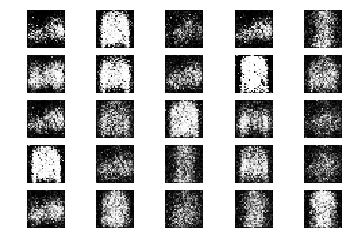

401 [D loss: 0.579468, acc.: 68.75%] [G loss: 0.984768]
402 [D loss: 0.610805, acc.: 65.62%] [G loss: 1.054897]
403 [D loss: 0.584648, acc.: 68.75%] [G loss: 1.142950]
404 [D loss: 0.667182, acc.: 64.06%] [G loss: 1.058733]
405 [D loss: 0.598281, acc.: 68.75%] [G loss: 0.937765]
406 [D loss: 0.690040, acc.: 62.50%] [G loss: 0.841787]
407 [D loss: 0.542806, acc.: 76.56%] [G loss: 0.880830]
408 [D loss: 0.603303, acc.: 67.19%] [G loss: 0.932870]
409 [D loss: 0.537439, acc.: 68.75%] [G loss: 0.985155]
410 [D loss: 0.630079, acc.: 64.06%] [G loss: 1.021399]
411 [D loss: 0.596095, acc.: 62.50%] [G loss: 1.060533]
412 [D loss: 0.568194, acc.: 79.69%] [G loss: 0.957927]
413 [D loss: 0.620640, acc.: 64.06%] [G loss: 0.990171]
414 [D loss: 0.670087, acc.: 68.75%] [G loss: 0.940047]
415 [D loss: 0.601565, acc.: 75.00%] [G loss: 0.944523]
416 [D loss: 0.707747, acc.: 62.50%] [G loss: 0.976580]
417 [D loss: 0.576564, acc.: 68.75%] [G loss: 0.928459]
418 [D loss: 0.649146, acc.: 67.19%] [G loss: 0.

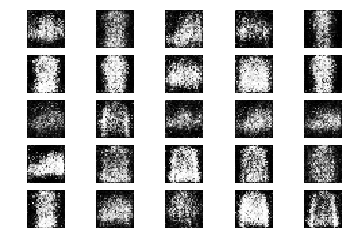

601 [D loss: 0.640734, acc.: 59.38%] [G loss: 0.887454]
602 [D loss: 0.641133, acc.: 64.06%] [G loss: 0.849725]
603 [D loss: 0.630107, acc.: 71.88%] [G loss: 0.799631]
604 [D loss: 0.631594, acc.: 65.62%] [G loss: 0.875362]
605 [D loss: 0.670461, acc.: 53.12%] [G loss: 0.897316]
606 [D loss: 0.677164, acc.: 57.81%] [G loss: 0.917163]
607 [D loss: 0.646673, acc.: 59.38%] [G loss: 0.893528]
608 [D loss: 0.689351, acc.: 57.81%] [G loss: 0.940630]
609 [D loss: 0.668641, acc.: 62.50%] [G loss: 0.872718]
610 [D loss: 0.653602, acc.: 64.06%] [G loss: 0.855872]
611 [D loss: 0.662507, acc.: 57.81%] [G loss: 0.880583]
612 [D loss: 0.663368, acc.: 59.38%] [G loss: 0.871220]
613 [D loss: 0.661119, acc.: 56.25%] [G loss: 0.842153]
614 [D loss: 0.578215, acc.: 73.44%] [G loss: 0.835665]
615 [D loss: 0.632005, acc.: 62.50%] [G loss: 0.893757]
616 [D loss: 0.648367, acc.: 59.38%] [G loss: 0.927211]
617 [D loss: 0.651111, acc.: 60.94%] [G loss: 0.872463]
618 [D loss: 0.644819, acc.: 57.81%] [G loss: 0.

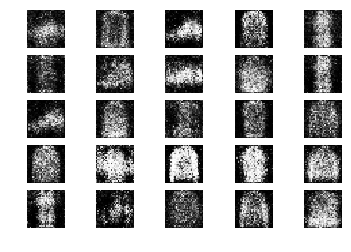

801 [D loss: 0.634190, acc.: 67.19%] [G loss: 0.962494]
802 [D loss: 0.623101, acc.: 67.19%] [G loss: 0.940879]
803 [D loss: 0.589916, acc.: 73.44%] [G loss: 0.891764]
804 [D loss: 0.634845, acc.: 62.50%] [G loss: 0.887472]
805 [D loss: 0.601142, acc.: 65.62%] [G loss: 0.875160]
806 [D loss: 0.577417, acc.: 70.31%] [G loss: 0.743999]
807 [D loss: 0.567913, acc.: 73.44%] [G loss: 0.895264]
808 [D loss: 0.594814, acc.: 68.75%] [G loss: 0.888620]
809 [D loss: 0.577849, acc.: 73.44%] [G loss: 0.860372]
810 [D loss: 0.559144, acc.: 76.56%] [G loss: 0.930819]
811 [D loss: 0.612434, acc.: 65.62%] [G loss: 0.930037]
812 [D loss: 0.561697, acc.: 76.56%] [G loss: 0.911217]
813 [D loss: 0.570246, acc.: 71.88%] [G loss: 0.949757]
814 [D loss: 0.632323, acc.: 67.19%] [G loss: 1.020894]
815 [D loss: 0.616380, acc.: 73.44%] [G loss: 0.969296]
816 [D loss: 0.618826, acc.: 67.19%] [G loss: 0.807747]
817 [D loss: 0.640093, acc.: 60.94%] [G loss: 0.910628]
818 [D loss: 0.652357, acc.: 59.38%] [G loss: 0.

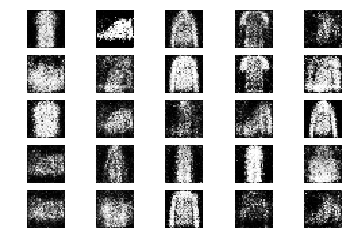

1001 [D loss: 0.610743, acc.: 68.75%] [G loss: 0.911754]
1002 [D loss: 0.651021, acc.: 62.50%] [G loss: 0.932445]
1003 [D loss: 0.646202, acc.: 65.62%] [G loss: 0.867140]
1004 [D loss: 0.671326, acc.: 59.38%] [G loss: 0.851328]
1005 [D loss: 0.592804, acc.: 71.88%] [G loss: 0.831701]
1006 [D loss: 0.663210, acc.: 57.81%] [G loss: 0.814315]
1007 [D loss: 0.656151, acc.: 64.06%] [G loss: 0.869959]
1008 [D loss: 0.574815, acc.: 76.56%] [G loss: 0.790450]
1009 [D loss: 0.637356, acc.: 70.31%] [G loss: 0.880552]
1010 [D loss: 0.632071, acc.: 64.06%] [G loss: 0.888670]
1011 [D loss: 0.634007, acc.: 59.38%] [G loss: 0.916814]
1012 [D loss: 0.624585, acc.: 67.19%] [G loss: 0.959355]
1013 [D loss: 0.636147, acc.: 65.62%] [G loss: 0.883436]
1014 [D loss: 0.667691, acc.: 62.50%] [G loss: 0.821738]
1015 [D loss: 0.625214, acc.: 62.50%] [G loss: 0.774658]
1016 [D loss: 0.609648, acc.: 62.50%] [G loss: 0.768901]
1017 [D loss: 0.587629, acc.: 68.75%] [G loss: 0.860224]
1018 [D loss: 0.616604, acc.: 6

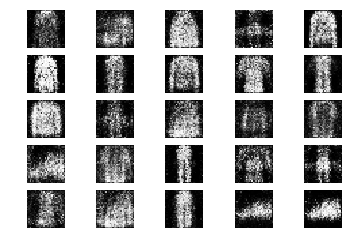

1201 [D loss: 0.648012, acc.: 59.38%] [G loss: 0.829714]
1202 [D loss: 0.648121, acc.: 62.50%] [G loss: 0.871289]
1203 [D loss: 0.623074, acc.: 62.50%] [G loss: 0.798049]
1204 [D loss: 0.647711, acc.: 62.50%] [G loss: 0.854943]
1205 [D loss: 0.633079, acc.: 68.75%] [G loss: 0.887011]
1206 [D loss: 0.692923, acc.: 50.00%] [G loss: 0.887264]
1207 [D loss: 0.636799, acc.: 59.38%] [G loss: 0.898194]
1208 [D loss: 0.645789, acc.: 60.94%] [G loss: 0.879019]
1209 [D loss: 0.714752, acc.: 57.81%] [G loss: 0.804766]
1210 [D loss: 0.598680, acc.: 75.00%] [G loss: 0.813422]
1211 [D loss: 0.622591, acc.: 71.88%] [G loss: 0.842036]
1212 [D loss: 0.584011, acc.: 70.31%] [G loss: 0.847366]
1213 [D loss: 0.614359, acc.: 68.75%] [G loss: 0.920440]
1214 [D loss: 0.653144, acc.: 59.38%] [G loss: 0.832213]
1215 [D loss: 0.624607, acc.: 65.62%] [G loss: 0.838485]
1216 [D loss: 0.616562, acc.: 70.31%] [G loss: 0.843874]
1217 [D loss: 0.647637, acc.: 57.81%] [G loss: 0.821998]
1218 [D loss: 0.591360, acc.: 7

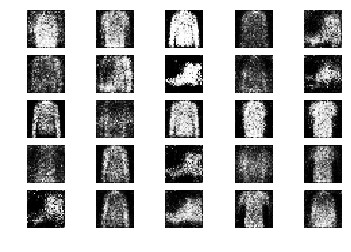

1401 [D loss: 0.680141, acc.: 60.94%] [G loss: 0.859352]
1402 [D loss: 0.653003, acc.: 65.62%] [G loss: 0.837695]
1403 [D loss: 0.679299, acc.: 60.94%] [G loss: 0.858570]
1404 [D loss: 0.628616, acc.: 64.06%] [G loss: 0.820085]
1405 [D loss: 0.609030, acc.: 65.62%] [G loss: 0.943787]
1406 [D loss: 0.604837, acc.: 71.88%] [G loss: 0.861655]
1407 [D loss: 0.647974, acc.: 59.38%] [G loss: 0.878037]
1408 [D loss: 0.612639, acc.: 64.06%] [G loss: 0.892311]
1409 [D loss: 0.583947, acc.: 67.19%] [G loss: 0.890065]
1410 [D loss: 0.648360, acc.: 59.38%] [G loss: 0.919699]
1411 [D loss: 0.684992, acc.: 59.38%] [G loss: 0.871207]
1412 [D loss: 0.576333, acc.: 73.44%] [G loss: 0.828478]
1413 [D loss: 0.595666, acc.: 68.75%] [G loss: 0.860816]
1414 [D loss: 0.606110, acc.: 68.75%] [G loss: 0.917204]
1415 [D loss: 0.632114, acc.: 68.75%] [G loss: 0.830894]
1416 [D loss: 0.591815, acc.: 68.75%] [G loss: 0.866631]
1417 [D loss: 0.555652, acc.: 75.00%] [G loss: 0.890429]
1418 [D loss: 0.619590, acc.: 7

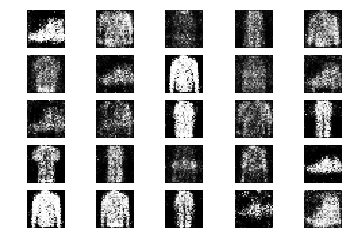

1601 [D loss: 0.703812, acc.: 54.69%] [G loss: 0.920525]
1602 [D loss: 0.614980, acc.: 67.19%] [G loss: 0.889759]
1603 [D loss: 0.595639, acc.: 64.06%] [G loss: 0.954635]
1604 [D loss: 0.580738, acc.: 70.31%] [G loss: 0.951035]
1605 [D loss: 0.681501, acc.: 53.12%] [G loss: 0.820005]
1606 [D loss: 0.656799, acc.: 59.38%] [G loss: 0.918001]
1607 [D loss: 0.668323, acc.: 53.12%] [G loss: 0.944902]
1608 [D loss: 0.601955, acc.: 71.88%] [G loss: 0.896618]
1609 [D loss: 0.608379, acc.: 67.19%] [G loss: 0.764203]
1610 [D loss: 0.614446, acc.: 71.88%] [G loss: 0.920207]
1611 [D loss: 0.626050, acc.: 64.06%] [G loss: 0.904791]
1612 [D loss: 0.525542, acc.: 87.50%] [G loss: 0.969196]
1613 [D loss: 0.541472, acc.: 76.56%] [G loss: 1.051888]
1614 [D loss: 0.636548, acc.: 56.25%] [G loss: 0.929716]
1615 [D loss: 0.620710, acc.: 64.06%] [G loss: 0.912716]
1616 [D loss: 0.587220, acc.: 64.06%] [G loss: 0.937794]
1617 [D loss: 0.621315, acc.: 64.06%] [G loss: 0.932514]
1618 [D loss: 0.605245, acc.: 6

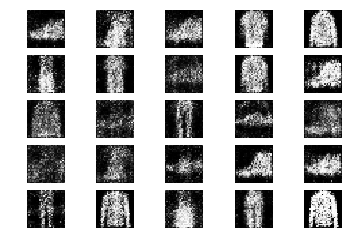

1801 [D loss: 0.625308, acc.: 65.62%] [G loss: 0.885986]
1802 [D loss: 0.669952, acc.: 51.56%] [G loss: 0.802835]
1803 [D loss: 0.576277, acc.: 76.56%] [G loss: 0.922692]
1804 [D loss: 0.619975, acc.: 67.19%] [G loss: 0.883853]
1805 [D loss: 0.619532, acc.: 68.75%] [G loss: 1.054106]
1806 [D loss: 0.622618, acc.: 71.88%] [G loss: 0.935432]
1807 [D loss: 0.661220, acc.: 62.50%] [G loss: 0.929350]
1808 [D loss: 0.598222, acc.: 71.88%] [G loss: 0.836390]
1809 [D loss: 0.590529, acc.: 79.69%] [G loss: 0.917054]
1810 [D loss: 0.580262, acc.: 73.44%] [G loss: 0.950181]
1811 [D loss: 0.646732, acc.: 65.62%] [G loss: 0.930624]
1812 [D loss: 0.632833, acc.: 62.50%] [G loss: 0.930261]
1813 [D loss: 0.624501, acc.: 68.75%] [G loss: 0.983908]
1814 [D loss: 0.674763, acc.: 59.38%] [G loss: 0.829488]
1815 [D loss: 0.755652, acc.: 50.00%] [G loss: 0.841007]
1816 [D loss: 0.613378, acc.: 67.19%] [G loss: 0.947649]
1817 [D loss: 0.648083, acc.: 59.38%] [G loss: 0.981866]
1818 [D loss: 0.641269, acc.: 6

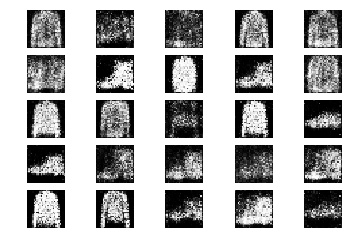

2001 [D loss: 0.617074, acc.: 67.19%] [G loss: 0.859851]
2002 [D loss: 0.627012, acc.: 65.62%] [G loss: 0.982817]
2003 [D loss: 0.649143, acc.: 73.44%] [G loss: 0.833958]
2004 [D loss: 0.614424, acc.: 65.62%] [G loss: 0.907725]
2005 [D loss: 0.691000, acc.: 60.94%] [G loss: 0.788965]
2006 [D loss: 0.644845, acc.: 67.19%] [G loss: 0.784547]
2007 [D loss: 0.631424, acc.: 62.50%] [G loss: 0.923874]
2008 [D loss: 0.679982, acc.: 56.25%] [G loss: 0.888734]
2009 [D loss: 0.684471, acc.: 59.38%] [G loss: 0.894244]
2010 [D loss: 0.630359, acc.: 65.62%] [G loss: 0.909298]
2011 [D loss: 0.614666, acc.: 65.62%] [G loss: 0.892077]
2012 [D loss: 0.658878, acc.: 56.25%] [G loss: 0.937914]
2013 [D loss: 0.628383, acc.: 60.94%] [G loss: 0.834845]
2014 [D loss: 0.621888, acc.: 67.19%] [G loss: 0.899342]
2015 [D loss: 0.586949, acc.: 67.19%] [G loss: 0.871413]
2016 [D loss: 0.628253, acc.: 67.19%] [G loss: 0.793279]
2017 [D loss: 0.660096, acc.: 60.94%] [G loss: 0.880938]
2018 [D loss: 0.636043, acc.: 6

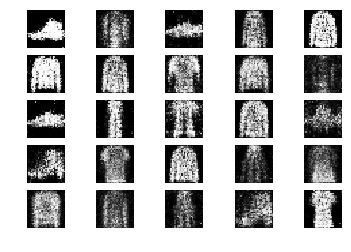

2201 [D loss: 0.679625, acc.: 53.12%] [G loss: 0.904560]
2202 [D loss: 0.559528, acc.: 71.88%] [G loss: 0.898280]
2203 [D loss: 0.650466, acc.: 60.94%] [G loss: 0.963096]
2204 [D loss: 0.615454, acc.: 62.50%] [G loss: 0.822211]
2205 [D loss: 0.625338, acc.: 64.06%] [G loss: 0.882948]
2206 [D loss: 0.617084, acc.: 68.75%] [G loss: 0.819391]
2207 [D loss: 0.648715, acc.: 65.62%] [G loss: 0.904964]
2208 [D loss: 0.594000, acc.: 73.44%] [G loss: 0.826705]
2209 [D loss: 0.646002, acc.: 65.62%] [G loss: 0.869445]
2210 [D loss: 0.658896, acc.: 62.50%] [G loss: 0.902495]
2211 [D loss: 0.573029, acc.: 78.12%] [G loss: 0.929378]
2212 [D loss: 0.592775, acc.: 65.62%] [G loss: 0.887117]
2213 [D loss: 0.628461, acc.: 57.81%] [G loss: 0.875114]
2214 [D loss: 0.616516, acc.: 64.06%] [G loss: 0.887395]
2215 [D loss: 0.612604, acc.: 60.94%] [G loss: 0.845273]
2216 [D loss: 0.592649, acc.: 71.88%] [G loss: 0.874788]
2217 [D loss: 0.640998, acc.: 59.38%] [G loss: 0.991130]
2218 [D loss: 0.677838, acc.: 6

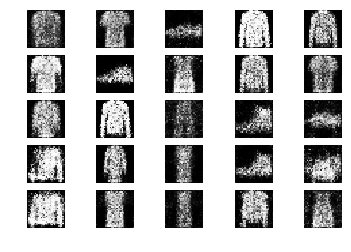

2401 [D loss: 0.633383, acc.: 59.38%] [G loss: 0.870988]
2402 [D loss: 0.557128, acc.: 78.12%] [G loss: 0.883993]
2403 [D loss: 0.669943, acc.: 53.12%] [G loss: 0.863515]
2404 [D loss: 0.568622, acc.: 76.56%] [G loss: 0.886496]
2405 [D loss: 0.545084, acc.: 76.56%] [G loss: 0.833691]
2406 [D loss: 0.618912, acc.: 67.19%] [G loss: 0.842234]
2407 [D loss: 0.536813, acc.: 73.44%] [G loss: 0.871746]
2408 [D loss: 0.683895, acc.: 59.38%] [G loss: 0.859045]
2409 [D loss: 0.622192, acc.: 54.69%] [G loss: 0.950027]
2410 [D loss: 0.629547, acc.: 59.38%] [G loss: 0.867316]
2411 [D loss: 0.626955, acc.: 62.50%] [G loss: 0.962641]
2412 [D loss: 0.632292, acc.: 71.88%] [G loss: 0.932540]
2413 [D loss: 0.692589, acc.: 53.12%] [G loss: 0.935331]
2414 [D loss: 0.640673, acc.: 60.94%] [G loss: 0.858360]
2415 [D loss: 0.657803, acc.: 56.25%] [G loss: 0.946040]
2416 [D loss: 0.637308, acc.: 64.06%] [G loss: 1.001015]
2417 [D loss: 0.579766, acc.: 71.88%] [G loss: 0.901175]
2418 [D loss: 0.615396, acc.: 6

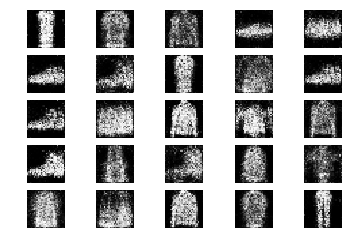

2601 [D loss: 0.696370, acc.: 54.69%] [G loss: 0.951302]
2602 [D loss: 0.646427, acc.: 64.06%] [G loss: 0.952397]
2603 [D loss: 0.587476, acc.: 78.12%] [G loss: 0.799536]
2604 [D loss: 0.588914, acc.: 68.75%] [G loss: 0.898291]
2605 [D loss: 0.622060, acc.: 60.94%] [G loss: 0.918113]
2606 [D loss: 0.572488, acc.: 78.12%] [G loss: 0.891412]
2607 [D loss: 0.659206, acc.: 53.12%] [G loss: 0.853100]
2608 [D loss: 0.642999, acc.: 60.94%] [G loss: 0.830943]
2609 [D loss: 0.629940, acc.: 68.75%] [G loss: 0.942325]
2610 [D loss: 0.616636, acc.: 62.50%] [G loss: 0.906888]
2611 [D loss: 0.704364, acc.: 56.25%] [G loss: 0.902519]
2612 [D loss: 0.677934, acc.: 56.25%] [G loss: 0.824172]
2613 [D loss: 0.624802, acc.: 64.06%] [G loss: 0.948462]
2614 [D loss: 0.683909, acc.: 67.19%] [G loss: 0.943856]
2615 [D loss: 0.627756, acc.: 64.06%] [G loss: 0.987969]
2616 [D loss: 0.580284, acc.: 67.19%] [G loss: 0.981156]
2617 [D loss: 0.573047, acc.: 70.31%] [G loss: 0.936355]
2618 [D loss: 0.655738, acc.: 5

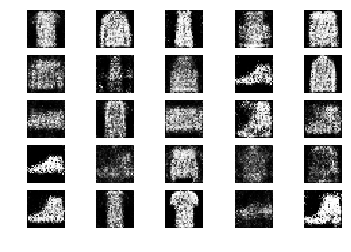

2801 [D loss: 0.705388, acc.: 56.25%] [G loss: 0.908621]
2802 [D loss: 0.671035, acc.: 56.25%] [G loss: 0.879780]
2803 [D loss: 0.577858, acc.: 70.31%] [G loss: 0.914580]
2804 [D loss: 0.674691, acc.: 54.69%] [G loss: 0.889875]
2805 [D loss: 0.600784, acc.: 67.19%] [G loss: 0.903090]
2806 [D loss: 0.566931, acc.: 75.00%] [G loss: 0.993113]
2807 [D loss: 0.648828, acc.: 54.69%] [G loss: 0.956859]
2808 [D loss: 0.598511, acc.: 70.31%] [G loss: 0.906056]
2809 [D loss: 0.680697, acc.: 60.94%] [G loss: 0.921748]
2810 [D loss: 0.564857, acc.: 73.44%] [G loss: 0.929319]
2811 [D loss: 0.533852, acc.: 76.56%] [G loss: 0.937380]
2812 [D loss: 0.609972, acc.: 60.94%] [G loss: 0.910860]
2813 [D loss: 0.707420, acc.: 57.81%] [G loss: 0.857097]
2814 [D loss: 0.579231, acc.: 71.88%] [G loss: 0.887810]
2815 [D loss: 0.687814, acc.: 56.25%] [G loss: 1.029226]
2816 [D loss: 0.698929, acc.: 60.94%] [G loss: 0.908706]
2817 [D loss: 0.636204, acc.: 67.19%] [G loss: 1.020427]
2818 [D loss: 0.623417, acc.: 6

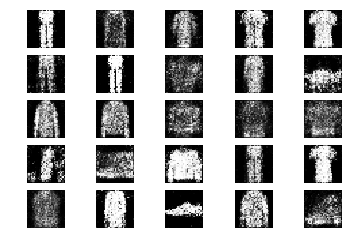

3001 [D loss: 0.659148, acc.: 62.50%] [G loss: 0.875535]
3002 [D loss: 0.690951, acc.: 51.56%] [G loss: 0.857520]
3003 [D loss: 0.614551, acc.: 68.75%] [G loss: 0.831318]
3004 [D loss: 0.671933, acc.: 57.81%] [G loss: 0.880063]
3005 [D loss: 0.647289, acc.: 62.50%] [G loss: 0.859292]
3006 [D loss: 0.624680, acc.: 64.06%] [G loss: 0.852501]
3007 [D loss: 0.626364, acc.: 64.06%] [G loss: 0.833526]
3008 [D loss: 0.599978, acc.: 71.88%] [G loss: 0.863202]
3009 [D loss: 0.617053, acc.: 65.62%] [G loss: 0.918827]
3010 [D loss: 0.674037, acc.: 64.06%] [G loss: 0.836213]
3011 [D loss: 0.694943, acc.: 48.44%] [G loss: 0.974299]
3012 [D loss: 0.567622, acc.: 73.44%] [G loss: 0.843686]
3013 [D loss: 0.653159, acc.: 59.38%] [G loss: 0.843636]
3014 [D loss: 0.632574, acc.: 70.31%] [G loss: 1.002487]
3015 [D loss: 0.638779, acc.: 59.38%] [G loss: 0.963817]
3016 [D loss: 0.587867, acc.: 78.12%] [G loss: 0.890804]
3017 [D loss: 0.645224, acc.: 68.75%] [G loss: 1.007045]
3018 [D loss: 0.648009, acc.: 6

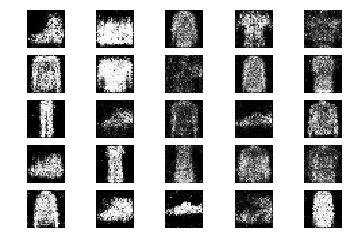

3201 [D loss: 0.616389, acc.: 68.75%] [G loss: 0.905683]
3202 [D loss: 0.633071, acc.: 59.38%] [G loss: 0.914721]
3203 [D loss: 0.620542, acc.: 59.38%] [G loss: 0.914527]
3204 [D loss: 0.631812, acc.: 71.88%] [G loss: 0.900006]
3205 [D loss: 0.623679, acc.: 64.06%] [G loss: 0.984715]
3206 [D loss: 0.718424, acc.: 46.88%] [G loss: 0.965744]
3207 [D loss: 0.624579, acc.: 68.75%] [G loss: 0.886261]
3208 [D loss: 0.590588, acc.: 71.88%] [G loss: 0.878157]
3209 [D loss: 0.618831, acc.: 75.00%] [G loss: 0.950873]
3210 [D loss: 0.628817, acc.: 65.62%] [G loss: 0.825314]
3211 [D loss: 0.670939, acc.: 57.81%] [G loss: 0.907128]
3212 [D loss: 0.666310, acc.: 62.50%] [G loss: 0.848122]
3213 [D loss: 0.601155, acc.: 65.62%] [G loss: 0.886818]
3214 [D loss: 0.629905, acc.: 65.62%] [G loss: 0.894213]
3215 [D loss: 0.623524, acc.: 59.38%] [G loss: 0.860824]
3216 [D loss: 0.595399, acc.: 73.44%] [G loss: 0.923203]
3217 [D loss: 0.560002, acc.: 70.31%] [G loss: 0.916699]
3218 [D loss: 0.679276, acc.: 5

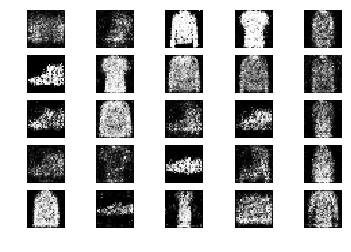

3401 [D loss: 0.635406, acc.: 62.50%] [G loss: 0.995676]
3402 [D loss: 0.607533, acc.: 73.44%] [G loss: 0.888936]
3403 [D loss: 0.595021, acc.: 65.62%] [G loss: 0.945940]
3404 [D loss: 0.716409, acc.: 50.00%] [G loss: 0.977252]
3405 [D loss: 0.648055, acc.: 60.94%] [G loss: 0.918714]
3406 [D loss: 0.627627, acc.: 59.38%] [G loss: 0.903092]
3407 [D loss: 0.620719, acc.: 64.06%] [G loss: 0.941554]
3408 [D loss: 0.660914, acc.: 59.38%] [G loss: 0.943964]
3409 [D loss: 0.638307, acc.: 68.75%] [G loss: 0.920784]
3410 [D loss: 0.596216, acc.: 70.31%] [G loss: 0.932618]
3411 [D loss: 0.600557, acc.: 68.75%] [G loss: 0.933878]
3412 [D loss: 0.599460, acc.: 68.75%] [G loss: 0.881094]
3413 [D loss: 0.674911, acc.: 54.69%] [G loss: 0.878276]
3414 [D loss: 0.686456, acc.: 53.12%] [G loss: 0.913443]
3415 [D loss: 0.607734, acc.: 60.94%] [G loss: 0.954464]
3416 [D loss: 0.602107, acc.: 65.62%] [G loss: 1.010367]
3417 [D loss: 0.627243, acc.: 67.19%] [G loss: 0.935721]
3418 [D loss: 0.605114, acc.: 6

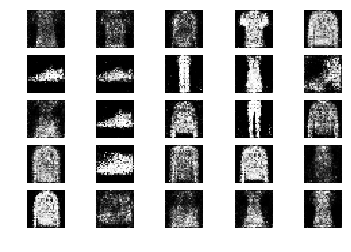

3601 [D loss: 0.654784, acc.: 62.50%] [G loss: 0.993443]
3602 [D loss: 0.585630, acc.: 67.19%] [G loss: 0.892001]
3603 [D loss: 0.590344, acc.: 75.00%] [G loss: 0.878898]
3604 [D loss: 0.632661, acc.: 64.06%] [G loss: 0.942433]
3605 [D loss: 0.568473, acc.: 81.25%] [G loss: 0.916704]
3606 [D loss: 0.625170, acc.: 64.06%] [G loss: 0.866217]
3607 [D loss: 0.672893, acc.: 60.94%] [G loss: 0.892339]
3608 [D loss: 0.620055, acc.: 67.19%] [G loss: 0.918172]
3609 [D loss: 0.652461, acc.: 67.19%] [G loss: 0.897245]
3610 [D loss: 0.595206, acc.: 71.88%] [G loss: 0.867769]
3611 [D loss: 0.692995, acc.: 59.38%] [G loss: 0.880768]
3612 [D loss: 0.632815, acc.: 70.31%] [G loss: 0.858322]
3613 [D loss: 0.595327, acc.: 70.31%] [G loss: 0.942233]
3614 [D loss: 0.608439, acc.: 71.88%] [G loss: 0.855131]
3615 [D loss: 0.622803, acc.: 60.94%] [G loss: 0.987166]
3616 [D loss: 0.638704, acc.: 64.06%] [G loss: 0.878205]
3617 [D loss: 0.616322, acc.: 71.88%] [G loss: 0.828464]
3618 [D loss: 0.639574, acc.: 5

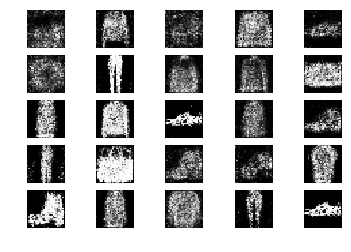

3801 [D loss: 0.610403, acc.: 65.62%] [G loss: 0.897583]
3802 [D loss: 0.595126, acc.: 70.31%] [G loss: 0.974838]
3803 [D loss: 0.682690, acc.: 56.25%] [G loss: 0.920156]
3804 [D loss: 0.628714, acc.: 67.19%] [G loss: 0.887361]
3805 [D loss: 0.610370, acc.: 64.06%] [G loss: 0.884203]
3806 [D loss: 0.674517, acc.: 53.12%] [G loss: 0.828067]
3807 [D loss: 0.629289, acc.: 67.19%] [G loss: 0.856591]
3808 [D loss: 0.632029, acc.: 70.31%] [G loss: 0.941901]
3809 [D loss: 0.576807, acc.: 76.56%] [G loss: 0.914728]
3810 [D loss: 0.632974, acc.: 57.81%] [G loss: 0.910470]
3811 [D loss: 0.641845, acc.: 67.19%] [G loss: 0.958228]
3812 [D loss: 0.684515, acc.: 54.69%] [G loss: 0.874500]
3813 [D loss: 0.647222, acc.: 65.62%] [G loss: 0.878262]
3814 [D loss: 0.635547, acc.: 57.81%] [G loss: 0.968470]
3815 [D loss: 0.730194, acc.: 46.88%] [G loss: 0.853072]
3816 [D loss: 0.624935, acc.: 62.50%] [G loss: 0.965752]
3817 [D loss: 0.655839, acc.: 60.94%] [G loss: 0.970215]
3818 [D loss: 0.575614, acc.: 7

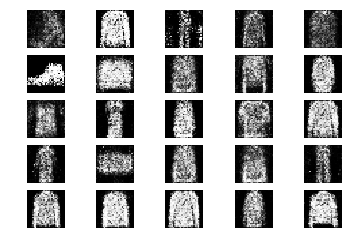

4001 [D loss: 0.754954, acc.: 54.69%] [G loss: 0.985717]
4002 [D loss: 0.637914, acc.: 62.50%] [G loss: 1.011408]
4003 [D loss: 0.563177, acc.: 76.56%] [G loss: 0.970401]
4004 [D loss: 0.609151, acc.: 60.94%] [G loss: 0.971691]
4005 [D loss: 0.601344, acc.: 68.75%] [G loss: 0.921584]
4006 [D loss: 0.628374, acc.: 67.19%] [G loss: 0.815707]
4007 [D loss: 0.622829, acc.: 64.06%] [G loss: 0.951159]
4008 [D loss: 0.657015, acc.: 59.38%] [G loss: 0.895037]
4009 [D loss: 0.709592, acc.: 53.12%] [G loss: 0.941669]
4010 [D loss: 0.644205, acc.: 56.25%] [G loss: 0.894614]
4011 [D loss: 0.634428, acc.: 64.06%] [G loss: 0.848466]
4012 [D loss: 0.688086, acc.: 56.25%] [G loss: 0.873469]
4013 [D loss: 0.631881, acc.: 65.62%] [G loss: 0.837751]
4014 [D loss: 0.621818, acc.: 64.06%] [G loss: 0.863770]
4015 [D loss: 0.699875, acc.: 53.12%] [G loss: 0.841740]
4016 [D loss: 0.591052, acc.: 75.00%] [G loss: 0.926124]
4017 [D loss: 0.673897, acc.: 65.62%] [G loss: 0.933883]
4018 [D loss: 0.683912, acc.: 5

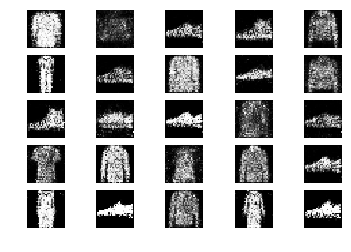

4201 [D loss: 0.665763, acc.: 57.81%] [G loss: 0.953292]
4202 [D loss: 0.637654, acc.: 68.75%] [G loss: 0.950109]
4203 [D loss: 0.563262, acc.: 78.12%] [G loss: 0.989351]
4204 [D loss: 0.640925, acc.: 62.50%] [G loss: 0.971291]
4205 [D loss: 0.654952, acc.: 62.50%] [G loss: 0.960479]
4206 [D loss: 0.661130, acc.: 53.12%] [G loss: 0.896414]
4207 [D loss: 0.616189, acc.: 65.62%] [G loss: 0.922679]
4208 [D loss: 0.612822, acc.: 65.62%] [G loss: 0.956626]
4209 [D loss: 0.660274, acc.: 62.50%] [G loss: 0.917123]
4210 [D loss: 0.598633, acc.: 70.31%] [G loss: 0.982109]
4211 [D loss: 0.593279, acc.: 76.56%] [G loss: 0.952375]
4212 [D loss: 0.614885, acc.: 62.50%] [G loss: 0.931904]
4213 [D loss: 0.676158, acc.: 56.25%] [G loss: 0.963882]
4214 [D loss: 0.658170, acc.: 65.62%] [G loss: 0.911850]
4215 [D loss: 0.542346, acc.: 87.50%] [G loss: 0.863076]
4216 [D loss: 0.698357, acc.: 59.38%] [G loss: 0.872616]
4217 [D loss: 0.635836, acc.: 59.38%] [G loss: 1.011026]
4218 [D loss: 0.596962, acc.: 6

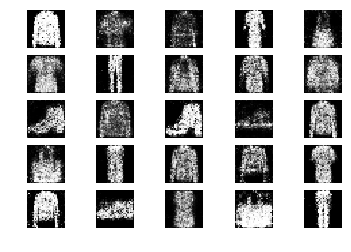

4401 [D loss: 0.671520, acc.: 60.94%] [G loss: 0.942951]
4402 [D loss: 0.718046, acc.: 48.44%] [G loss: 0.879547]
4403 [D loss: 0.604143, acc.: 68.75%] [G loss: 0.885143]
4404 [D loss: 0.652424, acc.: 62.50%] [G loss: 0.874221]
4405 [D loss: 0.699061, acc.: 64.06%] [G loss: 0.984516]
4406 [D loss: 0.682015, acc.: 65.62%] [G loss: 0.848116]
4407 [D loss: 0.678489, acc.: 59.38%] [G loss: 0.902251]
4408 [D loss: 0.635326, acc.: 62.50%] [G loss: 0.831216]
4409 [D loss: 0.644221, acc.: 60.94%] [G loss: 0.898918]
4410 [D loss: 0.636314, acc.: 60.94%] [G loss: 0.922652]
4411 [D loss: 0.659663, acc.: 53.12%] [G loss: 0.906961]
4412 [D loss: 0.614977, acc.: 64.06%] [G loss: 0.908309]
4413 [D loss: 0.700328, acc.: 60.94%] [G loss: 0.955579]
4414 [D loss: 0.594469, acc.: 70.31%] [G loss: 0.911395]
4415 [D loss: 0.713786, acc.: 57.81%] [G loss: 0.957853]
4416 [D loss: 0.505147, acc.: 76.56%] [G loss: 0.965318]
4417 [D loss: 0.633676, acc.: 75.00%] [G loss: 0.902041]
4418 [D loss: 0.668348, acc.: 5

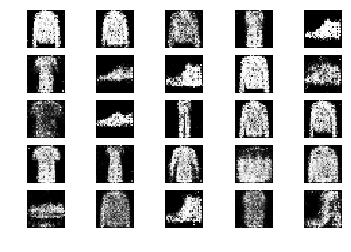

4601 [D loss: 0.702382, acc.: 65.62%] [G loss: 0.857987]
4602 [D loss: 0.653854, acc.: 64.06%] [G loss: 0.810993]
4603 [D loss: 0.658687, acc.: 57.81%] [G loss: 0.841822]
4604 [D loss: 0.637601, acc.: 71.88%] [G loss: 0.889608]
4605 [D loss: 0.653832, acc.: 54.69%] [G loss: 0.895590]
4606 [D loss: 0.644231, acc.: 65.62%] [G loss: 0.954600]
4607 [D loss: 0.649029, acc.: 60.94%] [G loss: 0.956138]
4608 [D loss: 0.683424, acc.: 56.25%] [G loss: 0.939559]
4609 [D loss: 0.677980, acc.: 56.25%] [G loss: 0.883189]
4610 [D loss: 0.607343, acc.: 76.56%] [G loss: 0.902481]
4611 [D loss: 0.650136, acc.: 62.50%] [G loss: 0.926523]
4612 [D loss: 0.562857, acc.: 70.31%] [G loss: 0.939596]
4613 [D loss: 0.656291, acc.: 56.25%] [G loss: 0.990280]
4614 [D loss: 0.697025, acc.: 53.12%] [G loss: 0.836754]
4615 [D loss: 0.606168, acc.: 71.88%] [G loss: 0.886342]
4616 [D loss: 0.649758, acc.: 60.94%] [G loss: 0.872650]
4617 [D loss: 0.660922, acc.: 54.69%] [G loss: 0.865456]
4618 [D loss: 0.629163, acc.: 6

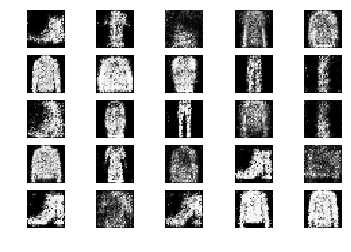

4801 [D loss: 0.625288, acc.: 68.75%] [G loss: 0.907780]
4802 [D loss: 0.584607, acc.: 73.44%] [G loss: 0.904451]
4803 [D loss: 0.666296, acc.: 68.75%] [G loss: 0.926386]
4804 [D loss: 0.633742, acc.: 67.19%] [G loss: 0.849625]
4805 [D loss: 0.638833, acc.: 65.62%] [G loss: 0.864253]
4806 [D loss: 0.666054, acc.: 59.38%] [G loss: 0.875556]
4807 [D loss: 0.662639, acc.: 60.94%] [G loss: 0.940731]
4808 [D loss: 0.662705, acc.: 62.50%] [G loss: 0.897979]
4809 [D loss: 0.704791, acc.: 54.69%] [G loss: 0.889452]
4810 [D loss: 0.642620, acc.: 62.50%] [G loss: 0.940473]
4811 [D loss: 0.651611, acc.: 65.62%] [G loss: 0.973433]
4812 [D loss: 0.684728, acc.: 56.25%] [G loss: 0.837165]
4813 [D loss: 0.658759, acc.: 64.06%] [G loss: 0.895860]
4814 [D loss: 0.648808, acc.: 57.81%] [G loss: 0.808176]
4815 [D loss: 0.594762, acc.: 71.88%] [G loss: 0.875019]
4816 [D loss: 0.704088, acc.: 57.81%] [G loss: 0.878024]
4817 [D loss: 0.637939, acc.: 64.06%] [G loss: 0.899980]
4818 [D loss: 0.633905, acc.: 6

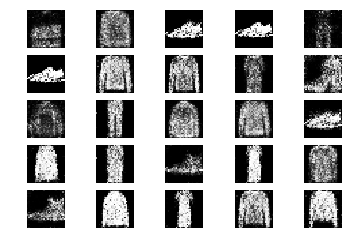

5001 [D loss: 0.617875, acc.: 68.75%] [G loss: 0.921550]
5002 [D loss: 0.613472, acc.: 71.88%] [G loss: 0.868653]
5003 [D loss: 0.629524, acc.: 65.62%] [G loss: 0.877815]
5004 [D loss: 0.605294, acc.: 62.50%] [G loss: 0.941642]
5005 [D loss: 0.656195, acc.: 64.06%] [G loss: 0.869418]
5006 [D loss: 0.705315, acc.: 48.44%] [G loss: 0.933779]
5007 [D loss: 0.635484, acc.: 59.38%] [G loss: 0.861961]
5008 [D loss: 0.639904, acc.: 65.62%] [G loss: 0.855760]
5009 [D loss: 0.701834, acc.: 56.25%] [G loss: 0.910703]
5010 [D loss: 0.649356, acc.: 59.38%] [G loss: 0.930060]
5011 [D loss: 0.643511, acc.: 65.62%] [G loss: 0.869237]
5012 [D loss: 0.637293, acc.: 59.38%] [G loss: 0.906048]
5013 [D loss: 0.633601, acc.: 70.31%] [G loss: 0.865918]
5014 [D loss: 0.583556, acc.: 70.31%] [G loss: 0.854903]
5015 [D loss: 0.656006, acc.: 56.25%] [G loss: 0.873738]
5016 [D loss: 0.689010, acc.: 56.25%] [G loss: 0.884573]
5017 [D loss: 0.677890, acc.: 60.94%] [G loss: 0.926572]
5018 [D loss: 0.590483, acc.: 7

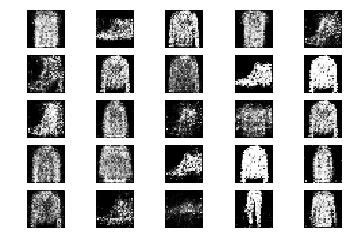

5201 [D loss: 0.668367, acc.: 53.12%] [G loss: 0.954970]
5202 [D loss: 0.565378, acc.: 76.56%] [G loss: 0.844725]
5203 [D loss: 0.732236, acc.: 46.88%] [G loss: 0.934970]
5204 [D loss: 0.634333, acc.: 65.62%] [G loss: 0.993071]
5205 [D loss: 0.666729, acc.: 59.38%] [G loss: 0.821702]
5206 [D loss: 0.630073, acc.: 60.94%] [G loss: 0.834468]
5207 [D loss: 0.615382, acc.: 68.75%] [G loss: 0.893096]
5208 [D loss: 0.600498, acc.: 64.06%] [G loss: 0.921749]
5209 [D loss: 0.663512, acc.: 57.81%] [G loss: 0.966139]
5210 [D loss: 0.651717, acc.: 56.25%] [G loss: 0.904007]
5211 [D loss: 0.653293, acc.: 62.50%] [G loss: 0.903711]
5212 [D loss: 0.594452, acc.: 76.56%] [G loss: 0.904179]
5213 [D loss: 0.672056, acc.: 59.38%] [G loss: 0.901551]
5214 [D loss: 0.663956, acc.: 56.25%] [G loss: 0.843283]
5215 [D loss: 0.650333, acc.: 64.06%] [G loss: 0.925548]
5216 [D loss: 0.641689, acc.: 70.31%] [G loss: 0.965239]
5217 [D loss: 0.648520, acc.: 65.62%] [G loss: 1.049977]
5218 [D loss: 0.641514, acc.: 5

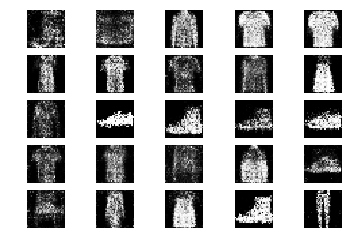

5401 [D loss: 0.640301, acc.: 64.06%] [G loss: 0.986701]
5402 [D loss: 0.652881, acc.: 62.50%] [G loss: 0.951380]
5403 [D loss: 0.654222, acc.: 67.19%] [G loss: 0.942309]
5404 [D loss: 0.637628, acc.: 57.81%] [G loss: 0.947623]
5405 [D loss: 0.610230, acc.: 60.94%] [G loss: 0.952457]
5406 [D loss: 0.660686, acc.: 56.25%] [G loss: 0.959435]
5407 [D loss: 0.626839, acc.: 62.50%] [G loss: 1.006515]
5408 [D loss: 0.670407, acc.: 62.50%] [G loss: 0.921160]
5409 [D loss: 0.664368, acc.: 54.69%] [G loss: 0.873838]
5410 [D loss: 0.631370, acc.: 70.31%] [G loss: 0.898154]
5411 [D loss: 0.649905, acc.: 62.50%] [G loss: 1.014458]
5412 [D loss: 0.667248, acc.: 59.38%] [G loss: 0.893774]
5413 [D loss: 0.626556, acc.: 59.38%] [G loss: 0.884671]
5414 [D loss: 0.595188, acc.: 70.31%] [G loss: 0.907484]
5415 [D loss: 0.611080, acc.: 65.62%] [G loss: 1.057610]
5416 [D loss: 0.677573, acc.: 57.81%] [G loss: 0.893557]
5417 [D loss: 0.553791, acc.: 71.88%] [G loss: 0.959066]
5418 [D loss: 0.668792, acc.: 6

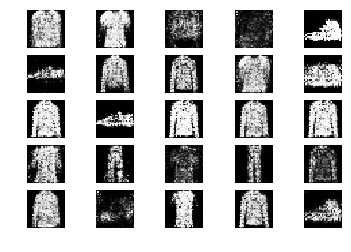

5601 [D loss: 0.608714, acc.: 67.19%] [G loss: 0.931900]
5602 [D loss: 0.611813, acc.: 75.00%] [G loss: 0.906492]
5603 [D loss: 0.665986, acc.: 60.94%] [G loss: 0.910908]
5604 [D loss: 0.565865, acc.: 71.88%] [G loss: 0.985746]
5605 [D loss: 0.636521, acc.: 56.25%] [G loss: 0.956689]
5606 [D loss: 0.646308, acc.: 60.94%] [G loss: 0.891758]
5607 [D loss: 0.654836, acc.: 59.38%] [G loss: 0.851921]
5608 [D loss: 0.560017, acc.: 75.00%] [G loss: 0.970737]
5609 [D loss: 0.579372, acc.: 71.88%] [G loss: 1.011989]
5610 [D loss: 0.642416, acc.: 60.94%] [G loss: 0.879685]
5611 [D loss: 0.742149, acc.: 51.56%] [G loss: 0.874173]
5612 [D loss: 0.609403, acc.: 68.75%] [G loss: 0.920906]
5613 [D loss: 0.635111, acc.: 65.62%] [G loss: 0.931588]
5614 [D loss: 0.628484, acc.: 71.88%] [G loss: 0.898040]
5615 [D loss: 0.609786, acc.: 65.62%] [G loss: 0.909222]
5616 [D loss: 0.665132, acc.: 64.06%] [G loss: 0.874208]
5617 [D loss: 0.685849, acc.: 56.25%] [G loss: 0.879357]
5618 [D loss: 0.691485, acc.: 6

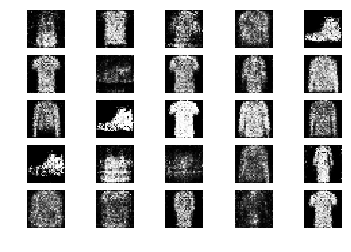

5801 [D loss: 0.643838, acc.: 62.50%] [G loss: 0.924058]
5802 [D loss: 0.620281, acc.: 62.50%] [G loss: 0.923970]
5803 [D loss: 0.625577, acc.: 64.06%] [G loss: 0.888172]
5804 [D loss: 0.611537, acc.: 70.31%] [G loss: 0.935779]
5805 [D loss: 0.602518, acc.: 65.62%] [G loss: 0.965445]
5806 [D loss: 0.645518, acc.: 62.50%] [G loss: 0.805349]
5807 [D loss: 0.692195, acc.: 59.38%] [G loss: 0.912408]
5808 [D loss: 0.609836, acc.: 64.06%] [G loss: 0.910207]
5809 [D loss: 0.615510, acc.: 73.44%] [G loss: 0.840101]
5810 [D loss: 0.619594, acc.: 70.31%] [G loss: 0.911717]
5811 [D loss: 0.723135, acc.: 54.69%] [G loss: 0.876345]
5812 [D loss: 0.632466, acc.: 60.94%] [G loss: 0.919502]
5813 [D loss: 0.620920, acc.: 65.62%] [G loss: 0.941065]
5814 [D loss: 0.659792, acc.: 62.50%] [G loss: 0.869882]
5815 [D loss: 0.651845, acc.: 59.38%] [G loss: 0.929402]
5816 [D loss: 0.671523, acc.: 62.50%] [G loss: 0.872609]
5817 [D loss: 0.636349, acc.: 64.06%] [G loss: 0.836704]
5818 [D loss: 0.618398, acc.: 7

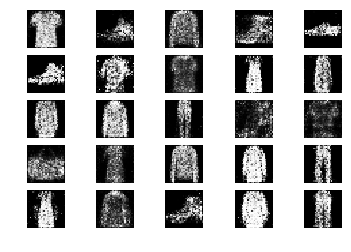

6001 [D loss: 0.665801, acc.: 57.81%] [G loss: 0.838740]
6002 [D loss: 0.645674, acc.: 59.38%] [G loss: 0.894275]
6003 [D loss: 0.646023, acc.: 64.06%] [G loss: 0.852740]
6004 [D loss: 0.606911, acc.: 68.75%] [G loss: 0.918814]
6005 [D loss: 0.675518, acc.: 53.12%] [G loss: 0.934095]
6006 [D loss: 0.635744, acc.: 65.62%] [G loss: 0.953842]
6007 [D loss: 0.662859, acc.: 60.94%] [G loss: 0.974178]
6008 [D loss: 0.611612, acc.: 62.50%] [G loss: 0.862274]
6009 [D loss: 0.628430, acc.: 60.94%] [G loss: 0.812201]
6010 [D loss: 0.693330, acc.: 54.69%] [G loss: 0.825333]
6011 [D loss: 0.647262, acc.: 71.88%] [G loss: 0.973762]
6012 [D loss: 0.688706, acc.: 57.81%] [G loss: 0.966565]
6013 [D loss: 0.720022, acc.: 57.81%] [G loss: 1.005540]
6014 [D loss: 0.691816, acc.: 54.69%] [G loss: 0.942464]
6015 [D loss: 0.588968, acc.: 76.56%] [G loss: 0.911983]
6016 [D loss: 0.631469, acc.: 67.19%] [G loss: 0.986136]
6017 [D loss: 0.650553, acc.: 60.94%] [G loss: 0.957288]
6018 [D loss: 0.625143, acc.: 6

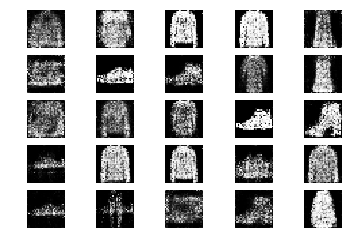

6201 [D loss: 0.686213, acc.: 53.12%] [G loss: 0.910539]
6202 [D loss: 0.689813, acc.: 60.94%] [G loss: 0.952503]
6203 [D loss: 0.623167, acc.: 70.31%] [G loss: 0.910391]
6204 [D loss: 0.616208, acc.: 62.50%] [G loss: 0.977880]
6205 [D loss: 0.632764, acc.: 62.50%] [G loss: 0.906859]
6206 [D loss: 0.674623, acc.: 56.25%] [G loss: 1.011432]
6207 [D loss: 0.606734, acc.: 67.19%] [G loss: 0.959152]
6208 [D loss: 0.663564, acc.: 56.25%] [G loss: 0.888212]
6209 [D loss: 0.588030, acc.: 64.06%] [G loss: 0.950864]
6210 [D loss: 0.621053, acc.: 65.62%] [G loss: 0.874053]
6211 [D loss: 0.656012, acc.: 60.94%] [G loss: 0.955516]
6212 [D loss: 0.669695, acc.: 59.38%] [G loss: 0.921893]
6213 [D loss: 0.688104, acc.: 57.81%] [G loss: 0.883855]
6214 [D loss: 0.622778, acc.: 71.88%] [G loss: 0.981033]
6215 [D loss: 0.683052, acc.: 53.12%] [G loss: 0.956139]
6216 [D loss: 0.681370, acc.: 59.38%] [G loss: 0.948049]
6217 [D loss: 0.636791, acc.: 65.62%] [G loss: 0.886993]
6218 [D loss: 0.632101, acc.: 6

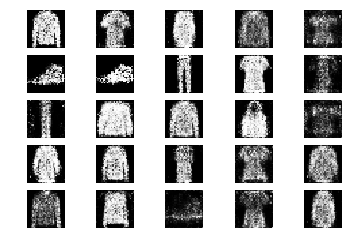

6401 [D loss: 0.631510, acc.: 59.38%] [G loss: 0.873871]
6402 [D loss: 0.578962, acc.: 65.62%] [G loss: 0.987378]
6403 [D loss: 0.657142, acc.: 57.81%] [G loss: 1.019228]
6404 [D loss: 0.640994, acc.: 54.69%] [G loss: 0.957879]
6405 [D loss: 0.561140, acc.: 70.31%] [G loss: 1.012834]
6406 [D loss: 0.657424, acc.: 60.94%] [G loss: 1.037852]
6407 [D loss: 0.655351, acc.: 60.94%] [G loss: 0.941555]
6408 [D loss: 0.600287, acc.: 71.88%] [G loss: 0.944949]
6409 [D loss: 0.673780, acc.: 53.12%] [G loss: 0.952632]
6410 [D loss: 0.621988, acc.: 60.94%] [G loss: 0.931745]
6411 [D loss: 0.608694, acc.: 68.75%] [G loss: 0.967757]
6412 [D loss: 0.638022, acc.: 62.50%] [G loss: 1.052095]
6413 [D loss: 0.677394, acc.: 53.12%] [G loss: 0.995842]
6414 [D loss: 0.656870, acc.: 64.06%] [G loss: 0.932987]
6415 [D loss: 0.645438, acc.: 59.38%] [G loss: 0.982957]
6416 [D loss: 0.692268, acc.: 57.81%] [G loss: 0.897919]
6417 [D loss: 0.644240, acc.: 60.94%] [G loss: 0.981014]
6418 [D loss: 0.678830, acc.: 6

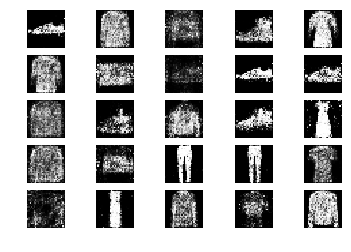

6601 [D loss: 0.637714, acc.: 62.50%] [G loss: 0.947450]
6602 [D loss: 0.630262, acc.: 68.75%] [G loss: 0.933531]
6603 [D loss: 0.592767, acc.: 67.19%] [G loss: 0.904818]
6604 [D loss: 0.621035, acc.: 64.06%] [G loss: 0.897727]
6605 [D loss: 0.657081, acc.: 60.94%] [G loss: 0.813015]
6606 [D loss: 0.624557, acc.: 65.62%] [G loss: 0.898758]
6607 [D loss: 0.697718, acc.: 56.25%] [G loss: 0.923579]
6608 [D loss: 0.646450, acc.: 64.06%] [G loss: 0.917514]
6609 [D loss: 0.646555, acc.: 65.62%] [G loss: 0.991924]
6610 [D loss: 0.692479, acc.: 57.81%] [G loss: 0.936579]
6611 [D loss: 0.630935, acc.: 68.75%] [G loss: 0.951357]
6612 [D loss: 0.528787, acc.: 78.12%] [G loss: 0.785543]
6613 [D loss: 0.660793, acc.: 60.94%] [G loss: 0.878954]
6614 [D loss: 0.585539, acc.: 65.62%] [G loss: 0.829279]
6615 [D loss: 0.646982, acc.: 54.69%] [G loss: 0.876074]
6616 [D loss: 0.629347, acc.: 68.75%] [G loss: 0.948058]
6617 [D loss: 0.638084, acc.: 62.50%] [G loss: 0.917672]
6618 [D loss: 0.708870, acc.: 5

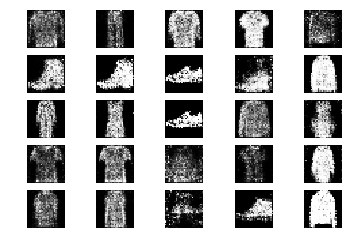

6801 [D loss: 0.591094, acc.: 71.88%] [G loss: 1.025755]
6802 [D loss: 0.620060, acc.: 59.38%] [G loss: 0.915933]
6803 [D loss: 0.641846, acc.: 65.62%] [G loss: 0.834674]
6804 [D loss: 0.635687, acc.: 60.94%] [G loss: 0.841610]
6805 [D loss: 0.723633, acc.: 53.12%] [G loss: 0.938318]
6806 [D loss: 0.623438, acc.: 70.31%] [G loss: 0.866171]
6807 [D loss: 0.643314, acc.: 59.38%] [G loss: 0.831246]
6808 [D loss: 0.669925, acc.: 59.38%] [G loss: 0.866914]
6809 [D loss: 0.651092, acc.: 62.50%] [G loss: 0.907084]
6810 [D loss: 0.603304, acc.: 70.31%] [G loss: 0.999379]
6811 [D loss: 0.655559, acc.: 60.94%] [G loss: 1.004522]
6812 [D loss: 0.674937, acc.: 60.94%] [G loss: 0.929039]
6813 [D loss: 0.627035, acc.: 67.19%] [G loss: 0.907496]
6814 [D loss: 0.669580, acc.: 64.06%] [G loss: 0.971125]
6815 [D loss: 0.642459, acc.: 59.38%] [G loss: 0.940512]
6816 [D loss: 0.661199, acc.: 62.50%] [G loss: 0.941370]
6817 [D loss: 0.631060, acc.: 64.06%] [G loss: 0.916167]
6818 [D loss: 0.613205, acc.: 6

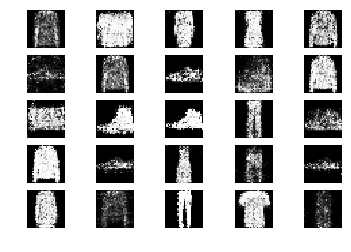

7001 [D loss: 0.631335, acc.: 60.94%] [G loss: 0.967278]
7002 [D loss: 0.682227, acc.: 53.12%] [G loss: 0.984636]
7003 [D loss: 0.637827, acc.: 67.19%] [G loss: 0.902327]
7004 [D loss: 0.689574, acc.: 54.69%] [G loss: 0.897667]
7005 [D loss: 0.654251, acc.: 57.81%] [G loss: 0.866051]
7006 [D loss: 0.561198, acc.: 76.56%] [G loss: 0.853177]
7007 [D loss: 0.666687, acc.: 60.94%] [G loss: 0.828505]
7008 [D loss: 0.626763, acc.: 73.44%] [G loss: 0.821851]
7009 [D loss: 0.696749, acc.: 54.69%] [G loss: 0.886123]
7010 [D loss: 0.653211, acc.: 54.69%] [G loss: 0.862865]
7011 [D loss: 0.620700, acc.: 67.19%] [G loss: 0.907912]
7012 [D loss: 0.674144, acc.: 65.62%] [G loss: 0.966949]
7013 [D loss: 0.680976, acc.: 60.94%] [G loss: 0.925348]
7014 [D loss: 0.674734, acc.: 59.38%] [G loss: 0.903881]
7015 [D loss: 0.631591, acc.: 68.75%] [G loss: 1.001134]
7016 [D loss: 0.597940, acc.: 71.88%] [G loss: 0.929212]
7017 [D loss: 0.697886, acc.: 56.25%] [G loss: 0.953517]
7018 [D loss: 0.645895, acc.: 6

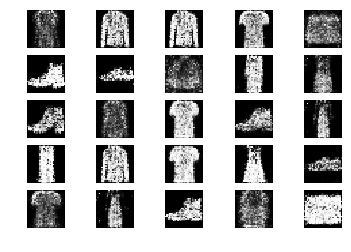

7201 [D loss: 0.687821, acc.: 57.81%] [G loss: 0.865886]
7202 [D loss: 0.684786, acc.: 50.00%] [G loss: 0.877337]
7203 [D loss: 0.602143, acc.: 68.75%] [G loss: 0.894288]
7204 [D loss: 0.683787, acc.: 54.69%] [G loss: 0.947872]
7205 [D loss: 0.661883, acc.: 54.69%] [G loss: 1.037796]
7206 [D loss: 0.653336, acc.: 62.50%] [G loss: 1.021214]
7207 [D loss: 0.592932, acc.: 70.31%] [G loss: 0.974758]
7208 [D loss: 0.623596, acc.: 62.50%] [G loss: 0.944457]
7209 [D loss: 0.608174, acc.: 64.06%] [G loss: 0.911252]
7210 [D loss: 0.619516, acc.: 65.62%] [G loss: 0.891391]
7211 [D loss: 0.678096, acc.: 56.25%] [G loss: 0.952295]
7212 [D loss: 0.606635, acc.: 71.88%] [G loss: 0.996345]
7213 [D loss: 0.703880, acc.: 60.94%] [G loss: 0.870816]
7214 [D loss: 0.629841, acc.: 64.06%] [G loss: 0.968110]
7215 [D loss: 0.737877, acc.: 50.00%] [G loss: 0.930743]
7216 [D loss: 0.685855, acc.: 48.44%] [G loss: 0.944907]
7217 [D loss: 0.643316, acc.: 62.50%] [G loss: 0.891113]
7218 [D loss: 0.619905, acc.: 7

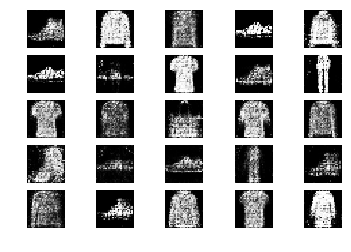

7401 [D loss: 0.648425, acc.: 70.31%] [G loss: 0.908619]
7402 [D loss: 0.712974, acc.: 59.38%] [G loss: 1.019351]
7403 [D loss: 0.662358, acc.: 62.50%] [G loss: 0.941071]
7404 [D loss: 0.708381, acc.: 51.56%] [G loss: 0.905814]
7405 [D loss: 0.581028, acc.: 70.31%] [G loss: 1.017897]
7406 [D loss: 0.674709, acc.: 59.38%] [G loss: 1.050764]
7407 [D loss: 0.608488, acc.: 70.31%] [G loss: 1.007839]
7408 [D loss: 0.672986, acc.: 54.69%] [G loss: 1.065730]
7409 [D loss: 0.651202, acc.: 67.19%] [G loss: 0.997787]
7410 [D loss: 0.649182, acc.: 65.62%] [G loss: 0.947460]
7411 [D loss: 0.670063, acc.: 59.38%] [G loss: 0.925899]
7412 [D loss: 0.717277, acc.: 53.12%] [G loss: 0.934285]
7413 [D loss: 0.600458, acc.: 68.75%] [G loss: 0.967956]
7414 [D loss: 0.698609, acc.: 53.12%] [G loss: 0.982898]
7415 [D loss: 0.640042, acc.: 60.94%] [G loss: 0.965454]
7416 [D loss: 0.624806, acc.: 67.19%] [G loss: 0.955589]
7417 [D loss: 0.643691, acc.: 60.94%] [G loss: 0.879405]
7418 [D loss: 0.611126, acc.: 5

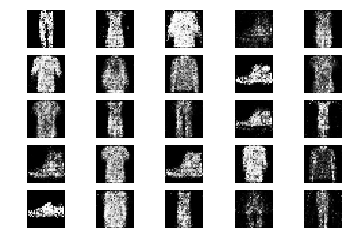

7601 [D loss: 0.629951, acc.: 65.62%] [G loss: 0.917748]
7602 [D loss: 0.667814, acc.: 64.06%] [G loss: 0.881213]
7603 [D loss: 0.636154, acc.: 60.94%] [G loss: 0.856221]
7604 [D loss: 0.685368, acc.: 57.81%] [G loss: 0.903421]
7605 [D loss: 0.658872, acc.: 57.81%] [G loss: 0.878491]
7606 [D loss: 0.652996, acc.: 57.81%] [G loss: 0.925743]
7607 [D loss: 0.642325, acc.: 65.62%] [G loss: 0.913253]
7608 [D loss: 0.652144, acc.: 60.94%] [G loss: 0.906971]
7609 [D loss: 0.631277, acc.: 68.75%] [G loss: 0.896557]
7610 [D loss: 0.643674, acc.: 62.50%] [G loss: 0.823210]
7611 [D loss: 0.584644, acc.: 67.19%] [G loss: 0.888206]
7612 [D loss: 0.591190, acc.: 65.62%] [G loss: 1.011229]
7613 [D loss: 0.605003, acc.: 67.19%] [G loss: 0.962222]
7614 [D loss: 0.628725, acc.: 64.06%] [G loss: 1.005069]
7615 [D loss: 0.633490, acc.: 70.31%] [G loss: 0.937351]
7616 [D loss: 0.638688, acc.: 62.50%] [G loss: 0.984862]
7617 [D loss: 0.673694, acc.: 62.50%] [G loss: 0.908070]
7618 [D loss: 0.678213, acc.: 5

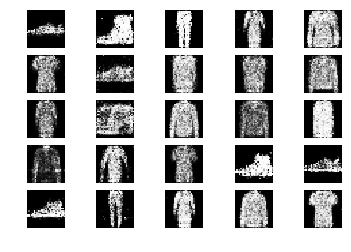

7801 [D loss: 0.746050, acc.: 48.44%] [G loss: 0.920352]
7802 [D loss: 0.698958, acc.: 54.69%] [G loss: 0.923826]
7803 [D loss: 0.643190, acc.: 67.19%] [G loss: 1.046318]
7804 [D loss: 0.673253, acc.: 57.81%] [G loss: 0.894060]
7805 [D loss: 0.659901, acc.: 59.38%] [G loss: 0.881969]
7806 [D loss: 0.665998, acc.: 53.12%] [G loss: 0.907283]
7807 [D loss: 0.667425, acc.: 59.38%] [G loss: 0.825876]
7808 [D loss: 0.631427, acc.: 64.06%] [G loss: 0.841983]
7809 [D loss: 0.658691, acc.: 65.62%] [G loss: 0.762695]
7810 [D loss: 0.717241, acc.: 54.69%] [G loss: 0.783912]
7811 [D loss: 0.649038, acc.: 57.81%] [G loss: 0.882952]
7812 [D loss: 0.609753, acc.: 65.62%] [G loss: 0.903306]
7813 [D loss: 0.635128, acc.: 60.94%] [G loss: 0.946656]
7814 [D loss: 0.637922, acc.: 70.31%] [G loss: 0.847445]
7815 [D loss: 0.667911, acc.: 64.06%] [G loss: 0.871062]
7816 [D loss: 0.646760, acc.: 56.25%] [G loss: 0.880693]
7817 [D loss: 0.605714, acc.: 70.31%] [G loss: 0.948934]
7818 [D loss: 0.619545, acc.: 6

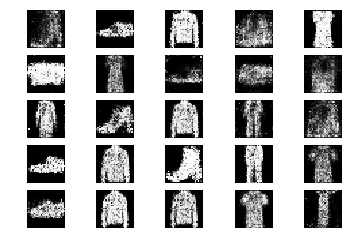

8001 [D loss: 0.649779, acc.: 59.38%] [G loss: 0.851150]
8002 [D loss: 0.681846, acc.: 51.56%] [G loss: 0.924952]
8003 [D loss: 0.640568, acc.: 64.06%] [G loss: 0.844197]
8004 [D loss: 0.619096, acc.: 67.19%] [G loss: 0.852063]
8005 [D loss: 0.608502, acc.: 71.88%] [G loss: 0.911852]
8006 [D loss: 0.624504, acc.: 65.62%] [G loss: 0.898411]
8007 [D loss: 0.669029, acc.: 48.44%] [G loss: 0.864847]
8008 [D loss: 0.624046, acc.: 60.94%] [G loss: 0.873150]
8009 [D loss: 0.698418, acc.: 50.00%] [G loss: 0.975564]
8010 [D loss: 0.621668, acc.: 65.62%] [G loss: 0.889778]
8011 [D loss: 0.683186, acc.: 57.81%] [G loss: 0.887875]
8012 [D loss: 0.674185, acc.: 60.94%] [G loss: 0.885988]
8013 [D loss: 0.620825, acc.: 65.62%] [G loss: 0.981658]
8014 [D loss: 0.659432, acc.: 54.69%] [G loss: 0.873528]
8015 [D loss: 0.616581, acc.: 62.50%] [G loss: 0.887693]
8016 [D loss: 0.670401, acc.: 59.38%] [G loss: 0.867238]
8017 [D loss: 0.645403, acc.: 65.62%] [G loss: 0.848917]
8018 [D loss: 0.639666, acc.: 5

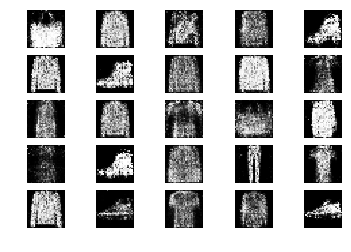

8201 [D loss: 0.737447, acc.: 53.12%] [G loss: 0.926477]
8202 [D loss: 0.592375, acc.: 67.19%] [G loss: 0.903435]
8203 [D loss: 0.664240, acc.: 60.94%] [G loss: 0.884169]
8204 [D loss: 0.622836, acc.: 57.81%] [G loss: 0.818663]
8205 [D loss: 0.641950, acc.: 65.62%] [G loss: 0.776039]
8206 [D loss: 0.681000, acc.: 57.81%] [G loss: 0.896120]
8207 [D loss: 0.672877, acc.: 57.81%] [G loss: 0.854199]
8208 [D loss: 0.624279, acc.: 65.62%] [G loss: 0.861878]
8209 [D loss: 0.616140, acc.: 62.50%] [G loss: 0.877812]
8210 [D loss: 0.600372, acc.: 70.31%] [G loss: 0.863553]
8211 [D loss: 0.626301, acc.: 62.50%] [G loss: 0.905682]
8212 [D loss: 0.658073, acc.: 60.94%] [G loss: 0.830431]
8213 [D loss: 0.681608, acc.: 54.69%] [G loss: 0.922128]
8214 [D loss: 0.640473, acc.: 62.50%] [G loss: 0.898147]
8215 [D loss: 0.610902, acc.: 73.44%] [G loss: 0.894222]
8216 [D loss: 0.663093, acc.: 59.38%] [G loss: 0.951891]
8217 [D loss: 0.678113, acc.: 54.69%] [G loss: 0.899163]
8218 [D loss: 0.646652, acc.: 6

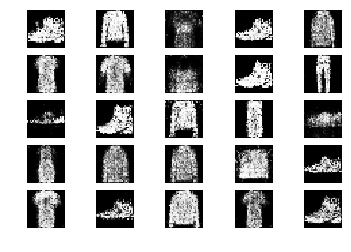

8401 [D loss: 0.686146, acc.: 70.31%] [G loss: 0.898039]
8402 [D loss: 0.650606, acc.: 64.06%] [G loss: 0.963852]
8403 [D loss: 0.643906, acc.: 67.19%] [G loss: 0.874236]
8404 [D loss: 0.692480, acc.: 53.12%] [G loss: 0.838292]
8405 [D loss: 0.716075, acc.: 53.12%] [G loss: 1.006232]
8406 [D loss: 0.659116, acc.: 59.38%] [G loss: 0.822972]
8407 [D loss: 0.609180, acc.: 67.19%] [G loss: 0.984652]
8408 [D loss: 0.660729, acc.: 62.50%] [G loss: 0.975180]
8409 [D loss: 0.691107, acc.: 57.81%] [G loss: 0.992042]
8410 [D loss: 0.640735, acc.: 64.06%] [G loss: 0.960134]
8411 [D loss: 0.676612, acc.: 53.12%] [G loss: 0.927218]
8412 [D loss: 0.645699, acc.: 64.06%] [G loss: 0.977833]
8413 [D loss: 0.593953, acc.: 71.88%] [G loss: 0.946551]
8414 [D loss: 0.609589, acc.: 70.31%] [G loss: 0.887201]
8415 [D loss: 0.675058, acc.: 56.25%] [G loss: 0.895261]
8416 [D loss: 0.666205, acc.: 56.25%] [G loss: 0.878393]
8417 [D loss: 0.675136, acc.: 64.06%] [G loss: 0.885285]
8418 [D loss: 0.569512, acc.: 7

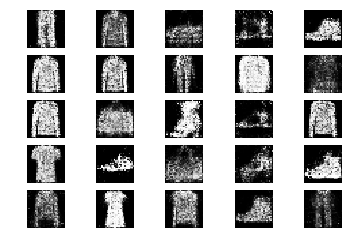

8601 [D loss: 0.598447, acc.: 65.62%] [G loss: 0.925049]
8602 [D loss: 0.603943, acc.: 71.88%] [G loss: 0.972317]
8603 [D loss: 0.642405, acc.: 67.19%] [G loss: 0.925680]
8604 [D loss: 0.709891, acc.: 56.25%] [G loss: 0.845329]
8605 [D loss: 0.671288, acc.: 59.38%] [G loss: 0.825408]
8606 [D loss: 0.688196, acc.: 60.94%] [G loss: 0.867175]
8607 [D loss: 0.713892, acc.: 54.69%] [G loss: 0.941068]
8608 [D loss: 0.647474, acc.: 64.06%] [G loss: 1.068041]
8609 [D loss: 0.689896, acc.: 60.94%] [G loss: 0.976898]
8610 [D loss: 0.665662, acc.: 65.62%] [G loss: 0.901130]
8611 [D loss: 0.668889, acc.: 65.62%] [G loss: 0.949377]
8612 [D loss: 0.659578, acc.: 53.12%] [G loss: 1.000445]
8613 [D loss: 0.715298, acc.: 51.56%] [G loss: 0.964045]
8614 [D loss: 0.592367, acc.: 68.75%] [G loss: 1.026443]
8615 [D loss: 0.703269, acc.: 57.81%] [G loss: 0.940308]
8616 [D loss: 0.581675, acc.: 75.00%] [G loss: 1.013890]
8617 [D loss: 0.698810, acc.: 54.69%] [G loss: 0.915446]
8618 [D loss: 0.667827, acc.: 5

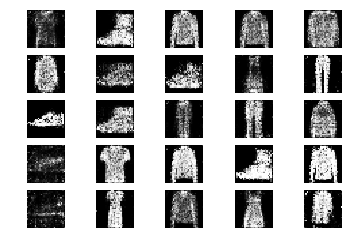

8801 [D loss: 0.582818, acc.: 73.44%] [G loss: 0.973873]
8802 [D loss: 0.680405, acc.: 60.94%] [G loss: 0.896224]
8803 [D loss: 0.605789, acc.: 67.19%] [G loss: 0.863974]
8804 [D loss: 0.635079, acc.: 60.94%] [G loss: 0.969012]
8805 [D loss: 0.638500, acc.: 67.19%] [G loss: 0.955286]
8806 [D loss: 0.684087, acc.: 53.12%] [G loss: 1.037727]
8807 [D loss: 0.621664, acc.: 68.75%] [G loss: 0.902256]
8808 [D loss: 0.661205, acc.: 57.81%] [G loss: 0.810599]
8809 [D loss: 0.633283, acc.: 57.81%] [G loss: 0.764731]
8810 [D loss: 0.677363, acc.: 46.88%] [G loss: 0.943902]
8811 [D loss: 0.662326, acc.: 57.81%] [G loss: 0.877594]
8812 [D loss: 0.667605, acc.: 62.50%] [G loss: 0.936674]
8813 [D loss: 0.633945, acc.: 65.62%] [G loss: 0.862692]
8814 [D loss: 0.603735, acc.: 70.31%] [G loss: 0.840211]
8815 [D loss: 0.677437, acc.: 59.38%] [G loss: 0.886418]
8816 [D loss: 0.649020, acc.: 65.62%] [G loss: 0.980680]
8817 [D loss: 0.654235, acc.: 57.81%] [G loss: 1.014047]
8818 [D loss: 0.673163, acc.: 5

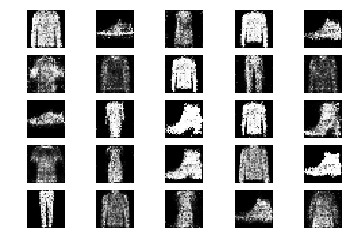

9001 [D loss: 0.660345, acc.: 57.81%] [G loss: 0.844576]
9002 [D loss: 0.626307, acc.: 65.62%] [G loss: 0.786982]
9003 [D loss: 0.633450, acc.: 64.06%] [G loss: 0.885586]
9004 [D loss: 0.676522, acc.: 57.81%] [G loss: 0.868768]
9005 [D loss: 0.631627, acc.: 65.62%] [G loss: 0.832349]
9006 [D loss: 0.788703, acc.: 46.88%] [G loss: 0.884046]
9007 [D loss: 0.563657, acc.: 73.44%] [G loss: 0.963465]
9008 [D loss: 0.639970, acc.: 62.50%] [G loss: 0.915511]
9009 [D loss: 0.624967, acc.: 60.94%] [G loss: 0.978474]
9010 [D loss: 0.655884, acc.: 60.94%] [G loss: 0.944499]
9011 [D loss: 0.655482, acc.: 65.62%] [G loss: 0.923432]
9012 [D loss: 0.696514, acc.: 64.06%] [G loss: 0.891456]
9013 [D loss: 0.662735, acc.: 59.38%] [G loss: 0.845010]
9014 [D loss: 0.578694, acc.: 79.69%] [G loss: 0.880437]
9015 [D loss: 0.659979, acc.: 62.50%] [G loss: 0.897344]
9016 [D loss: 0.605252, acc.: 65.62%] [G loss: 0.883162]
9017 [D loss: 0.703592, acc.: 50.00%] [G loss: 0.910260]
9018 [D loss: 0.627508, acc.: 6

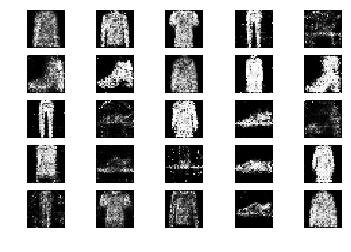

9201 [D loss: 0.624605, acc.: 65.62%] [G loss: 0.864193]
9202 [D loss: 0.717602, acc.: 46.88%] [G loss: 0.973705]
9203 [D loss: 0.694681, acc.: 53.12%] [G loss: 0.837477]
9204 [D loss: 0.708614, acc.: 56.25%] [G loss: 0.842683]
9205 [D loss: 0.637487, acc.: 68.75%] [G loss: 1.064248]
9206 [D loss: 0.623776, acc.: 67.19%] [G loss: 0.940870]
9207 [D loss: 0.694475, acc.: 50.00%] [G loss: 0.971063]
9208 [D loss: 0.731382, acc.: 54.69%] [G loss: 0.988276]
9209 [D loss: 0.665539, acc.: 65.62%] [G loss: 0.901018]
9210 [D loss: 0.655223, acc.: 57.81%] [G loss: 0.835398]
9211 [D loss: 0.675105, acc.: 60.94%] [G loss: 0.867646]
9212 [D loss: 0.698640, acc.: 46.88%] [G loss: 0.957765]
9213 [D loss: 0.699137, acc.: 54.69%] [G loss: 0.831285]
9214 [D loss: 0.622417, acc.: 71.88%] [G loss: 0.878788]
9215 [D loss: 0.624370, acc.: 62.50%] [G loss: 0.866365]
9216 [D loss: 0.607237, acc.: 68.75%] [G loss: 0.901430]
9217 [D loss: 0.689524, acc.: 53.12%] [G loss: 0.856941]
9218 [D loss: 0.641903, acc.: 6

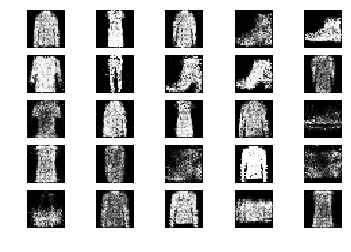

9401 [D loss: 0.638036, acc.: 62.50%] [G loss: 0.967647]
9402 [D loss: 0.758359, acc.: 54.69%] [G loss: 0.865505]
9403 [D loss: 0.627482, acc.: 64.06%] [G loss: 0.941523]
9404 [D loss: 0.655654, acc.: 62.50%] [G loss: 0.993790]
9405 [D loss: 0.672535, acc.: 59.38%] [G loss: 0.964571]
9406 [D loss: 0.677366, acc.: 53.12%] [G loss: 0.939549]
9407 [D loss: 0.654126, acc.: 64.06%] [G loss: 0.914570]
9408 [D loss: 0.666587, acc.: 62.50%] [G loss: 0.996520]
9409 [D loss: 0.661152, acc.: 62.50%] [G loss: 0.939868]
9410 [D loss: 0.671874, acc.: 57.81%] [G loss: 0.925267]
9411 [D loss: 0.661255, acc.: 60.94%] [G loss: 0.944347]
9412 [D loss: 0.643487, acc.: 60.94%] [G loss: 0.949060]
9413 [D loss: 0.632481, acc.: 65.62%] [G loss: 0.910261]
9414 [D loss: 0.625149, acc.: 60.94%] [G loss: 0.972478]
9415 [D loss: 0.576409, acc.: 71.88%] [G loss: 0.933932]
9416 [D loss: 0.657341, acc.: 62.50%] [G loss: 0.874477]
9417 [D loss: 0.640910, acc.: 68.75%] [G loss: 0.914522]
9418 [D loss: 0.704402, acc.: 5

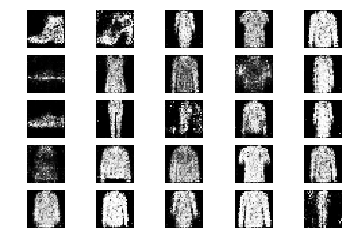

9601 [D loss: 0.624833, acc.: 67.19%] [G loss: 0.959891]
9602 [D loss: 0.659070, acc.: 56.25%] [G loss: 0.890630]
9603 [D loss: 0.611553, acc.: 67.19%] [G loss: 0.904934]
9604 [D loss: 0.736379, acc.: 48.44%] [G loss: 0.898229]
9605 [D loss: 0.616425, acc.: 71.88%] [G loss: 0.834568]
9606 [D loss: 0.643616, acc.: 64.06%] [G loss: 0.841480]
9607 [D loss: 0.598838, acc.: 64.06%] [G loss: 0.871786]
9608 [D loss: 0.691721, acc.: 53.12%] [G loss: 0.907696]
9609 [D loss: 0.670964, acc.: 60.94%] [G loss: 0.923112]
9610 [D loss: 0.628097, acc.: 70.31%] [G loss: 0.896206]
9611 [D loss: 0.659125, acc.: 57.81%] [G loss: 1.001887]
9612 [D loss: 0.691899, acc.: 57.81%] [G loss: 1.018106]
9613 [D loss: 0.626241, acc.: 56.25%] [G loss: 0.968657]
9614 [D loss: 0.560213, acc.: 71.88%] [G loss: 0.985472]
9615 [D loss: 0.738495, acc.: 45.31%] [G loss: 0.839240]
9616 [D loss: 0.706846, acc.: 51.56%] [G loss: 0.776730]
9617 [D loss: 0.605273, acc.: 57.81%] [G loss: 0.929580]
9618 [D loss: 0.701694, acc.: 4

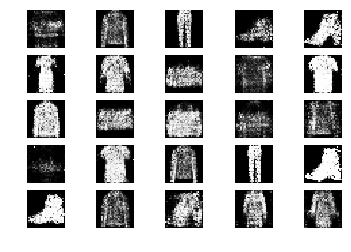

9801 [D loss: 0.649083, acc.: 62.50%] [G loss: 0.854135]
9802 [D loss: 0.612903, acc.: 71.88%] [G loss: 0.928236]
9803 [D loss: 0.636229, acc.: 60.94%] [G loss: 0.901513]
9804 [D loss: 0.620781, acc.: 67.19%] [G loss: 0.852590]
9805 [D loss: 0.690523, acc.: 53.12%] [G loss: 0.910702]
9806 [D loss: 0.622935, acc.: 70.31%] [G loss: 0.866489]
9807 [D loss: 0.629394, acc.: 64.06%] [G loss: 0.986304]
9808 [D loss: 0.618584, acc.: 71.88%] [G loss: 0.882904]
9809 [D loss: 0.683458, acc.: 54.69%] [G loss: 0.863153]
9810 [D loss: 0.660615, acc.: 57.81%] [G loss: 0.887098]
9811 [D loss: 0.567996, acc.: 73.44%] [G loss: 0.951399]
9812 [D loss: 0.611347, acc.: 67.19%] [G loss: 0.944725]
9813 [D loss: 0.642436, acc.: 65.62%] [G loss: 0.885236]
9814 [D loss: 0.600476, acc.: 67.19%] [G loss: 0.855894]
9815 [D loss: 0.637359, acc.: 64.06%] [G loss: 0.896134]
9816 [D loss: 0.670462, acc.: 54.69%] [G loss: 0.906573]
9817 [D loss: 0.580737, acc.: 75.00%] [G loss: 0.981490]
9818 [D loss: 0.747770, acc.: 4

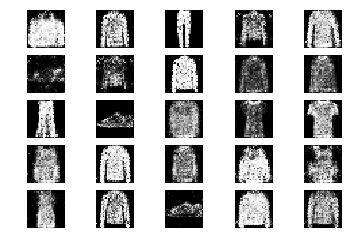

10001 [D loss: 0.590031, acc.: 70.31%] [G loss: 0.826913]
10002 [D loss: 0.616357, acc.: 60.94%] [G loss: 0.847421]
10003 [D loss: 0.624813, acc.: 68.75%] [G loss: 0.866585]
10004 [D loss: 0.666068, acc.: 59.38%] [G loss: 0.863338]
10005 [D loss: 0.667234, acc.: 54.69%] [G loss: 0.858267]
10006 [D loss: 0.638412, acc.: 62.50%] [G loss: 0.820068]
10007 [D loss: 0.629194, acc.: 62.50%] [G loss: 0.888453]
10008 [D loss: 0.653637, acc.: 56.25%] [G loss: 0.799823]
10009 [D loss: 0.606682, acc.: 65.62%] [G loss: 0.856591]
10010 [D loss: 0.632887, acc.: 64.06%] [G loss: 0.930492]
10011 [D loss: 0.744568, acc.: 46.88%] [G loss: 0.957067]
10012 [D loss: 0.613302, acc.: 68.75%] [G loss: 1.096173]
10013 [D loss: 0.670884, acc.: 65.62%] [G loss: 0.894133]
10014 [D loss: 0.684580, acc.: 54.69%] [G loss: 0.800219]
10015 [D loss: 0.649992, acc.: 62.50%] [G loss: 0.951806]
10016 [D loss: 0.602589, acc.: 71.88%] [G loss: 1.002938]
10017 [D loss: 0.641518, acc.: 67.19%] [G loss: 0.888806]
10018 [D loss:

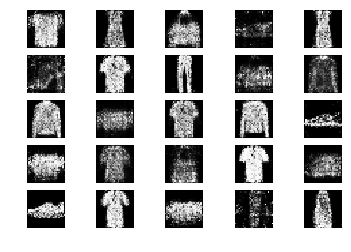

10201 [D loss: 0.691358, acc.: 59.38%] [G loss: 0.903904]
10202 [D loss: 0.624286, acc.: 64.06%] [G loss: 0.907228]
10203 [D loss: 0.632871, acc.: 64.06%] [G loss: 0.870177]
10204 [D loss: 0.650716, acc.: 59.38%] [G loss: 0.926642]
10205 [D loss: 0.690670, acc.: 60.94%] [G loss: 0.901556]
10206 [D loss: 0.670068, acc.: 59.38%] [G loss: 0.910281]
10207 [D loss: 0.612526, acc.: 65.62%] [G loss: 0.952006]
10208 [D loss: 0.651527, acc.: 62.50%] [G loss: 0.882369]
10209 [D loss: 0.595797, acc.: 73.44%] [G loss: 0.912486]
10210 [D loss: 0.757792, acc.: 56.25%] [G loss: 0.935299]
10211 [D loss: 0.686472, acc.: 59.38%] [G loss: 0.892733]
10212 [D loss: 0.641020, acc.: 64.06%] [G loss: 0.912824]
10213 [D loss: 0.685272, acc.: 53.12%] [G loss: 0.884627]
10214 [D loss: 0.632769, acc.: 59.38%] [G loss: 0.881514]
10215 [D loss: 0.581112, acc.: 75.00%] [G loss: 0.913776]
10216 [D loss: 0.649082, acc.: 71.88%] [G loss: 0.923070]
10217 [D loss: 0.688701, acc.: 54.69%] [G loss: 0.851722]
10218 [D loss:

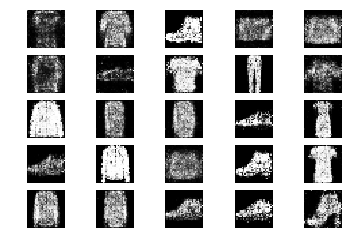

10401 [D loss: 0.626811, acc.: 65.62%] [G loss: 0.889750]
10402 [D loss: 0.702460, acc.: 60.94%] [G loss: 0.962652]
10403 [D loss: 0.683292, acc.: 51.56%] [G loss: 0.972425]
10404 [D loss: 0.626697, acc.: 65.62%] [G loss: 1.039589]
10405 [D loss: 0.632542, acc.: 53.12%] [G loss: 0.988970]
10406 [D loss: 0.632744, acc.: 59.38%] [G loss: 0.940610]
10407 [D loss: 0.631408, acc.: 67.19%] [G loss: 0.872897]
10408 [D loss: 0.578680, acc.: 76.56%] [G loss: 0.917594]
10409 [D loss: 0.612081, acc.: 68.75%] [G loss: 0.990615]
10410 [D loss: 0.616409, acc.: 64.06%] [G loss: 0.911156]
10411 [D loss: 0.645172, acc.: 60.94%] [G loss: 0.850103]
10412 [D loss: 0.711038, acc.: 51.56%] [G loss: 0.837071]
10413 [D loss: 0.632437, acc.: 65.62%] [G loss: 0.932422]
10414 [D loss: 0.628495, acc.: 68.75%] [G loss: 0.965540]
10415 [D loss: 0.649094, acc.: 64.06%] [G loss: 0.912950]
10416 [D loss: 0.687785, acc.: 64.06%] [G loss: 0.989697]
10417 [D loss: 0.662301, acc.: 67.19%] [G loss: 0.947956]
10418 [D loss:

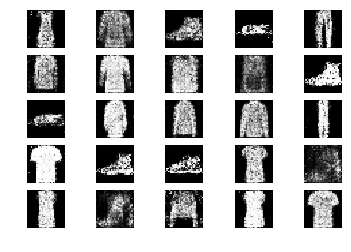

10601 [D loss: 0.622207, acc.: 65.62%] [G loss: 0.895499]
10602 [D loss: 0.584876, acc.: 67.19%] [G loss: 0.929215]
10603 [D loss: 0.644024, acc.: 62.50%] [G loss: 0.979304]
10604 [D loss: 0.754491, acc.: 45.31%] [G loss: 0.977430]
10605 [D loss: 0.733793, acc.: 50.00%] [G loss: 0.941281]
10606 [D loss: 0.672689, acc.: 59.38%] [G loss: 0.967156]
10607 [D loss: 0.614790, acc.: 59.38%] [G loss: 0.943390]
10608 [D loss: 0.608909, acc.: 68.75%] [G loss: 0.987381]
10609 [D loss: 0.657967, acc.: 59.38%] [G loss: 0.824097]
10610 [D loss: 0.678763, acc.: 56.25%] [G loss: 0.847132]
10611 [D loss: 0.584058, acc.: 62.50%] [G loss: 0.964859]
10612 [D loss: 0.640999, acc.: 59.38%] [G loss: 0.954727]
10613 [D loss: 0.661319, acc.: 56.25%] [G loss: 0.922220]
10614 [D loss: 0.679902, acc.: 60.94%] [G loss: 0.836318]
10615 [D loss: 0.669262, acc.: 56.25%] [G loss: 0.834382]
10616 [D loss: 0.582176, acc.: 65.62%] [G loss: 0.790545]
10617 [D loss: 0.702717, acc.: 54.69%] [G loss: 0.879336]
10618 [D loss:

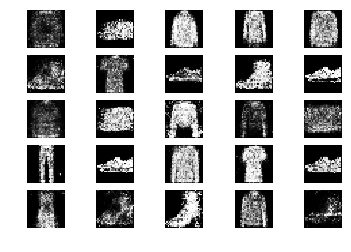

10801 [D loss: 0.605323, acc.: 64.06%] [G loss: 0.900784]
10802 [D loss: 0.678999, acc.: 62.50%] [G loss: 0.968469]
10803 [D loss: 0.620280, acc.: 64.06%] [G loss: 0.960009]
10804 [D loss: 0.693594, acc.: 53.12%] [G loss: 0.937912]
10805 [D loss: 0.718379, acc.: 53.12%] [G loss: 0.825766]
10806 [D loss: 0.619425, acc.: 65.62%] [G loss: 0.899762]
10807 [D loss: 0.580918, acc.: 76.56%] [G loss: 0.919147]
10808 [D loss: 0.624879, acc.: 67.19%] [G loss: 0.893348]
10809 [D loss: 0.615945, acc.: 64.06%] [G loss: 0.857196]
10810 [D loss: 0.655258, acc.: 56.25%] [G loss: 0.816389]
10811 [D loss: 0.644822, acc.: 65.62%] [G loss: 0.925321]
10812 [D loss: 0.631740, acc.: 60.94%] [G loss: 0.931752]
10813 [D loss: 0.663520, acc.: 57.81%] [G loss: 0.879639]
10814 [D loss: 0.627913, acc.: 64.06%] [G loss: 0.901548]
10815 [D loss: 0.647651, acc.: 59.38%] [G loss: 0.926163]
10816 [D loss: 0.668020, acc.: 62.50%] [G loss: 0.994370]
10817 [D loss: 0.655318, acc.: 71.88%] [G loss: 0.928959]
10818 [D loss:

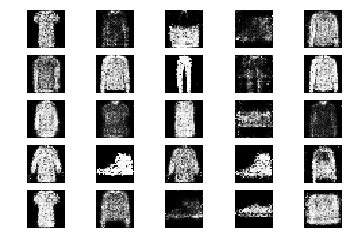

11001 [D loss: 0.667858, acc.: 60.94%] [G loss: 0.814402]
11002 [D loss: 0.685669, acc.: 60.94%] [G loss: 0.899790]
11003 [D loss: 0.708047, acc.: 53.12%] [G loss: 0.808423]
11004 [D loss: 0.625404, acc.: 65.62%] [G loss: 0.883695]
11005 [D loss: 0.705205, acc.: 50.00%] [G loss: 0.922854]
11006 [D loss: 0.657562, acc.: 59.38%] [G loss: 0.920677]
11007 [D loss: 0.635210, acc.: 60.94%] [G loss: 0.921549]
11008 [D loss: 0.635307, acc.: 65.62%] [G loss: 0.885950]
11009 [D loss: 0.669854, acc.: 57.81%] [G loss: 0.837873]
11010 [D loss: 0.662694, acc.: 59.38%] [G loss: 0.872135]
11011 [D loss: 0.624949, acc.: 62.50%] [G loss: 0.973970]
11012 [D loss: 0.647290, acc.: 65.62%] [G loss: 0.913666]
11013 [D loss: 0.708419, acc.: 50.00%] [G loss: 0.894055]
11014 [D loss: 0.629753, acc.: 67.19%] [G loss: 0.932429]
11015 [D loss: 0.685407, acc.: 56.25%] [G loss: 0.927625]
11016 [D loss: 0.620924, acc.: 60.94%] [G loss: 0.942422]
11017 [D loss: 0.603514, acc.: 67.19%] [G loss: 0.853727]
11018 [D loss:

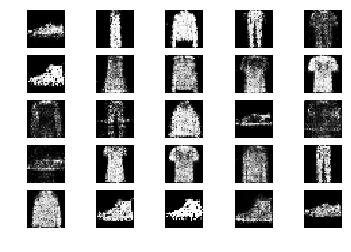

11201 [D loss: 0.717386, acc.: 51.56%] [G loss: 0.920177]
11202 [D loss: 0.683040, acc.: 67.19%] [G loss: 0.960939]
11203 [D loss: 0.624367, acc.: 73.44%] [G loss: 1.039575]
11204 [D loss: 0.679779, acc.: 57.81%] [G loss: 0.895947]
11205 [D loss: 0.641392, acc.: 60.94%] [G loss: 0.938571]
11206 [D loss: 0.660713, acc.: 62.50%] [G loss: 0.875068]
11207 [D loss: 0.642136, acc.: 67.19%] [G loss: 0.874380]
11208 [D loss: 0.625350, acc.: 62.50%] [G loss: 0.858260]
11209 [D loss: 0.683292, acc.: 60.94%] [G loss: 0.842692]
11210 [D loss: 0.642709, acc.: 67.19%] [G loss: 0.812761]
11211 [D loss: 0.680504, acc.: 59.38%] [G loss: 0.907529]
11212 [D loss: 0.698003, acc.: 57.81%] [G loss: 0.896361]
11213 [D loss: 0.573661, acc.: 73.44%] [G loss: 0.878566]
11214 [D loss: 0.695013, acc.: 54.69%] [G loss: 0.814721]
11215 [D loss: 0.623708, acc.: 65.62%] [G loss: 0.928766]
11216 [D loss: 0.660437, acc.: 59.38%] [G loss: 0.887681]
11217 [D loss: 0.616808, acc.: 60.94%] [G loss: 0.954327]
11218 [D loss:

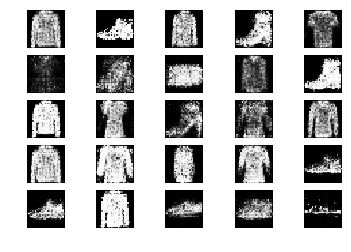

11401 [D loss: 0.639231, acc.: 59.38%] [G loss: 0.900920]
11402 [D loss: 0.737049, acc.: 45.31%] [G loss: 0.946676]
11403 [D loss: 0.643579, acc.: 59.38%] [G loss: 1.075324]
11404 [D loss: 0.708366, acc.: 53.12%] [G loss: 0.892707]
11405 [D loss: 0.649088, acc.: 65.62%] [G loss: 0.976236]
11406 [D loss: 0.724391, acc.: 54.69%] [G loss: 0.851878]
11407 [D loss: 0.659057, acc.: 57.81%] [G loss: 0.934200]
11408 [D loss: 0.639663, acc.: 62.50%] [G loss: 0.955110]
11409 [D loss: 0.688907, acc.: 62.50%] [G loss: 0.879169]
11410 [D loss: 0.698760, acc.: 60.94%] [G loss: 0.865222]
11411 [D loss: 0.625300, acc.: 64.06%] [G loss: 0.945302]
11412 [D loss: 0.708295, acc.: 51.56%] [G loss: 0.952700]
11413 [D loss: 0.625698, acc.: 64.06%] [G loss: 0.971292]
11414 [D loss: 0.704964, acc.: 56.25%] [G loss: 0.971852]
11415 [D loss: 0.752113, acc.: 48.44%] [G loss: 0.937031]
11416 [D loss: 0.654953, acc.: 65.62%] [G loss: 0.874538]
11417 [D loss: 0.680761, acc.: 67.19%] [G loss: 0.869444]
11418 [D loss:

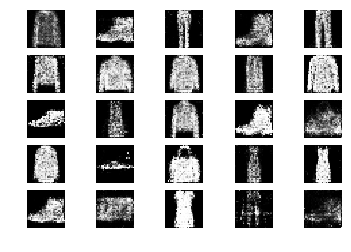

11601 [D loss: 0.636365, acc.: 64.06%] [G loss: 0.971756]
11602 [D loss: 0.628358, acc.: 54.69%] [G loss: 1.015949]
11603 [D loss: 0.615140, acc.: 67.19%] [G loss: 0.831413]
11604 [D loss: 0.645509, acc.: 60.94%] [G loss: 0.889206]
11605 [D loss: 0.637143, acc.: 59.38%] [G loss: 0.848014]
11606 [D loss: 0.662583, acc.: 62.50%] [G loss: 0.889926]
11607 [D loss: 0.712444, acc.: 50.00%] [G loss: 0.914899]
11608 [D loss: 0.662137, acc.: 54.69%] [G loss: 0.895888]
11609 [D loss: 0.687689, acc.: 62.50%] [G loss: 0.925503]
11610 [D loss: 0.634099, acc.: 65.62%] [G loss: 0.924673]
11611 [D loss: 0.679411, acc.: 48.44%] [G loss: 0.913377]
11612 [D loss: 0.698595, acc.: 50.00%] [G loss: 0.968426]
11613 [D loss: 0.662163, acc.: 60.94%] [G loss: 0.874147]
11614 [D loss: 0.679032, acc.: 59.38%] [G loss: 0.875973]
11615 [D loss: 0.604856, acc.: 65.62%] [G loss: 0.924718]
11616 [D loss: 0.611108, acc.: 68.75%] [G loss: 0.858100]
11617 [D loss: 0.658074, acc.: 56.25%] [G loss: 0.765965]
11618 [D loss:

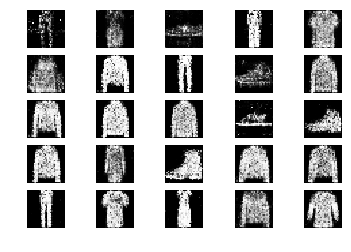

11801 [D loss: 0.683364, acc.: 53.12%] [G loss: 0.805262]
11802 [D loss: 0.703825, acc.: 53.12%] [G loss: 0.850707]
11803 [D loss: 0.660913, acc.: 56.25%] [G loss: 0.861241]
11804 [D loss: 0.692502, acc.: 57.81%] [G loss: 0.915651]
11805 [D loss: 0.724070, acc.: 42.19%] [G loss: 0.847194]
11806 [D loss: 0.621713, acc.: 67.19%] [G loss: 0.920865]
11807 [D loss: 0.689557, acc.: 53.12%] [G loss: 0.927258]
11808 [D loss: 0.630857, acc.: 71.88%] [G loss: 0.907831]
11809 [D loss: 0.646272, acc.: 60.94%] [G loss: 0.918443]
11810 [D loss: 0.664579, acc.: 54.69%] [G loss: 0.884344]
11811 [D loss: 0.697575, acc.: 48.44%] [G loss: 0.825385]
11812 [D loss: 0.645489, acc.: 68.75%] [G loss: 0.862346]
11813 [D loss: 0.643184, acc.: 62.50%] [G loss: 0.871400]
11814 [D loss: 0.619251, acc.: 62.50%] [G loss: 0.928838]
11815 [D loss: 0.659392, acc.: 60.94%] [G loss: 0.913085]
11816 [D loss: 0.694529, acc.: 56.25%] [G loss: 0.952658]
11817 [D loss: 0.653639, acc.: 64.06%] [G loss: 0.928761]
11818 [D loss:

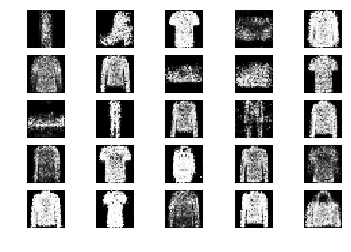

12001 [D loss: 0.649794, acc.: 57.81%] [G loss: 0.860124]
12002 [D loss: 0.661802, acc.: 60.94%] [G loss: 0.905147]
12003 [D loss: 0.700721, acc.: 60.94%] [G loss: 0.826599]
12004 [D loss: 0.648525, acc.: 60.94%] [G loss: 0.953581]
12005 [D loss: 0.638219, acc.: 64.06%] [G loss: 0.978168]
12006 [D loss: 0.626070, acc.: 64.06%] [G loss: 0.913224]
12007 [D loss: 0.591326, acc.: 70.31%] [G loss: 0.896178]
12008 [D loss: 0.685570, acc.: 57.81%] [G loss: 1.021863]
12009 [D loss: 0.673519, acc.: 64.06%] [G loss: 0.829249]
12010 [D loss: 0.631355, acc.: 65.62%] [G loss: 1.018364]
12011 [D loss: 0.660370, acc.: 59.38%] [G loss: 0.891211]
12012 [D loss: 0.673668, acc.: 62.50%] [G loss: 0.915999]
12013 [D loss: 0.649165, acc.: 62.50%] [G loss: 0.973694]
12014 [D loss: 0.620585, acc.: 64.06%] [G loss: 0.978058]
12015 [D loss: 0.581654, acc.: 75.00%] [G loss: 0.966719]
12016 [D loss: 0.650893, acc.: 62.50%] [G loss: 0.863808]
12017 [D loss: 0.643565, acc.: 70.31%] [G loss: 0.931293]
12018 [D loss:

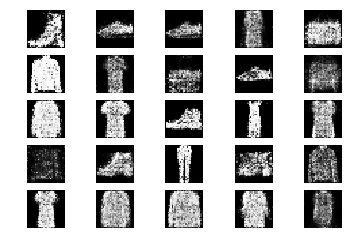

12201 [D loss: 0.709529, acc.: 46.88%] [G loss: 0.844365]
12202 [D loss: 0.655864, acc.: 53.12%] [G loss: 0.835503]
12203 [D loss: 0.683302, acc.: 65.62%] [G loss: 0.917677]
12204 [D loss: 0.609631, acc.: 67.19%] [G loss: 0.880785]
12205 [D loss: 0.655376, acc.: 64.06%] [G loss: 0.850431]
12206 [D loss: 0.629089, acc.: 65.62%] [G loss: 0.940407]
12207 [D loss: 0.675400, acc.: 54.69%] [G loss: 0.973857]
12208 [D loss: 0.695973, acc.: 56.25%] [G loss: 0.799968]
12209 [D loss: 0.636922, acc.: 57.81%] [G loss: 0.882905]
12210 [D loss: 0.621875, acc.: 64.06%] [G loss: 0.869541]
12211 [D loss: 0.611677, acc.: 64.06%] [G loss: 0.866118]
12212 [D loss: 0.647404, acc.: 65.62%] [G loss: 0.899587]
12213 [D loss: 0.724385, acc.: 59.38%] [G loss: 0.876610]
12214 [D loss: 0.611615, acc.: 73.44%] [G loss: 0.974426]
12215 [D loss: 0.676470, acc.: 57.81%] [G loss: 0.980512]
12216 [D loss: 0.608536, acc.: 70.31%] [G loss: 0.989182]
12217 [D loss: 0.665217, acc.: 60.94%] [G loss: 0.922746]
12218 [D loss:

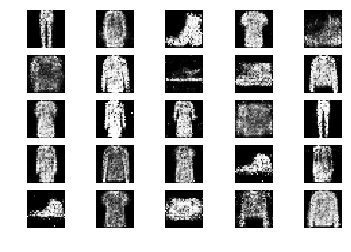

12401 [D loss: 0.625851, acc.: 65.62%] [G loss: 0.940656]
12402 [D loss: 0.624553, acc.: 65.62%] [G loss: 0.843419]
12403 [D loss: 0.647956, acc.: 60.94%] [G loss: 0.893639]
12404 [D loss: 0.641347, acc.: 64.06%] [G loss: 0.949038]
12405 [D loss: 0.627913, acc.: 64.06%] [G loss: 0.884669]
12406 [D loss: 0.629726, acc.: 65.62%] [G loss: 0.886982]
12407 [D loss: 0.611455, acc.: 73.44%] [G loss: 0.892809]
12408 [D loss: 0.745995, acc.: 48.44%] [G loss: 0.943235]
12409 [D loss: 0.656408, acc.: 59.38%] [G loss: 0.944857]
12410 [D loss: 0.659282, acc.: 60.94%] [G loss: 0.971772]
12411 [D loss: 0.587705, acc.: 67.19%] [G loss: 1.043866]
12412 [D loss: 0.650045, acc.: 59.38%] [G loss: 1.007101]
12413 [D loss: 0.674793, acc.: 54.69%] [G loss: 0.899514]
12414 [D loss: 0.591632, acc.: 71.88%] [G loss: 0.906530]
12415 [D loss: 0.739979, acc.: 48.44%] [G loss: 0.801562]
12416 [D loss: 0.704562, acc.: 51.56%] [G loss: 0.823229]
12417 [D loss: 0.558210, acc.: 70.31%] [G loss: 0.973587]
12418 [D loss:

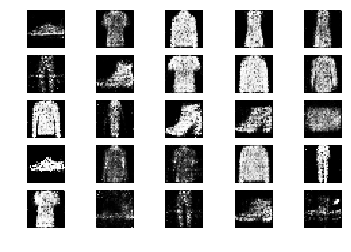

12601 [D loss: 0.684137, acc.: 57.81%] [G loss: 0.852270]
12602 [D loss: 0.728014, acc.: 50.00%] [G loss: 0.935649]
12603 [D loss: 0.662620, acc.: 64.06%] [G loss: 0.890861]
12604 [D loss: 0.652036, acc.: 64.06%] [G loss: 0.906070]
12605 [D loss: 0.607499, acc.: 71.88%] [G loss: 0.831389]
12606 [D loss: 0.631702, acc.: 60.94%] [G loss: 0.829044]
12607 [D loss: 0.621978, acc.: 67.19%] [G loss: 0.844104]
12608 [D loss: 0.676128, acc.: 62.50%] [G loss: 0.934616]
12609 [D loss: 0.648761, acc.: 62.50%] [G loss: 0.939608]
12610 [D loss: 0.676031, acc.: 56.25%] [G loss: 0.869806]
12611 [D loss: 0.663326, acc.: 56.25%] [G loss: 0.952181]
12612 [D loss: 0.647199, acc.: 60.94%] [G loss: 0.924149]
12613 [D loss: 0.655448, acc.: 60.94%] [G loss: 0.931860]
12614 [D loss: 0.639807, acc.: 64.06%] [G loss: 0.872830]
12615 [D loss: 0.652495, acc.: 59.38%] [G loss: 0.914825]
12616 [D loss: 0.642337, acc.: 57.81%] [G loss: 0.849929]
12617 [D loss: 0.613564, acc.: 67.19%] [G loss: 0.918306]
12618 [D loss:

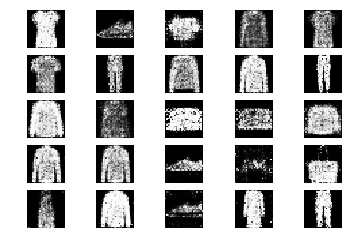

12801 [D loss: 0.671667, acc.: 59.38%] [G loss: 0.960071]
12802 [D loss: 0.626895, acc.: 64.06%] [G loss: 0.903844]
12803 [D loss: 0.657105, acc.: 56.25%] [G loss: 0.923671]
12804 [D loss: 0.637137, acc.: 62.50%] [G loss: 0.873301]
12805 [D loss: 0.674359, acc.: 56.25%] [G loss: 0.859794]
12806 [D loss: 0.617612, acc.: 59.38%] [G loss: 0.884714]
12807 [D loss: 0.650300, acc.: 67.19%] [G loss: 0.913724]
12808 [D loss: 0.591509, acc.: 68.75%] [G loss: 0.906983]
12809 [D loss: 0.594456, acc.: 68.75%] [G loss: 1.030471]
12810 [D loss: 0.656112, acc.: 57.81%] [G loss: 0.923393]
12811 [D loss: 0.617182, acc.: 67.19%] [G loss: 0.866753]
12812 [D loss: 0.693462, acc.: 56.25%] [G loss: 0.906084]
12813 [D loss: 0.680936, acc.: 54.69%] [G loss: 0.879520]
12814 [D loss: 0.639117, acc.: 68.75%] [G loss: 0.970558]
12815 [D loss: 0.592331, acc.: 76.56%] [G loss: 0.982550]
12816 [D loss: 0.618714, acc.: 57.81%] [G loss: 0.970709]
12817 [D loss: 0.586630, acc.: 67.19%] [G loss: 0.896416]
12818 [D loss:

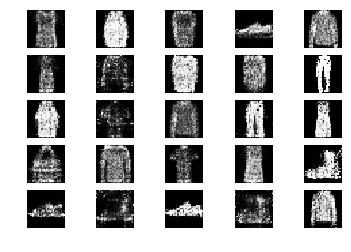

13001 [D loss: 0.650450, acc.: 64.06%] [G loss: 0.935654]
13002 [D loss: 0.664395, acc.: 64.06%] [G loss: 0.947081]
13003 [D loss: 0.592951, acc.: 68.75%] [G loss: 0.887950]
13004 [D loss: 0.663848, acc.: 56.25%] [G loss: 0.982720]
13005 [D loss: 0.634546, acc.: 60.94%] [G loss: 0.962594]
13006 [D loss: 0.630911, acc.: 60.94%] [G loss: 0.959340]
13007 [D loss: 0.678205, acc.: 57.81%] [G loss: 1.000318]
13008 [D loss: 0.572743, acc.: 73.44%] [G loss: 0.918643]
13009 [D loss: 0.629901, acc.: 59.38%] [G loss: 1.000510]
13010 [D loss: 0.685243, acc.: 51.56%] [G loss: 0.876663]
13011 [D loss: 0.627885, acc.: 62.50%] [G loss: 0.965707]
13012 [D loss: 0.644175, acc.: 59.38%] [G loss: 0.941031]
13013 [D loss: 0.590368, acc.: 67.19%] [G loss: 0.919873]
13014 [D loss: 0.701928, acc.: 59.38%] [G loss: 0.834649]
13015 [D loss: 0.684081, acc.: 51.56%] [G loss: 0.978861]
13016 [D loss: 0.628066, acc.: 65.62%] [G loss: 0.955630]
13017 [D loss: 0.608453, acc.: 71.88%] [G loss: 0.932715]
13018 [D loss:

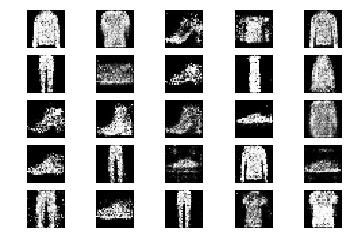

13201 [D loss: 0.648126, acc.: 54.69%] [G loss: 1.000023]
13202 [D loss: 0.610772, acc.: 70.31%] [G loss: 0.916803]
13203 [D loss: 0.611656, acc.: 65.62%] [G loss: 0.855858]
13204 [D loss: 0.615435, acc.: 65.62%] [G loss: 0.871632]
13205 [D loss: 0.661775, acc.: 56.25%] [G loss: 0.883813]
13206 [D loss: 0.616033, acc.: 64.06%] [G loss: 0.932734]
13207 [D loss: 0.685119, acc.: 56.25%] [G loss: 0.857283]
13208 [D loss: 0.691582, acc.: 56.25%] [G loss: 0.985292]
13209 [D loss: 0.678623, acc.: 57.81%] [G loss: 0.972837]
13210 [D loss: 0.648908, acc.: 59.38%] [G loss: 1.003925]
13211 [D loss: 0.624159, acc.: 68.75%] [G loss: 0.922874]
13212 [D loss: 0.620952, acc.: 62.50%] [G loss: 0.935307]
13213 [D loss: 0.710040, acc.: 57.81%] [G loss: 0.964055]
13214 [D loss: 0.647308, acc.: 56.25%] [G loss: 0.932037]
13215 [D loss: 0.569236, acc.: 71.88%] [G loss: 0.883608]
13216 [D loss: 0.648139, acc.: 60.94%] [G loss: 0.897031]
13217 [D loss: 0.631338, acc.: 65.62%] [G loss: 0.860178]
13218 [D loss:

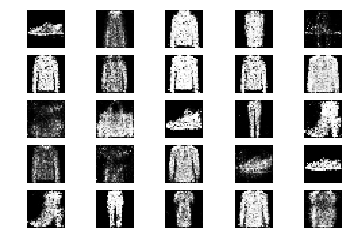

13401 [D loss: 0.684738, acc.: 57.81%] [G loss: 0.864702]
13402 [D loss: 0.650504, acc.: 59.38%] [G loss: 0.914381]
13403 [D loss: 0.594657, acc.: 73.44%] [G loss: 0.980886]
13404 [D loss: 0.683716, acc.: 50.00%] [G loss: 0.864911]
13405 [D loss: 0.584578, acc.: 71.88%] [G loss: 0.906541]
13406 [D loss: 0.638021, acc.: 64.06%] [G loss: 0.934635]
13407 [D loss: 0.712958, acc.: 56.25%] [G loss: 0.761023]
13408 [D loss: 0.601403, acc.: 65.62%] [G loss: 0.861083]
13409 [D loss: 0.668228, acc.: 62.50%] [G loss: 0.966509]
13410 [D loss: 0.671820, acc.: 56.25%] [G loss: 0.868147]
13411 [D loss: 0.669878, acc.: 59.38%] [G loss: 0.837628]
13412 [D loss: 0.671467, acc.: 62.50%] [G loss: 0.902645]
13413 [D loss: 0.685177, acc.: 56.25%] [G loss: 0.961063]
13414 [D loss: 0.620201, acc.: 70.31%] [G loss: 0.911643]
13415 [D loss: 0.614483, acc.: 68.75%] [G loss: 0.943302]
13416 [D loss: 0.630443, acc.: 60.94%] [G loss: 0.938163]
13417 [D loss: 0.622118, acc.: 64.06%] [G loss: 0.882643]
13418 [D loss:

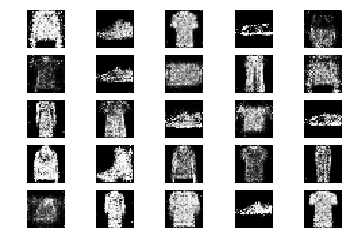

13601 [D loss: 0.688067, acc.: 56.25%] [G loss: 0.924378]
13602 [D loss: 0.682474, acc.: 57.81%] [G loss: 0.950083]
13603 [D loss: 0.592696, acc.: 65.62%] [G loss: 0.831507]
13604 [D loss: 0.591393, acc.: 73.44%] [G loss: 0.843462]
13605 [D loss: 0.675814, acc.: 64.06%] [G loss: 0.822419]
13606 [D loss: 0.662711, acc.: 62.50%] [G loss: 0.908084]
13607 [D loss: 0.668230, acc.: 59.38%] [G loss: 0.917654]
13608 [D loss: 0.668913, acc.: 56.25%] [G loss: 0.901246]
13609 [D loss: 0.708747, acc.: 50.00%] [G loss: 0.954042]
13610 [D loss: 0.647737, acc.: 59.38%] [G loss: 0.861240]
13611 [D loss: 0.688901, acc.: 62.50%] [G loss: 0.916785]
13612 [D loss: 0.691790, acc.: 54.69%] [G loss: 0.897869]
13613 [D loss: 0.677580, acc.: 59.38%] [G loss: 0.905876]
13614 [D loss: 0.625267, acc.: 65.62%] [G loss: 0.855310]
13615 [D loss: 0.604150, acc.: 70.31%] [G loss: 1.027415]
13616 [D loss: 0.688351, acc.: 51.56%] [G loss: 0.900716]
13617 [D loss: 0.642039, acc.: 68.75%] [G loss: 0.842071]
13618 [D loss:

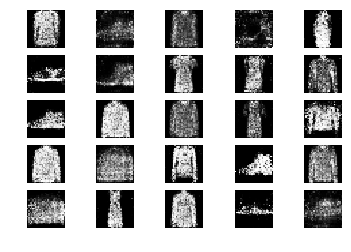

13801 [D loss: 0.667158, acc.: 59.38%] [G loss: 0.848570]
13802 [D loss: 0.606122, acc.: 64.06%] [G loss: 0.925408]
13803 [D loss: 0.614076, acc.: 59.38%] [G loss: 1.061658]
13804 [D loss: 0.567773, acc.: 75.00%] [G loss: 0.944137]
13805 [D loss: 0.616905, acc.: 70.31%] [G loss: 0.896514]
13806 [D loss: 0.700429, acc.: 56.25%] [G loss: 0.936520]
13807 [D loss: 0.648469, acc.: 60.94%] [G loss: 0.950977]
13808 [D loss: 0.665345, acc.: 56.25%] [G loss: 0.956313]
13809 [D loss: 0.682870, acc.: 51.56%] [G loss: 0.983921]
13810 [D loss: 0.589668, acc.: 71.88%] [G loss: 0.959315]
13811 [D loss: 0.681955, acc.: 67.19%] [G loss: 0.950085]
13812 [D loss: 0.712956, acc.: 56.25%] [G loss: 1.005551]
13813 [D loss: 0.650384, acc.: 62.50%] [G loss: 0.919857]
13814 [D loss: 0.700961, acc.: 53.12%] [G loss: 0.958935]
13815 [D loss: 0.580099, acc.: 68.75%] [G loss: 0.989189]
13816 [D loss: 0.681833, acc.: 56.25%] [G loss: 0.924677]
13817 [D loss: 0.621623, acc.: 65.62%] [G loss: 0.950969]
13818 [D loss:

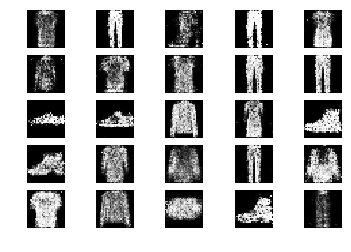

14001 [D loss: 0.676781, acc.: 59.38%] [G loss: 1.005133]
14002 [D loss: 0.648519, acc.: 67.19%] [G loss: 0.952407]
14003 [D loss: 0.677493, acc.: 62.50%] [G loss: 0.979742]
14004 [D loss: 0.652903, acc.: 60.94%] [G loss: 0.936844]
14005 [D loss: 0.634546, acc.: 68.75%] [G loss: 0.953172]
14006 [D loss: 0.599621, acc.: 65.62%] [G loss: 0.965860]
14007 [D loss: 0.687471, acc.: 46.88%] [G loss: 0.961773]
14008 [D loss: 0.686053, acc.: 64.06%] [G loss: 1.035083]
14009 [D loss: 0.779743, acc.: 48.44%] [G loss: 0.962576]
14010 [D loss: 0.617427, acc.: 65.62%] [G loss: 0.953157]
14011 [D loss: 0.581335, acc.: 68.75%] [G loss: 0.939243]
14012 [D loss: 0.632764, acc.: 60.94%] [G loss: 0.965012]
14013 [D loss: 0.589468, acc.: 70.31%] [G loss: 0.937827]
14014 [D loss: 0.762736, acc.: 50.00%] [G loss: 0.980124]
14015 [D loss: 0.679359, acc.: 54.69%] [G loss: 0.948626]
14016 [D loss: 0.565953, acc.: 76.56%] [G loss: 0.903139]
14017 [D loss: 0.647282, acc.: 67.19%] [G loss: 0.898581]
14018 [D loss:

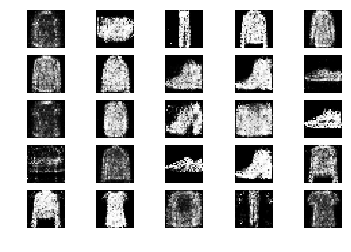

14201 [D loss: 0.625635, acc.: 65.62%] [G loss: 0.895960]
14202 [D loss: 0.698220, acc.: 53.12%] [G loss: 0.957280]
14203 [D loss: 0.630836, acc.: 57.81%] [G loss: 0.927407]
14204 [D loss: 0.608668, acc.: 70.31%] [G loss: 0.937808]
14205 [D loss: 0.674981, acc.: 60.94%] [G loss: 0.906720]
14206 [D loss: 0.626144, acc.: 60.94%] [G loss: 0.847967]
14207 [D loss: 0.614624, acc.: 67.19%] [G loss: 1.013909]
14208 [D loss: 0.627050, acc.: 59.38%] [G loss: 0.952701]
14209 [D loss: 0.729169, acc.: 53.12%] [G loss: 0.843075]
14210 [D loss: 0.671174, acc.: 56.25%] [G loss: 0.877421]
14211 [D loss: 0.643522, acc.: 54.69%] [G loss: 0.879163]
14212 [D loss: 0.647270, acc.: 64.06%] [G loss: 0.912913]
14213 [D loss: 0.662111, acc.: 60.94%] [G loss: 0.858413]
14214 [D loss: 0.660015, acc.: 59.38%] [G loss: 0.801481]
14215 [D loss: 0.622149, acc.: 67.19%] [G loss: 0.902615]
14216 [D loss: 0.669397, acc.: 54.69%] [G loss: 0.951510]
14217 [D loss: 0.726027, acc.: 46.88%] [G loss: 0.925432]
14218 [D loss:

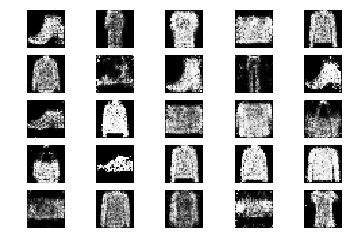

14401 [D loss: 0.648236, acc.: 54.69%] [G loss: 1.013826]
14402 [D loss: 0.679685, acc.: 54.69%] [G loss: 0.865240]
14403 [D loss: 0.638095, acc.: 64.06%] [G loss: 0.983904]
14404 [D loss: 0.576397, acc.: 73.44%] [G loss: 0.951699]
14405 [D loss: 0.673182, acc.: 59.38%] [G loss: 0.947645]
14406 [D loss: 0.713354, acc.: 50.00%] [G loss: 0.979440]
14407 [D loss: 0.593081, acc.: 71.88%] [G loss: 0.954078]
14408 [D loss: 0.606557, acc.: 65.62%] [G loss: 0.970766]
14409 [D loss: 0.681286, acc.: 59.38%] [G loss: 0.991534]
14410 [D loss: 0.585410, acc.: 76.56%] [G loss: 0.908148]
14411 [D loss: 0.613622, acc.: 64.06%] [G loss: 0.877797]
14412 [D loss: 0.652889, acc.: 67.19%] [G loss: 0.922375]
14413 [D loss: 0.654173, acc.: 57.81%] [G loss: 0.909069]
14414 [D loss: 0.635347, acc.: 60.94%] [G loss: 0.947268]
14415 [D loss: 0.647332, acc.: 65.62%] [G loss: 0.985867]
14416 [D loss: 0.587888, acc.: 67.19%] [G loss: 0.895149]
14417 [D loss: 0.702646, acc.: 53.12%] [G loss: 0.914120]
14418 [D loss:

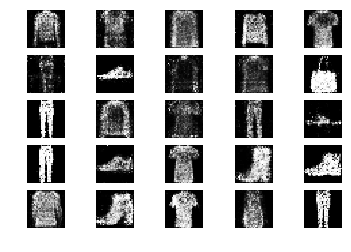

14601 [D loss: 0.632733, acc.: 65.62%] [G loss: 0.977387]
14602 [D loss: 0.583653, acc.: 70.31%] [G loss: 0.955838]
14603 [D loss: 0.697658, acc.: 54.69%] [G loss: 1.008946]
14604 [D loss: 0.664380, acc.: 62.50%] [G loss: 0.872265]
14605 [D loss: 0.576447, acc.: 75.00%] [G loss: 0.951677]
14606 [D loss: 0.612462, acc.: 67.19%] [G loss: 0.869419]
14607 [D loss: 0.621112, acc.: 64.06%] [G loss: 0.905854]
14608 [D loss: 0.618997, acc.: 67.19%] [G loss: 0.895989]
14609 [D loss: 0.646657, acc.: 64.06%] [G loss: 0.788296]
14610 [D loss: 0.589428, acc.: 65.62%] [G loss: 0.921118]
14611 [D loss: 0.718025, acc.: 51.56%] [G loss: 0.904925]
14612 [D loss: 0.639864, acc.: 60.94%] [G loss: 0.840576]
14613 [D loss: 0.682999, acc.: 59.38%] [G loss: 0.920492]
14614 [D loss: 0.680317, acc.: 54.69%] [G loss: 0.955914]
14615 [D loss: 0.640523, acc.: 57.81%] [G loss: 0.871015]
14616 [D loss: 0.663814, acc.: 65.62%] [G loss: 0.836811]
14617 [D loss: 0.650891, acc.: 67.19%] [G loss: 0.982503]
14618 [D loss:

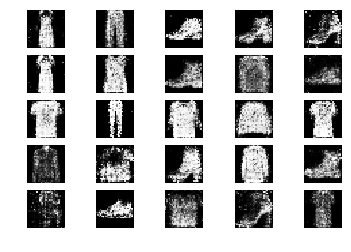

14801 [D loss: 0.619326, acc.: 62.50%] [G loss: 0.835903]
14802 [D loss: 0.687322, acc.: 59.38%] [G loss: 0.964911]
14803 [D loss: 0.705208, acc.: 53.12%] [G loss: 0.914934]
14804 [D loss: 0.626960, acc.: 67.19%] [G loss: 0.954624]
14805 [D loss: 0.627963, acc.: 67.19%] [G loss: 0.934006]
14806 [D loss: 0.625929, acc.: 57.81%] [G loss: 0.923573]
14807 [D loss: 0.727217, acc.: 62.50%] [G loss: 0.979491]
14808 [D loss: 0.658438, acc.: 62.50%] [G loss: 0.904601]
14809 [D loss: 0.637647, acc.: 65.62%] [G loss: 0.951040]
14810 [D loss: 0.589883, acc.: 70.31%] [G loss: 0.924867]
14811 [D loss: 0.748841, acc.: 53.12%] [G loss: 0.796441]
14812 [D loss: 0.570386, acc.: 78.12%] [G loss: 0.847187]
14813 [D loss: 0.590821, acc.: 67.19%] [G loss: 0.855662]
14814 [D loss: 0.625494, acc.: 62.50%] [G loss: 0.884676]
14815 [D loss: 0.696694, acc.: 56.25%] [G loss: 0.846563]
14816 [D loss: 0.615087, acc.: 68.75%] [G loss: 0.805440]
14817 [D loss: 0.626902, acc.: 60.94%] [G loss: 0.936962]
14818 [D loss:

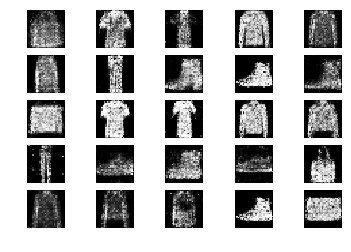

15001 [D loss: 0.687015, acc.: 60.94%] [G loss: 0.890659]
15002 [D loss: 0.707045, acc.: 48.44%] [G loss: 0.840133]
15003 [D loss: 0.618846, acc.: 64.06%] [G loss: 0.897500]
15004 [D loss: 0.679587, acc.: 59.38%] [G loss: 0.952923]
15005 [D loss: 0.622096, acc.: 65.62%] [G loss: 0.938940]
15006 [D loss: 0.621439, acc.: 62.50%] [G loss: 1.044548]
15007 [D loss: 0.650805, acc.: 65.62%] [G loss: 1.009153]
15008 [D loss: 0.650815, acc.: 62.50%] [G loss: 1.051405]
15009 [D loss: 0.645047, acc.: 57.81%] [G loss: 0.919195]
15010 [D loss: 0.650237, acc.: 62.50%] [G loss: 0.993517]
15011 [D loss: 0.691518, acc.: 48.44%] [G loss: 1.004866]
15012 [D loss: 0.724850, acc.: 53.12%] [G loss: 0.873727]
15013 [D loss: 0.630212, acc.: 57.81%] [G loss: 0.874480]
15014 [D loss: 0.585453, acc.: 68.75%] [G loss: 0.888061]
15015 [D loss: 0.681083, acc.: 60.94%] [G loss: 0.929368]
15016 [D loss: 0.623711, acc.: 64.06%] [G loss: 0.840744]
15017 [D loss: 0.596622, acc.: 68.75%] [G loss: 0.831195]
15018 [D loss:

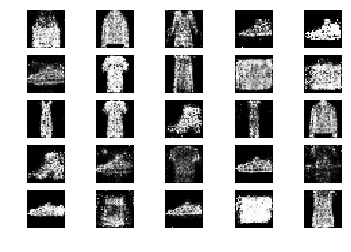

15201 [D loss: 0.601168, acc.: 62.50%] [G loss: 0.926393]
15202 [D loss: 0.623555, acc.: 64.06%] [G loss: 0.833620]
15203 [D loss: 0.659231, acc.: 67.19%] [G loss: 1.028368]
15204 [D loss: 0.569916, acc.: 73.44%] [G loss: 0.908404]
15205 [D loss: 0.673907, acc.: 56.25%] [G loss: 0.908086]
15206 [D loss: 0.702592, acc.: 59.38%] [G loss: 0.852657]
15207 [D loss: 0.689167, acc.: 48.44%] [G loss: 0.854372]
15208 [D loss: 0.667510, acc.: 65.62%] [G loss: 1.015659]
15209 [D loss: 0.609566, acc.: 70.31%] [G loss: 0.902543]
15210 [D loss: 0.672762, acc.: 50.00%] [G loss: 0.954304]
15211 [D loss: 0.639060, acc.: 60.94%] [G loss: 0.988629]
15212 [D loss: 0.656222, acc.: 59.38%] [G loss: 0.920679]
15213 [D loss: 0.660362, acc.: 54.69%] [G loss: 0.976112]
15214 [D loss: 0.552269, acc.: 73.44%] [G loss: 0.982983]
15215 [D loss: 0.655865, acc.: 60.94%] [G loss: 0.894532]
15216 [D loss: 0.666080, acc.: 62.50%] [G loss: 0.950338]
15217 [D loss: 0.644654, acc.: 67.19%] [G loss: 0.879123]
15218 [D loss:

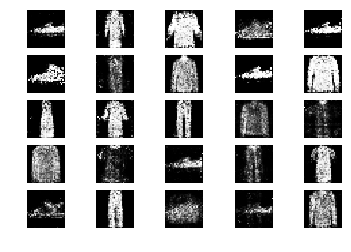

15401 [D loss: 0.635177, acc.: 64.06%] [G loss: 0.821506]
15402 [D loss: 0.620140, acc.: 67.19%] [G loss: 0.868597]
15403 [D loss: 0.583997, acc.: 73.44%] [G loss: 0.941098]
15404 [D loss: 0.655792, acc.: 64.06%] [G loss: 0.958859]
15405 [D loss: 0.718066, acc.: 53.12%] [G loss: 0.934634]
15406 [D loss: 0.680710, acc.: 59.38%] [G loss: 0.891055]
15407 [D loss: 0.625373, acc.: 59.38%] [G loss: 0.911907]
15408 [D loss: 0.678591, acc.: 51.56%] [G loss: 1.068083]
15409 [D loss: 0.631235, acc.: 60.94%] [G loss: 0.954136]
15410 [D loss: 0.631617, acc.: 64.06%] [G loss: 1.026532]
15411 [D loss: 0.633025, acc.: 62.50%] [G loss: 1.010739]
15412 [D loss: 0.631180, acc.: 64.06%] [G loss: 0.993352]
15413 [D loss: 0.617655, acc.: 62.50%] [G loss: 0.957530]
15414 [D loss: 0.677694, acc.: 59.38%] [G loss: 0.967010]
15415 [D loss: 0.694165, acc.: 53.12%] [G loss: 0.934918]
15416 [D loss: 0.693166, acc.: 56.25%] [G loss: 0.990196]
15417 [D loss: 0.683469, acc.: 54.69%] [G loss: 0.943421]
15418 [D loss:

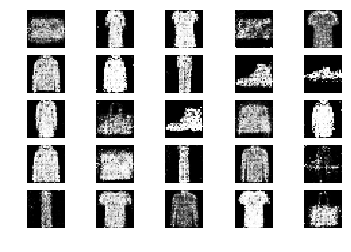

15601 [D loss: 0.640779, acc.: 65.62%] [G loss: 0.872194]
15602 [D loss: 0.695610, acc.: 51.56%] [G loss: 0.966115]
15603 [D loss: 0.616553, acc.: 59.38%] [G loss: 0.968377]
15604 [D loss: 0.646918, acc.: 62.50%] [G loss: 1.006382]
15605 [D loss: 0.659331, acc.: 57.81%] [G loss: 0.930557]
15606 [D loss: 0.609393, acc.: 67.19%] [G loss: 0.934765]
15607 [D loss: 0.615748, acc.: 68.75%] [G loss: 0.882811]
15608 [D loss: 0.674724, acc.: 59.38%] [G loss: 0.892029]
15609 [D loss: 0.686527, acc.: 59.38%] [G loss: 0.901797]
15610 [D loss: 0.647670, acc.: 62.50%] [G loss: 0.967304]
15611 [D loss: 0.594875, acc.: 76.56%] [G loss: 0.910100]
15612 [D loss: 0.625519, acc.: 75.00%] [G loss: 0.914012]
15613 [D loss: 0.646137, acc.: 65.62%] [G loss: 0.896471]
15614 [D loss: 0.594499, acc.: 73.44%] [G loss: 0.888439]
15615 [D loss: 0.631433, acc.: 64.06%] [G loss: 0.951672]
15616 [D loss: 0.614478, acc.: 71.88%] [G loss: 0.903215]
15617 [D loss: 0.656903, acc.: 56.25%] [G loss: 0.936295]
15618 [D loss:

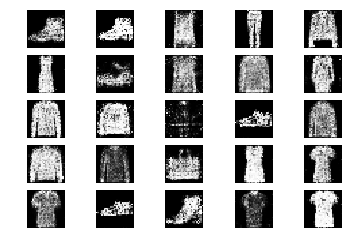

15801 [D loss: 0.625945, acc.: 65.62%] [G loss: 0.961540]
15802 [D loss: 0.669300, acc.: 62.50%] [G loss: 0.975494]
15803 [D loss: 0.671524, acc.: 64.06%] [G loss: 0.906086]
15804 [D loss: 0.630902, acc.: 71.88%] [G loss: 0.922051]
15805 [D loss: 0.612088, acc.: 67.19%] [G loss: 0.938557]
15806 [D loss: 0.689879, acc.: 59.38%] [G loss: 0.920743]
15807 [D loss: 0.626730, acc.: 68.75%] [G loss: 0.883628]
15808 [D loss: 0.598375, acc.: 71.88%] [G loss: 0.880976]
15809 [D loss: 0.676113, acc.: 57.81%] [G loss: 0.955639]
15810 [D loss: 0.632011, acc.: 62.50%] [G loss: 0.840747]
15811 [D loss: 0.717815, acc.: 51.56%] [G loss: 0.930560]
15812 [D loss: 0.594419, acc.: 67.19%] [G loss: 0.971118]
15813 [D loss: 0.644797, acc.: 65.62%] [G loss: 0.986251]
15814 [D loss: 0.623833, acc.: 64.06%] [G loss: 0.943848]
15815 [D loss: 0.620847, acc.: 65.62%] [G loss: 0.935716]
15816 [D loss: 0.682431, acc.: 57.81%] [G loss: 0.899451]
15817 [D loss: 0.694095, acc.: 56.25%] [G loss: 0.928221]
15818 [D loss:

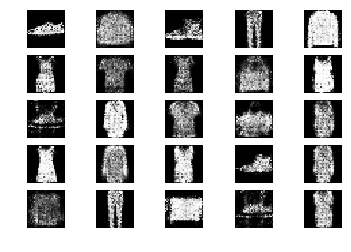

16001 [D loss: 0.626803, acc.: 64.06%] [G loss: 0.849299]
16002 [D loss: 0.716833, acc.: 54.69%] [G loss: 0.912822]
16003 [D loss: 0.666045, acc.: 59.38%] [G loss: 0.858606]
16004 [D loss: 0.616791, acc.: 59.38%] [G loss: 0.933125]
16005 [D loss: 0.673978, acc.: 67.19%] [G loss: 0.913078]
16006 [D loss: 0.737359, acc.: 54.69%] [G loss: 0.889587]
16007 [D loss: 0.685537, acc.: 64.06%] [G loss: 0.989475]
16008 [D loss: 0.633135, acc.: 67.19%] [G loss: 0.963333]
16009 [D loss: 0.569757, acc.: 78.12%] [G loss: 0.991908]
16010 [D loss: 0.628399, acc.: 67.19%] [G loss: 0.922311]
16011 [D loss: 0.740576, acc.: 48.44%] [G loss: 0.957023]
16012 [D loss: 0.641753, acc.: 62.50%] [G loss: 0.938097]
16013 [D loss: 0.630608, acc.: 60.94%] [G loss: 0.893816]
16014 [D loss: 0.662353, acc.: 62.50%] [G loss: 1.032962]
16015 [D loss: 0.692602, acc.: 53.12%] [G loss: 1.064209]
16016 [D loss: 0.678729, acc.: 50.00%] [G loss: 0.966889]
16017 [D loss: 0.625286, acc.: 65.62%] [G loss: 0.967970]
16018 [D loss:

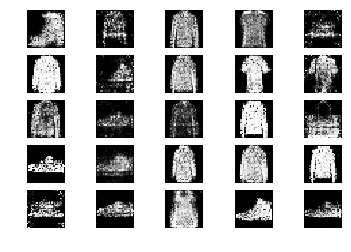

16201 [D loss: 0.694882, acc.: 46.88%] [G loss: 0.930158]
16202 [D loss: 0.658905, acc.: 60.94%] [G loss: 0.921354]
16203 [D loss: 0.647881, acc.: 56.25%] [G loss: 0.838736]
16204 [D loss: 0.668347, acc.: 59.38%] [G loss: 0.891346]
16205 [D loss: 0.684598, acc.: 57.81%] [G loss: 0.888828]
16206 [D loss: 0.708223, acc.: 51.56%] [G loss: 0.959248]
16207 [D loss: 0.654599, acc.: 60.94%] [G loss: 0.930429]
16208 [D loss: 0.621413, acc.: 67.19%] [G loss: 0.944385]
16209 [D loss: 0.619356, acc.: 62.50%] [G loss: 0.917132]
16210 [D loss: 0.677531, acc.: 54.69%] [G loss: 0.884149]
16211 [D loss: 0.618169, acc.: 62.50%] [G loss: 0.841841]
16212 [D loss: 0.654698, acc.: 60.94%] [G loss: 0.862824]
16213 [D loss: 0.581809, acc.: 75.00%] [G loss: 0.877514]
16214 [D loss: 0.643380, acc.: 60.94%] [G loss: 0.911328]
16215 [D loss: 0.622816, acc.: 67.19%] [G loss: 0.970107]
16216 [D loss: 0.597449, acc.: 65.62%] [G loss: 1.016902]
16217 [D loss: 0.697021, acc.: 56.25%] [G loss: 1.019969]
16218 [D loss:

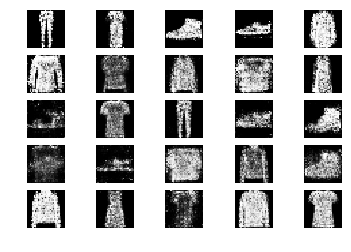

16401 [D loss: 0.639976, acc.: 57.81%] [G loss: 0.813487]
16402 [D loss: 0.672894, acc.: 57.81%] [G loss: 0.907829]
16403 [D loss: 0.675066, acc.: 62.50%] [G loss: 0.962496]
16404 [D loss: 0.695252, acc.: 60.94%] [G loss: 0.928521]
16405 [D loss: 0.607009, acc.: 64.06%] [G loss: 0.940858]
16406 [D loss: 0.635045, acc.: 65.62%] [G loss: 0.944449]
16407 [D loss: 0.648140, acc.: 60.94%] [G loss: 0.895439]
16408 [D loss: 0.656426, acc.: 67.19%] [G loss: 0.856575]
16409 [D loss: 0.642116, acc.: 62.50%] [G loss: 0.911644]
16410 [D loss: 0.736709, acc.: 46.88%] [G loss: 0.902701]
16411 [D loss: 0.640846, acc.: 65.62%] [G loss: 0.843847]
16412 [D loss: 0.696485, acc.: 57.81%] [G loss: 0.908326]
16413 [D loss: 0.611934, acc.: 67.19%] [G loss: 0.893402]
16414 [D loss: 0.664468, acc.: 62.50%] [G loss: 0.943772]
16415 [D loss: 0.630952, acc.: 59.38%] [G loss: 0.884428]
16416 [D loss: 0.653243, acc.: 64.06%] [G loss: 0.906749]
16417 [D loss: 0.673388, acc.: 57.81%] [G loss: 0.938739]
16418 [D loss:

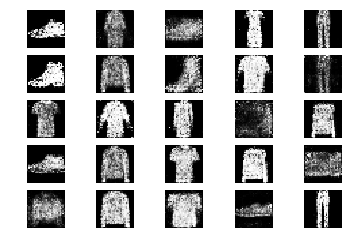

16601 [D loss: 0.641447, acc.: 59.38%] [G loss: 0.961911]
16602 [D loss: 0.659954, acc.: 62.50%] [G loss: 0.925376]
16603 [D loss: 0.701405, acc.: 50.00%] [G loss: 0.868608]
16604 [D loss: 0.665193, acc.: 60.94%] [G loss: 1.008056]
16605 [D loss: 0.646058, acc.: 51.56%] [G loss: 1.010604]
16606 [D loss: 0.552831, acc.: 75.00%] [G loss: 0.887968]
16607 [D loss: 0.675665, acc.: 56.25%] [G loss: 0.837885]
16608 [D loss: 0.614605, acc.: 68.75%] [G loss: 0.891286]
16609 [D loss: 0.658121, acc.: 54.69%] [G loss: 0.857914]
16610 [D loss: 0.684058, acc.: 54.69%] [G loss: 0.885988]
16611 [D loss: 0.714852, acc.: 46.88%] [G loss: 0.860372]
16612 [D loss: 0.675726, acc.: 56.25%] [G loss: 0.842662]
16613 [D loss: 0.625697, acc.: 67.19%] [G loss: 0.906381]
16614 [D loss: 0.609874, acc.: 65.62%] [G loss: 0.825397]
16615 [D loss: 0.637348, acc.: 70.31%] [G loss: 0.908179]
16616 [D loss: 0.668073, acc.: 56.25%] [G loss: 0.919765]
16617 [D loss: 0.596428, acc.: 70.31%] [G loss: 0.937385]
16618 [D loss:

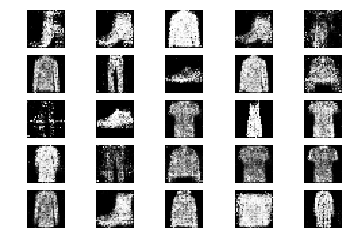

16801 [D loss: 0.721517, acc.: 60.94%] [G loss: 0.806361]
16802 [D loss: 0.651735, acc.: 59.38%] [G loss: 0.867934]
16803 [D loss: 0.623652, acc.: 67.19%] [G loss: 0.943859]
16804 [D loss: 0.685871, acc.: 60.94%] [G loss: 0.951297]
16805 [D loss: 0.633731, acc.: 67.19%] [G loss: 0.826122]
16806 [D loss: 0.720568, acc.: 54.69%] [G loss: 0.914413]
16807 [D loss: 0.663756, acc.: 65.62%] [G loss: 0.898569]
16808 [D loss: 0.599888, acc.: 68.75%] [G loss: 0.979947]
16809 [D loss: 0.733113, acc.: 56.25%] [G loss: 0.881005]
16810 [D loss: 0.633269, acc.: 62.50%] [G loss: 0.931234]
16811 [D loss: 0.602809, acc.: 70.31%] [G loss: 0.923977]
16812 [D loss: 0.637490, acc.: 56.25%] [G loss: 0.918667]
16813 [D loss: 0.690914, acc.: 54.69%] [G loss: 0.878223]
16814 [D loss: 0.589023, acc.: 68.75%] [G loss: 0.921203]
16815 [D loss: 0.621618, acc.: 64.06%] [G loss: 0.987285]
16816 [D loss: 0.692697, acc.: 59.38%] [G loss: 0.979604]
16817 [D loss: 0.628086, acc.: 64.06%] [G loss: 0.970918]
16818 [D loss:

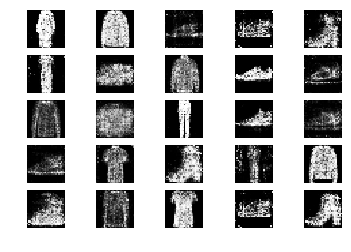

17001 [D loss: 0.636887, acc.: 65.62%] [G loss: 1.007823]
17002 [D loss: 0.653179, acc.: 64.06%] [G loss: 0.875645]
17003 [D loss: 0.676355, acc.: 53.12%] [G loss: 0.876740]
17004 [D loss: 0.617862, acc.: 70.31%] [G loss: 0.907192]
17005 [D loss: 0.606413, acc.: 65.62%] [G loss: 0.971060]
17006 [D loss: 0.634453, acc.: 67.19%] [G loss: 0.977552]
17007 [D loss: 0.600175, acc.: 73.44%] [G loss: 0.925730]
17008 [D loss: 0.651772, acc.: 62.50%] [G loss: 0.874507]
17009 [D loss: 0.639393, acc.: 62.50%] [G loss: 0.888237]
17010 [D loss: 0.640835, acc.: 64.06%] [G loss: 1.007740]
17011 [D loss: 0.640944, acc.: 62.50%] [G loss: 0.895074]
17012 [D loss: 0.633440, acc.: 68.75%] [G loss: 0.941048]
17013 [D loss: 0.635718, acc.: 70.31%] [G loss: 0.896605]
17014 [D loss: 0.694302, acc.: 51.56%] [G loss: 0.879806]
17015 [D loss: 0.570625, acc.: 71.88%] [G loss: 0.988957]
17016 [D loss: 0.647786, acc.: 62.50%] [G loss: 0.993801]
17017 [D loss: 0.694843, acc.: 54.69%] [G loss: 0.939382]
17018 [D loss:

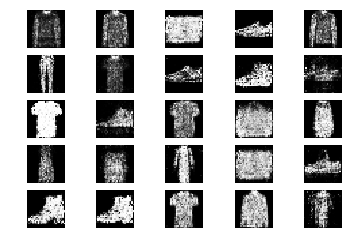

17201 [D loss: 0.630135, acc.: 67.19%] [G loss: 0.971396]
17202 [D loss: 0.646549, acc.: 60.94%] [G loss: 0.933448]
17203 [D loss: 0.677759, acc.: 54.69%] [G loss: 0.922269]
17204 [D loss: 0.607898, acc.: 62.50%] [G loss: 0.970875]
17205 [D loss: 0.663178, acc.: 59.38%] [G loss: 0.889952]
17206 [D loss: 0.633322, acc.: 59.38%] [G loss: 0.933166]
17207 [D loss: 0.631830, acc.: 60.94%] [G loss: 0.918577]
17208 [D loss: 0.669909, acc.: 57.81%] [G loss: 0.945612]
17209 [D loss: 0.651556, acc.: 57.81%] [G loss: 1.007267]
17210 [D loss: 0.626580, acc.: 59.38%] [G loss: 0.901557]
17211 [D loss: 0.652994, acc.: 59.38%] [G loss: 0.877119]
17212 [D loss: 0.637031, acc.: 56.25%] [G loss: 0.868183]
17213 [D loss: 0.622917, acc.: 64.06%] [G loss: 0.904930]
17214 [D loss: 0.539239, acc.: 73.44%] [G loss: 0.873893]
17215 [D loss: 0.645944, acc.: 57.81%] [G loss: 0.873603]
17216 [D loss: 0.613679, acc.: 64.06%] [G loss: 0.918462]
17217 [D loss: 0.675859, acc.: 53.12%] [G loss: 0.797392]
17218 [D loss:

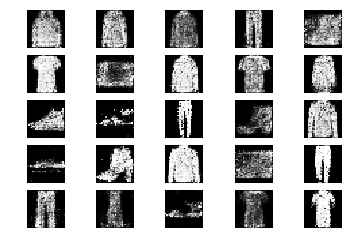

17401 [D loss: 0.641438, acc.: 60.94%] [G loss: 0.910806]
17402 [D loss: 0.604152, acc.: 65.62%] [G loss: 0.981597]
17403 [D loss: 0.671699, acc.: 62.50%] [G loss: 0.988941]
17404 [D loss: 0.657128, acc.: 56.25%] [G loss: 0.951985]
17405 [D loss: 0.680508, acc.: 57.81%] [G loss: 0.960093]
17406 [D loss: 0.634459, acc.: 56.25%] [G loss: 0.843086]
17407 [D loss: 0.593360, acc.: 75.00%] [G loss: 0.896384]
17408 [D loss: 0.667867, acc.: 53.12%] [G loss: 0.886907]
17409 [D loss: 0.619596, acc.: 65.62%] [G loss: 0.881065]
17410 [D loss: 0.599665, acc.: 62.50%] [G loss: 1.022171]
17411 [D loss: 0.670124, acc.: 51.56%] [G loss: 0.923728]
17412 [D loss: 0.720334, acc.: 54.69%] [G loss: 0.928712]
17413 [D loss: 0.719090, acc.: 57.81%] [G loss: 0.929987]
17414 [D loss: 0.645062, acc.: 60.94%] [G loss: 0.923204]
17415 [D loss: 0.641681, acc.: 59.38%] [G loss: 0.972624]
17416 [D loss: 0.613829, acc.: 67.19%] [G loss: 0.891615]
17417 [D loss: 0.636416, acc.: 68.75%] [G loss: 0.999291]
17418 [D loss:

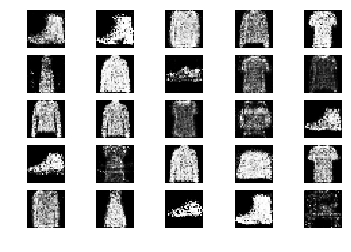

17601 [D loss: 0.666019, acc.: 60.94%] [G loss: 0.906772]
17602 [D loss: 0.645225, acc.: 59.38%] [G loss: 1.076314]
17603 [D loss: 0.669211, acc.: 62.50%] [G loss: 0.969257]
17604 [D loss: 0.637053, acc.: 65.62%] [G loss: 0.912083]
17605 [D loss: 0.649238, acc.: 56.25%] [G loss: 0.925565]
17606 [D loss: 0.635815, acc.: 68.75%] [G loss: 0.886470]
17607 [D loss: 0.684515, acc.: 57.81%] [G loss: 0.902014]
17608 [D loss: 0.653076, acc.: 70.31%] [G loss: 0.940881]
17609 [D loss: 0.675075, acc.: 59.38%] [G loss: 0.916595]
17610 [D loss: 0.653055, acc.: 54.69%] [G loss: 0.929568]
17611 [D loss: 0.624170, acc.: 62.50%] [G loss: 0.959500]
17612 [D loss: 0.695192, acc.: 54.69%] [G loss: 0.901620]
17613 [D loss: 0.614592, acc.: 65.62%] [G loss: 0.925517]
17614 [D loss: 0.576043, acc.: 73.44%] [G loss: 0.882381]
17615 [D loss: 0.656400, acc.: 60.94%] [G loss: 0.904833]
17616 [D loss: 0.649839, acc.: 64.06%] [G loss: 0.959587]
17617 [D loss: 0.612600, acc.: 68.75%] [G loss: 1.026648]
17618 [D loss:

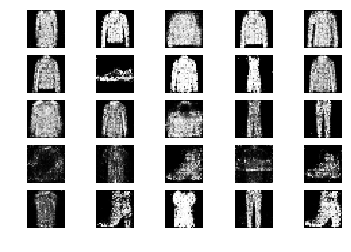

17801 [D loss: 0.653620, acc.: 57.81%] [G loss: 0.939495]
17802 [D loss: 0.684535, acc.: 60.94%] [G loss: 0.878067]
17803 [D loss: 0.614821, acc.: 67.19%] [G loss: 0.906735]
17804 [D loss: 0.653906, acc.: 60.94%] [G loss: 0.934626]
17805 [D loss: 0.593476, acc.: 70.31%] [G loss: 0.937958]
17806 [D loss: 0.715998, acc.: 54.69%] [G loss: 0.881658]
17807 [D loss: 0.585607, acc.: 73.44%] [G loss: 0.893911]
17808 [D loss: 0.606762, acc.: 75.00%] [G loss: 0.917680]
17809 [D loss: 0.675835, acc.: 62.50%] [G loss: 0.903830]
17810 [D loss: 0.557988, acc.: 76.56%] [G loss: 0.876853]
17811 [D loss: 0.640355, acc.: 60.94%] [G loss: 0.833200]
17812 [D loss: 0.695940, acc.: 64.06%] [G loss: 0.770604]
17813 [D loss: 0.697343, acc.: 64.06%] [G loss: 0.858489]
17814 [D loss: 0.686353, acc.: 62.50%] [G loss: 0.955597]
17815 [D loss: 0.550507, acc.: 81.25%] [G loss: 0.998931]
17816 [D loss: 0.617944, acc.: 73.44%] [G loss: 0.988602]
17817 [D loss: 0.691113, acc.: 51.56%] [G loss: 1.014840]
17818 [D loss:

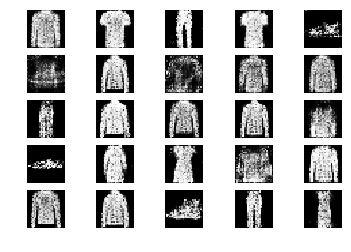

18001 [D loss: 0.695803, acc.: 56.25%] [G loss: 0.916425]
18002 [D loss: 0.630319, acc.: 67.19%] [G loss: 0.966467]
18003 [D loss: 0.672036, acc.: 65.62%] [G loss: 0.956072]
18004 [D loss: 0.549398, acc.: 78.12%] [G loss: 0.889884]
18005 [D loss: 0.600804, acc.: 67.19%] [G loss: 0.838945]
18006 [D loss: 0.615530, acc.: 67.19%] [G loss: 0.905153]
18007 [D loss: 0.647601, acc.: 68.75%] [G loss: 0.912991]
18008 [D loss: 0.681762, acc.: 60.94%] [G loss: 0.946181]
18009 [D loss: 0.632315, acc.: 65.62%] [G loss: 0.957540]
18010 [D loss: 0.700933, acc.: 51.56%] [G loss: 1.043546]
18011 [D loss: 0.628924, acc.: 68.75%] [G loss: 0.911921]
18012 [D loss: 0.675055, acc.: 57.81%] [G loss: 0.952961]
18013 [D loss: 0.616607, acc.: 64.06%] [G loss: 1.096606]
18014 [D loss: 0.693995, acc.: 51.56%] [G loss: 0.961927]
18015 [D loss: 0.653260, acc.: 59.38%] [G loss: 0.869705]
18016 [D loss: 0.675437, acc.: 56.25%] [G loss: 0.868663]
18017 [D loss: 0.650104, acc.: 64.06%] [G loss: 0.845777]
18018 [D loss:

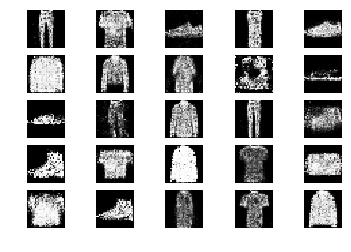

18201 [D loss: 0.599256, acc.: 67.19%] [G loss: 0.848862]
18202 [D loss: 0.584888, acc.: 73.44%] [G loss: 0.926798]
18203 [D loss: 0.640862, acc.: 64.06%] [G loss: 0.889909]
18204 [D loss: 0.632666, acc.: 62.50%] [G loss: 0.872901]
18205 [D loss: 0.659994, acc.: 59.38%] [G loss: 0.846487]
18206 [D loss: 0.635396, acc.: 65.62%] [G loss: 0.896158]
18207 [D loss: 0.678038, acc.: 59.38%] [G loss: 0.916446]
18208 [D loss: 0.669889, acc.: 60.94%] [G loss: 0.962219]
18209 [D loss: 0.638373, acc.: 59.38%] [G loss: 0.884595]
18210 [D loss: 0.653992, acc.: 64.06%] [G loss: 0.902425]
18211 [D loss: 0.641399, acc.: 65.62%] [G loss: 0.927046]
18212 [D loss: 0.648649, acc.: 60.94%] [G loss: 0.913943]
18213 [D loss: 0.596137, acc.: 71.88%] [G loss: 1.053332]
18214 [D loss: 0.663204, acc.: 54.69%] [G loss: 0.950422]
18215 [D loss: 0.624757, acc.: 70.31%] [G loss: 0.934306]
18216 [D loss: 0.664824, acc.: 59.38%] [G loss: 0.872251]
18217 [D loss: 0.661530, acc.: 62.50%] [G loss: 0.891949]
18218 [D loss:

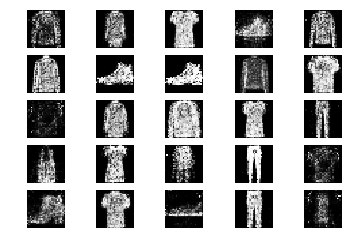

18401 [D loss: 0.745934, acc.: 50.00%] [G loss: 1.083310]
18402 [D loss: 0.679838, acc.: 57.81%] [G loss: 1.049466]
18403 [D loss: 0.672069, acc.: 60.94%] [G loss: 0.942702]
18404 [D loss: 0.679178, acc.: 53.12%] [G loss: 0.821758]
18405 [D loss: 0.645397, acc.: 62.50%] [G loss: 0.867674]
18406 [D loss: 0.622033, acc.: 60.94%] [G loss: 0.876465]
18407 [D loss: 0.686572, acc.: 60.94%] [G loss: 0.901284]
18408 [D loss: 0.665522, acc.: 54.69%] [G loss: 1.020496]
18409 [D loss: 0.677586, acc.: 56.25%] [G loss: 0.878736]
18410 [D loss: 0.685629, acc.: 50.00%] [G loss: 0.869918]
18411 [D loss: 0.644324, acc.: 62.50%] [G loss: 0.792147]
18412 [D loss: 0.702047, acc.: 53.12%] [G loss: 0.937587]
18413 [D loss: 0.668339, acc.: 57.81%] [G loss: 0.926224]
18414 [D loss: 0.636580, acc.: 60.94%] [G loss: 0.847644]
18415 [D loss: 0.631400, acc.: 64.06%] [G loss: 0.922826]
18416 [D loss: 0.665845, acc.: 59.38%] [G loss: 0.893727]
18417 [D loss: 0.729422, acc.: 48.44%] [G loss: 0.906830]
18418 [D loss:

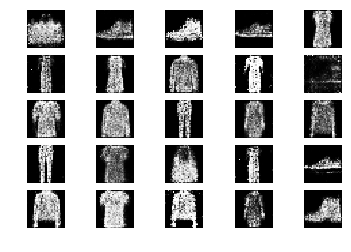

18601 [D loss: 0.770728, acc.: 42.19%] [G loss: 0.831181]
18602 [D loss: 0.684635, acc.: 56.25%] [G loss: 0.882730]
18603 [D loss: 0.622885, acc.: 64.06%] [G loss: 0.974070]
18604 [D loss: 0.671648, acc.: 56.25%] [G loss: 0.897062]
18605 [D loss: 0.616073, acc.: 70.31%] [G loss: 0.955473]
18606 [D loss: 0.702073, acc.: 54.69%] [G loss: 0.979340]
18607 [D loss: 0.725203, acc.: 42.19%] [G loss: 1.030564]
18608 [D loss: 0.689011, acc.: 60.94%] [G loss: 0.983539]
18609 [D loss: 0.573020, acc.: 76.56%] [G loss: 1.016253]
18610 [D loss: 0.661152, acc.: 62.50%] [G loss: 1.089253]
18611 [D loss: 0.631787, acc.: 73.44%] [G loss: 1.011854]
18612 [D loss: 0.698504, acc.: 62.50%] [G loss: 1.023263]
18613 [D loss: 0.614128, acc.: 67.19%] [G loss: 0.940644]
18614 [D loss: 0.583965, acc.: 62.50%] [G loss: 0.952140]
18615 [D loss: 0.573211, acc.: 73.44%] [G loss: 0.875621]
18616 [D loss: 0.594306, acc.: 67.19%] [G loss: 0.856860]
18617 [D loss: 0.718636, acc.: 56.25%] [G loss: 0.874008]
18618 [D loss:

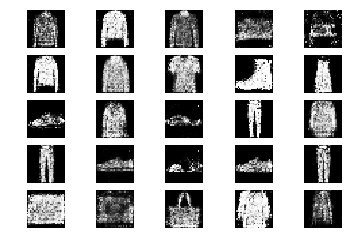

18801 [D loss: 0.651453, acc.: 65.62%] [G loss: 1.010636]
18802 [D loss: 0.651877, acc.: 67.19%] [G loss: 0.920775]
18803 [D loss: 0.613814, acc.: 59.38%] [G loss: 0.965430]
18804 [D loss: 0.639191, acc.: 64.06%] [G loss: 1.030986]
18805 [D loss: 0.666471, acc.: 54.69%] [G loss: 0.998394]
18806 [D loss: 0.597038, acc.: 67.19%] [G loss: 1.073451]
18807 [D loss: 0.603696, acc.: 68.75%] [G loss: 1.010446]
18808 [D loss: 0.662325, acc.: 59.38%] [G loss: 0.980811]
18809 [D loss: 0.699094, acc.: 51.56%] [G loss: 0.935047]
18810 [D loss: 0.584253, acc.: 76.56%] [G loss: 0.989421]
18811 [D loss: 0.619071, acc.: 67.19%] [G loss: 0.930573]
18812 [D loss: 0.615851, acc.: 70.31%] [G loss: 0.937863]
18813 [D loss: 0.660282, acc.: 57.81%] [G loss: 0.919181]
18814 [D loss: 0.630829, acc.: 64.06%] [G loss: 0.944801]
18815 [D loss: 0.600462, acc.: 70.31%] [G loss: 0.949356]
18816 [D loss: 0.565556, acc.: 73.44%] [G loss: 0.916116]
18817 [D loss: 0.673118, acc.: 54.69%] [G loss: 0.989806]
18818 [D loss:

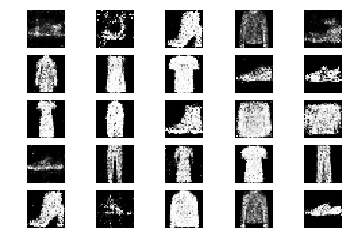

19001 [D loss: 0.573655, acc.: 73.44%] [G loss: 1.031504]
19002 [D loss: 0.697200, acc.: 56.25%] [G loss: 0.925582]
19003 [D loss: 0.619529, acc.: 65.62%] [G loss: 0.913316]
19004 [D loss: 0.659257, acc.: 59.38%] [G loss: 0.861016]
19005 [D loss: 0.634252, acc.: 57.81%] [G loss: 0.915431]
19006 [D loss: 0.564937, acc.: 73.44%] [G loss: 0.855528]
19007 [D loss: 0.619223, acc.: 71.88%] [G loss: 0.936241]
19008 [D loss: 0.668000, acc.: 59.38%] [G loss: 0.970176]
19009 [D loss: 0.632873, acc.: 62.50%] [G loss: 0.899861]
19010 [D loss: 0.718130, acc.: 53.12%] [G loss: 0.909645]
19011 [D loss: 0.677616, acc.: 62.50%] [G loss: 0.915058]
19012 [D loss: 0.592831, acc.: 70.31%] [G loss: 0.894438]
19013 [D loss: 0.615422, acc.: 67.19%] [G loss: 0.910742]
19014 [D loss: 0.592758, acc.: 68.75%] [G loss: 0.938699]
19015 [D loss: 0.689630, acc.: 59.38%] [G loss: 0.829244]
19016 [D loss: 0.644492, acc.: 62.50%] [G loss: 1.002019]
19017 [D loss: 0.595654, acc.: 68.75%] [G loss: 0.990065]
19018 [D loss:

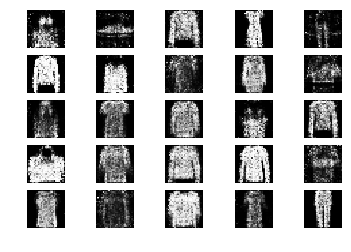

19201 [D loss: 0.705557, acc.: 57.81%] [G loss: 0.963285]
19202 [D loss: 0.653155, acc.: 59.38%] [G loss: 0.929041]
19203 [D loss: 0.622903, acc.: 67.19%] [G loss: 1.033726]
19204 [D loss: 0.595687, acc.: 71.88%] [G loss: 0.935161]
19205 [D loss: 0.622633, acc.: 70.31%] [G loss: 0.926702]
19206 [D loss: 0.657909, acc.: 60.94%] [G loss: 0.931929]
19207 [D loss: 0.636082, acc.: 65.62%] [G loss: 0.960440]
19208 [D loss: 0.615074, acc.: 68.75%] [G loss: 0.908966]
19209 [D loss: 0.713395, acc.: 54.69%] [G loss: 0.869733]
19210 [D loss: 0.641809, acc.: 60.94%] [G loss: 0.929321]
19211 [D loss: 0.580275, acc.: 68.75%] [G loss: 0.907237]
19212 [D loss: 0.595896, acc.: 71.88%] [G loss: 0.916319]
19213 [D loss: 0.675881, acc.: 54.69%] [G loss: 0.938999]
19214 [D loss: 0.671826, acc.: 60.94%] [G loss: 0.993173]
19215 [D loss: 0.625420, acc.: 68.75%] [G loss: 0.837170]
19216 [D loss: 0.684366, acc.: 57.81%] [G loss: 0.938591]
19217 [D loss: 0.628190, acc.: 67.19%] [G loss: 0.953965]
19218 [D loss:

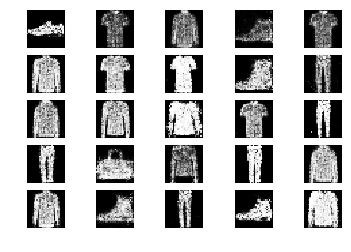

19401 [D loss: 0.673229, acc.: 60.94%] [G loss: 1.009264]
19402 [D loss: 0.693918, acc.: 56.25%] [G loss: 1.043281]
19403 [D loss: 0.730294, acc.: 46.88%] [G loss: 0.863456]
19404 [D loss: 0.634720, acc.: 67.19%] [G loss: 0.966600]
19405 [D loss: 0.641763, acc.: 60.94%] [G loss: 0.865353]
19406 [D loss: 0.612559, acc.: 76.56%] [G loss: 0.974654]
19407 [D loss: 0.592928, acc.: 64.06%] [G loss: 0.922885]
19408 [D loss: 0.609298, acc.: 68.75%] [G loss: 0.985771]
19409 [D loss: 0.682556, acc.: 54.69%] [G loss: 0.932691]
19410 [D loss: 0.636033, acc.: 67.19%] [G loss: 0.827218]
19411 [D loss: 0.669754, acc.: 60.94%] [G loss: 0.959164]
19412 [D loss: 0.681850, acc.: 56.25%] [G loss: 0.890803]
19413 [D loss: 0.589949, acc.: 73.44%] [G loss: 0.932659]
19414 [D loss: 0.678359, acc.: 62.50%] [G loss: 0.996888]
19415 [D loss: 0.659953, acc.: 54.69%] [G loss: 0.942940]
19416 [D loss: 0.628297, acc.: 65.62%] [G loss: 0.944383]
19417 [D loss: 0.612124, acc.: 62.50%] [G loss: 0.921866]
19418 [D loss:

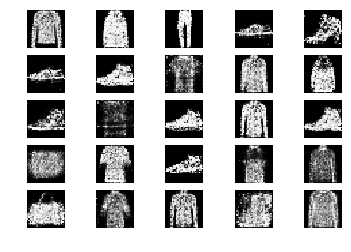

19601 [D loss: 0.683443, acc.: 51.56%] [G loss: 0.929994]
19602 [D loss: 0.647921, acc.: 67.19%] [G loss: 0.911509]
19603 [D loss: 0.687953, acc.: 56.25%] [G loss: 0.900003]
19604 [D loss: 0.835682, acc.: 32.81%] [G loss: 0.898752]
19605 [D loss: 0.651036, acc.: 59.38%] [G loss: 0.898856]
19606 [D loss: 0.589545, acc.: 71.88%] [G loss: 0.984510]
19607 [D loss: 0.586524, acc.: 70.31%] [G loss: 0.975635]
19608 [D loss: 0.598076, acc.: 71.88%] [G loss: 0.975271]
19609 [D loss: 0.702312, acc.: 60.94%] [G loss: 0.889370]
19610 [D loss: 0.645924, acc.: 64.06%] [G loss: 0.961007]
19611 [D loss: 0.625380, acc.: 65.62%] [G loss: 0.978420]
19612 [D loss: 0.587270, acc.: 75.00%] [G loss: 0.890627]
19613 [D loss: 0.628608, acc.: 60.94%] [G loss: 0.885454]
19614 [D loss: 0.647580, acc.: 57.81%] [G loss: 0.872215]
19615 [D loss: 0.635271, acc.: 65.62%] [G loss: 0.955154]
19616 [D loss: 0.649879, acc.: 62.50%] [G loss: 0.932114]
19617 [D loss: 0.683272, acc.: 54.69%] [G loss: 0.932824]
19618 [D loss:

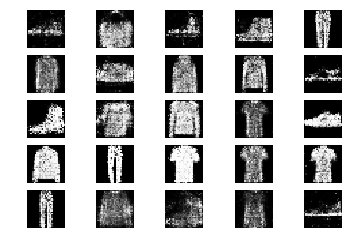

19801 [D loss: 0.602182, acc.: 68.75%] [G loss: 0.896042]
19802 [D loss: 0.660187, acc.: 57.81%] [G loss: 1.013212]
19803 [D loss: 0.617991, acc.: 68.75%] [G loss: 0.951961]
19804 [D loss: 0.577667, acc.: 68.75%] [G loss: 0.954055]
19805 [D loss: 0.630614, acc.: 68.75%] [G loss: 1.007130]
19806 [D loss: 0.606088, acc.: 71.88%] [G loss: 0.986491]
19807 [D loss: 0.615265, acc.: 75.00%] [G loss: 0.949251]
19808 [D loss: 0.653755, acc.: 57.81%] [G loss: 0.970317]
19809 [D loss: 0.596968, acc.: 76.56%] [G loss: 0.920645]
19810 [D loss: 0.636076, acc.: 67.19%] [G loss: 0.941127]
19811 [D loss: 0.680841, acc.: 59.38%] [G loss: 0.962552]
19812 [D loss: 0.649352, acc.: 59.38%] [G loss: 1.045809]
19813 [D loss: 0.615494, acc.: 68.75%] [G loss: 0.927611]
19814 [D loss: 0.678187, acc.: 64.06%] [G loss: 0.901804]
19815 [D loss: 0.671478, acc.: 57.81%] [G loss: 1.003527]
19816 [D loss: 0.659857, acc.: 54.69%] [G loss: 0.906148]
19817 [D loss: 0.612392, acc.: 65.62%] [G loss: 0.919729]
19818 [D loss:

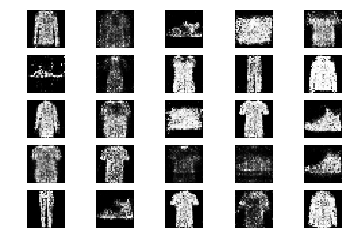

20001 [D loss: 0.658906, acc.: 60.94%] [G loss: 0.944084]
20002 [D loss: 0.718988, acc.: 53.12%] [G loss: 0.878793]
20003 [D loss: 0.642468, acc.: 60.94%] [G loss: 0.995362]
20004 [D loss: 0.604766, acc.: 62.50%] [G loss: 0.854570]
20005 [D loss: 0.690702, acc.: 56.25%] [G loss: 0.867184]
20006 [D loss: 0.618293, acc.: 62.50%] [G loss: 0.876168]
20007 [D loss: 0.661537, acc.: 51.56%] [G loss: 0.966662]
20008 [D loss: 0.663371, acc.: 59.38%] [G loss: 1.012458]
20009 [D loss: 0.703600, acc.: 59.38%] [G loss: 1.007385]
20010 [D loss: 0.696797, acc.: 43.75%] [G loss: 0.912257]
20011 [D loss: 0.689037, acc.: 56.25%] [G loss: 0.908023]
20012 [D loss: 0.644748, acc.: 67.19%] [G loss: 0.903064]
20013 [D loss: 0.618755, acc.: 67.19%] [G loss: 0.916099]
20014 [D loss: 0.648835, acc.: 56.25%] [G loss: 0.880259]
20015 [D loss: 0.675343, acc.: 67.19%] [G loss: 0.932264]
20016 [D loss: 0.668975, acc.: 60.94%] [G loss: 0.938435]
20017 [D loss: 0.637564, acc.: 59.38%] [G loss: 0.917725]
20018 [D loss:

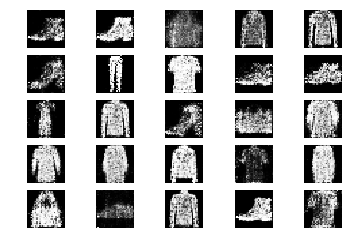

20201 [D loss: 0.637047, acc.: 62.50%] [G loss: 1.032384]
20202 [D loss: 0.678054, acc.: 59.38%] [G loss: 0.976594]
20203 [D loss: 0.682718, acc.: 51.56%] [G loss: 0.918446]
20204 [D loss: 0.657152, acc.: 59.38%] [G loss: 0.984860]
20205 [D loss: 0.674624, acc.: 62.50%] [G loss: 0.848748]
20206 [D loss: 0.622315, acc.: 62.50%] [G loss: 0.959000]
20207 [D loss: 0.658815, acc.: 59.38%] [G loss: 0.959905]
20208 [D loss: 0.596469, acc.: 67.19%] [G loss: 0.932542]
20209 [D loss: 0.577693, acc.: 68.75%] [G loss: 0.864135]
20210 [D loss: 0.643654, acc.: 62.50%] [G loss: 0.897845]
20211 [D loss: 0.591674, acc.: 67.19%] [G loss: 1.016212]
20212 [D loss: 0.570103, acc.: 79.69%] [G loss: 0.988923]
20213 [D loss: 0.614850, acc.: 68.75%] [G loss: 1.005874]
20214 [D loss: 0.591267, acc.: 67.19%] [G loss: 0.976242]
20215 [D loss: 0.641646, acc.: 67.19%] [G loss: 1.005064]
20216 [D loss: 0.639261, acc.: 62.50%] [G loss: 0.993273]
20217 [D loss: 0.654638, acc.: 62.50%] [G loss: 0.929593]
20218 [D loss:

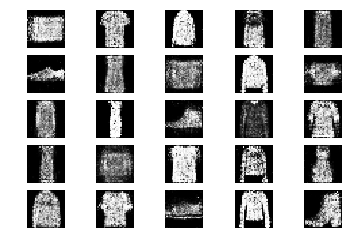

20401 [D loss: 0.612210, acc.: 65.62%] [G loss: 0.982740]
20402 [D loss: 0.648075, acc.: 68.75%] [G loss: 0.949809]
20403 [D loss: 0.634561, acc.: 68.75%] [G loss: 1.000901]
20404 [D loss: 0.647153, acc.: 62.50%] [G loss: 0.883778]
20405 [D loss: 0.606827, acc.: 62.50%] [G loss: 0.854693]
20406 [D loss: 0.610633, acc.: 62.50%] [G loss: 0.842661]
20407 [D loss: 0.639233, acc.: 65.62%] [G loss: 0.893082]
20408 [D loss: 0.643383, acc.: 56.25%] [G loss: 0.872716]
20409 [D loss: 0.562568, acc.: 67.19%] [G loss: 0.871125]
20410 [D loss: 0.690957, acc.: 50.00%] [G loss: 0.849173]
20411 [D loss: 0.627776, acc.: 65.62%] [G loss: 0.865023]
20412 [D loss: 0.587931, acc.: 62.50%] [G loss: 0.917179]
20413 [D loss: 0.613302, acc.: 67.19%] [G loss: 0.933125]
20414 [D loss: 0.644936, acc.: 71.88%] [G loss: 0.946654]
20415 [D loss: 0.664871, acc.: 53.12%] [G loss: 0.911093]
20416 [D loss: 0.593406, acc.: 68.75%] [G loss: 0.920301]
20417 [D loss: 0.690454, acc.: 59.38%] [G loss: 0.955010]
20418 [D loss:

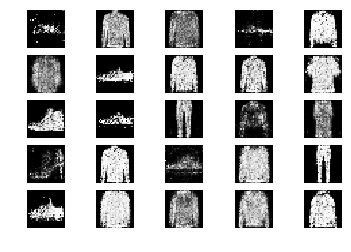

20601 [D loss: 0.617784, acc.: 67.19%] [G loss: 0.948970]
20602 [D loss: 0.655806, acc.: 59.38%] [G loss: 0.932015]
20603 [D loss: 0.660248, acc.: 57.81%] [G loss: 1.007598]
20604 [D loss: 0.592555, acc.: 70.31%] [G loss: 0.891095]
20605 [D loss: 0.785064, acc.: 46.88%] [G loss: 0.944803]
20606 [D loss: 0.678065, acc.: 59.38%] [G loss: 1.060396]
20607 [D loss: 0.590899, acc.: 84.38%] [G loss: 0.930199]
20608 [D loss: 0.644177, acc.: 65.62%] [G loss: 0.952070]
20609 [D loss: 0.674192, acc.: 60.94%] [G loss: 0.938486]
20610 [D loss: 0.660336, acc.: 56.25%] [G loss: 0.891297]
20611 [D loss: 0.625818, acc.: 62.50%] [G loss: 0.853703]
20612 [D loss: 0.657507, acc.: 65.62%] [G loss: 0.916767]
20613 [D loss: 0.634616, acc.: 64.06%] [G loss: 0.868049]
20614 [D loss: 0.616438, acc.: 73.44%] [G loss: 0.884900]
20615 [D loss: 0.593580, acc.: 64.06%] [G loss: 0.942628]
20616 [D loss: 0.665417, acc.: 67.19%] [G loss: 0.919926]
20617 [D loss: 0.649084, acc.: 60.94%] [G loss: 0.928583]
20618 [D loss:

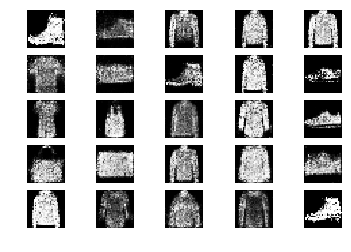

20801 [D loss: 0.642584, acc.: 64.06%] [G loss: 1.031046]
20802 [D loss: 0.622613, acc.: 71.88%] [G loss: 1.014580]
20803 [D loss: 0.732800, acc.: 59.38%] [G loss: 0.963708]
20804 [D loss: 0.623451, acc.: 62.50%] [G loss: 0.887958]
20805 [D loss: 0.613825, acc.: 67.19%] [G loss: 0.970542]
20806 [D loss: 0.661524, acc.: 54.69%] [G loss: 0.893345]
20807 [D loss: 0.676926, acc.: 56.25%] [G loss: 0.998979]
20808 [D loss: 0.670750, acc.: 64.06%] [G loss: 0.847128]
20809 [D loss: 0.639161, acc.: 67.19%] [G loss: 0.966305]
20810 [D loss: 0.677187, acc.: 64.06%] [G loss: 0.956436]
20811 [D loss: 0.658949, acc.: 59.38%] [G loss: 0.965770]
20812 [D loss: 0.640664, acc.: 57.81%] [G loss: 0.954579]
20813 [D loss: 0.600809, acc.: 71.88%] [G loss: 0.953520]
20814 [D loss: 0.614849, acc.: 65.62%] [G loss: 0.849556]
20815 [D loss: 0.667203, acc.: 60.94%] [G loss: 0.904079]
20816 [D loss: 0.671329, acc.: 59.38%] [G loss: 0.928351]
20817 [D loss: 0.675331, acc.: 53.12%] [G loss: 0.962007]
20818 [D loss:

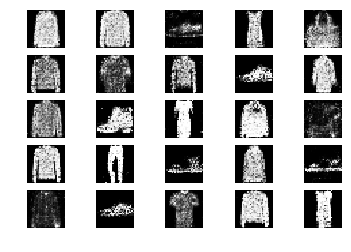

21001 [D loss: 0.666873, acc.: 62.50%] [G loss: 0.961965]
21002 [D loss: 0.725525, acc.: 56.25%] [G loss: 0.900767]
21003 [D loss: 0.694197, acc.: 56.25%] [G loss: 0.880264]
21004 [D loss: 0.680390, acc.: 59.38%] [G loss: 0.987843]
21005 [D loss: 0.629892, acc.: 67.19%] [G loss: 0.951954]
21006 [D loss: 0.639316, acc.: 67.19%] [G loss: 0.959316]
21007 [D loss: 0.579044, acc.: 75.00%] [G loss: 0.930593]
21008 [D loss: 0.653107, acc.: 59.38%] [G loss: 0.937271]
21009 [D loss: 0.660082, acc.: 68.75%] [G loss: 0.851348]
21010 [D loss: 0.599312, acc.: 68.75%] [G loss: 0.900823]
21011 [D loss: 0.637643, acc.: 68.75%] [G loss: 0.840559]
21012 [D loss: 0.575232, acc.: 70.31%] [G loss: 0.847774]
21013 [D loss: 0.635360, acc.: 67.19%] [G loss: 0.924136]
21014 [D loss: 0.688023, acc.: 56.25%] [G loss: 0.985664]
21015 [D loss: 0.579360, acc.: 70.31%] [G loss: 0.963012]
21016 [D loss: 0.617674, acc.: 68.75%] [G loss: 1.002514]
21017 [D loss: 0.654995, acc.: 64.06%] [G loss: 1.027944]
21018 [D loss:

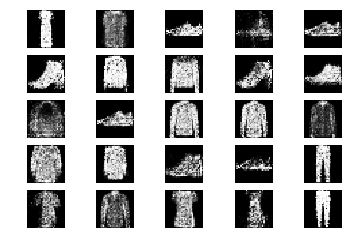

21201 [D loss: 0.678620, acc.: 59.38%] [G loss: 0.896371]
21202 [D loss: 0.618426, acc.: 67.19%] [G loss: 0.958209]
21203 [D loss: 0.634601, acc.: 65.62%] [G loss: 1.036462]
21204 [D loss: 0.638853, acc.: 67.19%] [G loss: 0.889170]
21205 [D loss: 0.648663, acc.: 68.75%] [G loss: 0.958992]
21206 [D loss: 0.559993, acc.: 75.00%] [G loss: 0.960542]
21207 [D loss: 0.684627, acc.: 57.81%] [G loss: 0.921360]
21208 [D loss: 0.618075, acc.: 64.06%] [G loss: 0.842793]
21209 [D loss: 0.688177, acc.: 57.81%] [G loss: 0.955213]
21210 [D loss: 0.691190, acc.: 60.94%] [G loss: 0.882616]
21211 [D loss: 0.577969, acc.: 73.44%] [G loss: 1.025603]
21212 [D loss: 0.685109, acc.: 57.81%] [G loss: 0.925480]
21213 [D loss: 0.675738, acc.: 51.56%] [G loss: 0.939472]
21214 [D loss: 0.643169, acc.: 67.19%] [G loss: 0.913747]
21215 [D loss: 0.686793, acc.: 57.81%] [G loss: 0.900028]
21216 [D loss: 0.656454, acc.: 60.94%] [G loss: 0.906282]
21217 [D loss: 0.624724, acc.: 60.94%] [G loss: 0.914433]
21218 [D loss:

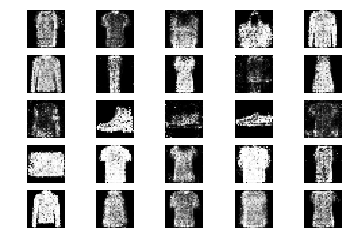

21401 [D loss: 0.669684, acc.: 57.81%] [G loss: 0.957722]
21402 [D loss: 0.646844, acc.: 64.06%] [G loss: 0.937716]
21403 [D loss: 0.636905, acc.: 62.50%] [G loss: 0.931849]
21404 [D loss: 0.591368, acc.: 68.75%] [G loss: 0.947608]
21405 [D loss: 0.616725, acc.: 67.19%] [G loss: 0.938573]
21406 [D loss: 0.611837, acc.: 68.75%] [G loss: 0.945993]
21407 [D loss: 0.634299, acc.: 68.75%] [G loss: 1.020047]
21408 [D loss: 0.595490, acc.: 67.19%] [G loss: 0.906150]
21409 [D loss: 0.657621, acc.: 59.38%] [G loss: 0.880156]
21410 [D loss: 0.631876, acc.: 64.06%] [G loss: 0.977457]
21411 [D loss: 0.656149, acc.: 64.06%] [G loss: 0.936993]
21412 [D loss: 0.624755, acc.: 62.50%] [G loss: 1.022063]
21413 [D loss: 0.679489, acc.: 59.38%] [G loss: 1.004255]
21414 [D loss: 0.668999, acc.: 57.81%] [G loss: 0.959309]
21415 [D loss: 0.606029, acc.: 71.88%] [G loss: 0.979315]
21416 [D loss: 0.632450, acc.: 65.62%] [G loss: 1.023445]
21417 [D loss: 0.637012, acc.: 65.62%] [G loss: 1.007787]
21418 [D loss:

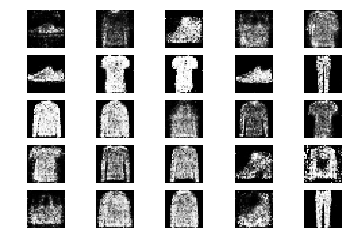

21601 [D loss: 0.741520, acc.: 57.81%] [G loss: 0.875636]
21602 [D loss: 0.601283, acc.: 71.88%] [G loss: 0.878553]
21603 [D loss: 0.659678, acc.: 56.25%] [G loss: 0.902081]
21604 [D loss: 0.678737, acc.: 62.50%] [G loss: 0.946600]
21605 [D loss: 0.685581, acc.: 54.69%] [G loss: 0.891060]
21606 [D loss: 0.603514, acc.: 65.62%] [G loss: 0.849754]
21607 [D loss: 0.654769, acc.: 60.94%] [G loss: 0.885190]
21608 [D loss: 0.598938, acc.: 70.31%] [G loss: 0.878203]
21609 [D loss: 0.630913, acc.: 65.62%] [G loss: 0.837175]
21610 [D loss: 0.591482, acc.: 70.31%] [G loss: 0.795796]
21611 [D loss: 0.602065, acc.: 62.50%] [G loss: 0.868046]
21612 [D loss: 0.636624, acc.: 65.62%] [G loss: 0.932884]
21613 [D loss: 0.716288, acc.: 54.69%] [G loss: 0.876109]
21614 [D loss: 0.634292, acc.: 64.06%] [G loss: 1.026912]
21615 [D loss: 0.687688, acc.: 54.69%] [G loss: 0.932932]
21616 [D loss: 0.616797, acc.: 67.19%] [G loss: 0.941240]
21617 [D loss: 0.632788, acc.: 60.94%] [G loss: 0.971737]
21618 [D loss:

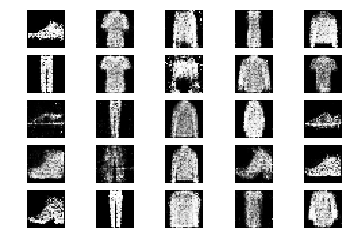

21801 [D loss: 0.638128, acc.: 57.81%] [G loss: 0.989802]
21802 [D loss: 0.725008, acc.: 53.12%] [G loss: 0.924150]
21803 [D loss: 0.595719, acc.: 76.56%] [G loss: 0.981110]
21804 [D loss: 0.688984, acc.: 54.69%] [G loss: 0.950934]
21805 [D loss: 0.680888, acc.: 56.25%] [G loss: 0.916795]
21806 [D loss: 0.715919, acc.: 59.38%] [G loss: 0.972869]
21807 [D loss: 0.605944, acc.: 65.62%] [G loss: 0.991256]
21808 [D loss: 0.642328, acc.: 67.19%] [G loss: 1.012151]
21809 [D loss: 0.627977, acc.: 64.06%] [G loss: 0.924393]
21810 [D loss: 0.582093, acc.: 67.19%] [G loss: 0.916234]
21811 [D loss: 0.627123, acc.: 68.75%] [G loss: 0.960115]
21812 [D loss: 0.609142, acc.: 62.50%] [G loss: 0.940432]
21813 [D loss: 0.670689, acc.: 62.50%] [G loss: 0.860383]
21814 [D loss: 0.636437, acc.: 60.94%] [G loss: 0.976025]
21815 [D loss: 0.680594, acc.: 51.56%] [G loss: 0.874254]
21816 [D loss: 0.622522, acc.: 60.94%] [G loss: 0.871115]
21817 [D loss: 0.713933, acc.: 57.81%] [G loss: 0.872141]
21818 [D loss:

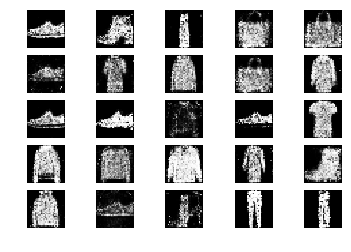

22001 [D loss: 0.696962, acc.: 62.50%] [G loss: 0.933994]
22002 [D loss: 0.666212, acc.: 60.94%] [G loss: 0.808223]
22003 [D loss: 0.658078, acc.: 56.25%] [G loss: 0.862896]
22004 [D loss: 0.658323, acc.: 64.06%] [G loss: 0.942245]
22005 [D loss: 0.660220, acc.: 56.25%] [G loss: 1.013196]
22006 [D loss: 0.706888, acc.: 60.94%] [G loss: 0.973984]
22007 [D loss: 0.677694, acc.: 54.69%] [G loss: 0.881571]
22008 [D loss: 0.630847, acc.: 67.19%] [G loss: 0.992904]
22009 [D loss: 0.663718, acc.: 59.38%] [G loss: 0.825793]
22010 [D loss: 0.643860, acc.: 60.94%] [G loss: 0.928559]
22011 [D loss: 0.675861, acc.: 57.81%] [G loss: 0.908420]
22012 [D loss: 0.663648, acc.: 54.69%] [G loss: 0.899087]
22013 [D loss: 0.619166, acc.: 64.06%] [G loss: 0.915730]
22014 [D loss: 0.622862, acc.: 68.75%] [G loss: 0.959700]
22015 [D loss: 0.688694, acc.: 51.56%] [G loss: 0.901364]
22016 [D loss: 0.612565, acc.: 68.75%] [G loss: 0.938172]
22017 [D loss: 0.644339, acc.: 62.50%] [G loss: 0.953369]
22018 [D loss:

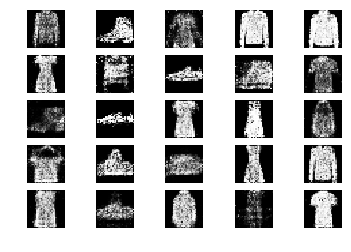

22201 [D loss: 0.617069, acc.: 64.06%] [G loss: 0.974065]
22202 [D loss: 0.596866, acc.: 65.62%] [G loss: 0.925560]
22203 [D loss: 0.666766, acc.: 56.25%] [G loss: 0.989027]
22204 [D loss: 0.646433, acc.: 60.94%] [G loss: 1.013485]
22205 [D loss: 0.708300, acc.: 59.38%] [G loss: 0.845500]
22206 [D loss: 0.655340, acc.: 65.62%] [G loss: 0.945837]
22207 [D loss: 0.677628, acc.: 57.81%] [G loss: 0.838886]
22208 [D loss: 0.706813, acc.: 56.25%] [G loss: 0.941327]
22209 [D loss: 0.656681, acc.: 67.19%] [G loss: 0.856923]
22210 [D loss: 0.670924, acc.: 54.69%] [G loss: 0.935088]
22211 [D loss: 0.601833, acc.: 60.94%] [G loss: 0.884996]
22212 [D loss: 0.702576, acc.: 53.12%] [G loss: 0.942889]
22213 [D loss: 0.580582, acc.: 70.31%] [G loss: 0.968475]
22214 [D loss: 0.678788, acc.: 62.50%] [G loss: 0.926614]
22215 [D loss: 0.695280, acc.: 60.94%] [G loss: 0.986667]
22216 [D loss: 0.629875, acc.: 68.75%] [G loss: 0.951108]
22217 [D loss: 0.587523, acc.: 73.44%] [G loss: 0.952054]
22218 [D loss:

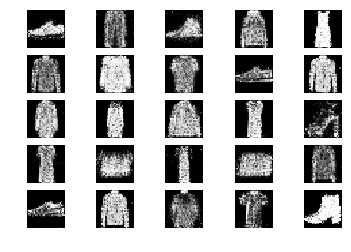

22401 [D loss: 0.671901, acc.: 59.38%] [G loss: 0.907143]
22402 [D loss: 0.681697, acc.: 51.56%] [G loss: 0.992485]
22403 [D loss: 0.637823, acc.: 62.50%] [G loss: 0.934056]
22404 [D loss: 0.632785, acc.: 60.94%] [G loss: 0.913380]
22405 [D loss: 0.600782, acc.: 67.19%] [G loss: 1.041996]
22406 [D loss: 0.643383, acc.: 64.06%] [G loss: 0.995310]
22407 [D loss: 0.654174, acc.: 57.81%] [G loss: 0.971259]
22408 [D loss: 0.603577, acc.: 68.75%] [G loss: 0.961344]
22409 [D loss: 0.649783, acc.: 64.06%] [G loss: 0.801198]
22410 [D loss: 0.688715, acc.: 54.69%] [G loss: 0.881082]
22411 [D loss: 0.659882, acc.: 60.94%] [G loss: 0.902244]
22412 [D loss: 0.675116, acc.: 54.69%] [G loss: 0.928587]
22413 [D loss: 0.640111, acc.: 65.62%] [G loss: 0.937214]
22414 [D loss: 0.617021, acc.: 67.19%] [G loss: 0.936108]
22415 [D loss: 0.647681, acc.: 54.69%] [G loss: 0.871503]
22416 [D loss: 0.690462, acc.: 53.12%] [G loss: 0.977778]
22417 [D loss: 0.626867, acc.: 64.06%] [G loss: 0.999123]
22418 [D loss:

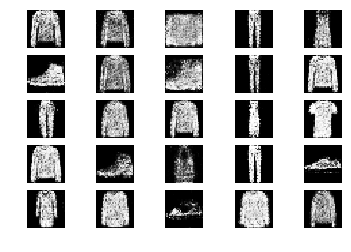

22601 [D loss: 0.646469, acc.: 54.69%] [G loss: 0.864132]
22602 [D loss: 0.719894, acc.: 51.56%] [G loss: 0.893684]
22603 [D loss: 0.617704, acc.: 65.62%] [G loss: 0.951825]
22604 [D loss: 0.616857, acc.: 70.31%] [G loss: 0.916885]
22605 [D loss: 0.654793, acc.: 68.75%] [G loss: 0.931399]
22606 [D loss: 0.690136, acc.: 54.69%] [G loss: 0.909583]
22607 [D loss: 0.718404, acc.: 56.25%] [G loss: 0.903278]
22608 [D loss: 0.612692, acc.: 68.75%] [G loss: 0.878011]
22609 [D loss: 0.690166, acc.: 56.25%] [G loss: 0.904564]
22610 [D loss: 0.660541, acc.: 54.69%] [G loss: 0.835693]
22611 [D loss: 0.654747, acc.: 59.38%] [G loss: 0.908744]
22612 [D loss: 0.631011, acc.: 64.06%] [G loss: 0.943416]
22613 [D loss: 0.640734, acc.: 62.50%] [G loss: 0.894986]
22614 [D loss: 0.598650, acc.: 67.19%] [G loss: 0.850974]
22615 [D loss: 0.600682, acc.: 70.31%] [G loss: 0.918642]
22616 [D loss: 0.677459, acc.: 56.25%] [G loss: 0.945479]
22617 [D loss: 0.709338, acc.: 56.25%] [G loss: 0.919895]
22618 [D loss:

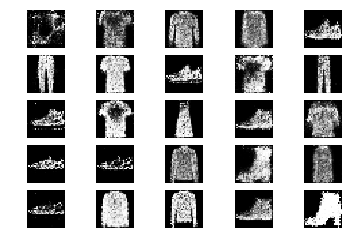

22801 [D loss: 0.578618, acc.: 76.56%] [G loss: 1.023027]
22802 [D loss: 0.667924, acc.: 53.12%] [G loss: 0.905314]
22803 [D loss: 0.590595, acc.: 70.31%] [G loss: 0.893176]
22804 [D loss: 0.707385, acc.: 59.38%] [G loss: 0.978823]
22805 [D loss: 0.708542, acc.: 56.25%] [G loss: 0.917458]
22806 [D loss: 0.714304, acc.: 53.12%] [G loss: 0.988165]
22807 [D loss: 0.664571, acc.: 60.94%] [G loss: 0.996116]
22808 [D loss: 0.619047, acc.: 68.75%] [G loss: 0.901089]
22809 [D loss: 0.698843, acc.: 60.94%] [G loss: 1.015561]
22810 [D loss: 0.584746, acc.: 70.31%] [G loss: 0.988754]
22811 [D loss: 0.628748, acc.: 68.75%] [G loss: 1.050677]
22812 [D loss: 0.634982, acc.: 65.62%] [G loss: 0.878599]
22813 [D loss: 0.638901, acc.: 65.62%] [G loss: 1.043658]
22814 [D loss: 0.682880, acc.: 62.50%] [G loss: 0.857594]
22815 [D loss: 0.598278, acc.: 71.88%] [G loss: 0.880359]
22816 [D loss: 0.654829, acc.: 57.81%] [G loss: 0.967902]
22817 [D loss: 0.659820, acc.: 67.19%] [G loss: 0.996873]
22818 [D loss:

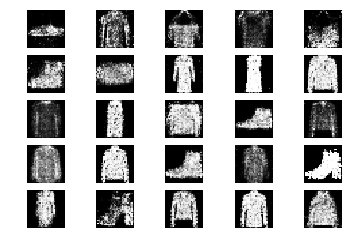

23001 [D loss: 0.663084, acc.: 57.81%] [G loss: 1.004781]
23002 [D loss: 0.629146, acc.: 64.06%] [G loss: 0.936987]
23003 [D loss: 0.655178, acc.: 56.25%] [G loss: 0.955497]
23004 [D loss: 0.668980, acc.: 57.81%] [G loss: 1.042975]
23005 [D loss: 0.611485, acc.: 64.06%] [G loss: 0.882647]
23006 [D loss: 0.610205, acc.: 65.62%] [G loss: 0.969347]
23007 [D loss: 0.614387, acc.: 64.06%] [G loss: 0.900254]
23008 [D loss: 0.631850, acc.: 60.94%] [G loss: 0.837614]
23009 [D loss: 0.702777, acc.: 51.56%] [G loss: 0.864381]
23010 [D loss: 0.613055, acc.: 67.19%] [G loss: 0.953247]
23011 [D loss: 0.604255, acc.: 68.75%] [G loss: 0.979649]
23012 [D loss: 0.628459, acc.: 62.50%] [G loss: 0.926249]
23013 [D loss: 0.682172, acc.: 54.69%] [G loss: 1.001095]
23014 [D loss: 0.711944, acc.: 48.44%] [G loss: 0.934340]
23015 [D loss: 0.560087, acc.: 68.75%] [G loss: 0.929197]
23016 [D loss: 0.611880, acc.: 71.88%] [G loss: 0.864571]
23017 [D loss: 0.654241, acc.: 59.38%] [G loss: 0.921089]
23018 [D loss:

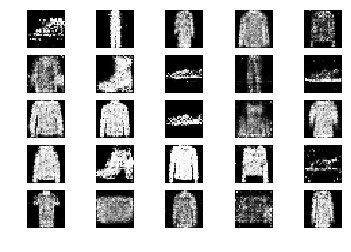

23201 [D loss: 0.648115, acc.: 62.50%] [G loss: 0.943485]
23202 [D loss: 0.694219, acc.: 56.25%] [G loss: 0.985891]
23203 [D loss: 0.666516, acc.: 57.81%] [G loss: 0.891264]
23204 [D loss: 0.656973, acc.: 57.81%] [G loss: 0.902045]
23205 [D loss: 0.632241, acc.: 67.19%] [G loss: 0.890839]
23206 [D loss: 0.658542, acc.: 60.94%] [G loss: 0.921153]
23207 [D loss: 0.726959, acc.: 51.56%] [G loss: 0.889152]
23208 [D loss: 0.690979, acc.: 59.38%] [G loss: 0.912520]
23209 [D loss: 0.620470, acc.: 70.31%] [G loss: 0.889630]
23210 [D loss: 0.630848, acc.: 67.19%] [G loss: 0.989306]
23211 [D loss: 0.659641, acc.: 50.00%] [G loss: 0.945913]
23212 [D loss: 0.711783, acc.: 46.88%] [G loss: 0.968292]
23213 [D loss: 0.610130, acc.: 65.62%] [G loss: 1.049746]
23214 [D loss: 0.647062, acc.: 59.38%] [G loss: 1.053995]
23215 [D loss: 0.629813, acc.: 59.38%] [G loss: 1.021859]
23216 [D loss: 0.683758, acc.: 56.25%] [G loss: 1.023227]
23217 [D loss: 0.657021, acc.: 59.38%] [G loss: 0.883679]
23218 [D loss:

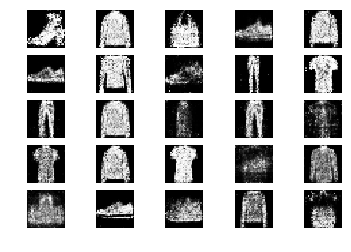

23401 [D loss: 0.663411, acc.: 62.50%] [G loss: 0.900799]
23402 [D loss: 0.588511, acc.: 64.06%] [G loss: 0.920812]
23403 [D loss: 0.659728, acc.: 56.25%] [G loss: 0.925859]
23404 [D loss: 0.620911, acc.: 67.19%] [G loss: 0.975454]
23405 [D loss: 0.686633, acc.: 57.81%] [G loss: 0.917308]
23406 [D loss: 0.639857, acc.: 70.31%] [G loss: 0.944581]
23407 [D loss: 0.647451, acc.: 64.06%] [G loss: 0.931848]
23408 [D loss: 0.670415, acc.: 56.25%] [G loss: 0.959353]
23409 [D loss: 0.663492, acc.: 59.38%] [G loss: 0.975826]
23410 [D loss: 0.692261, acc.: 53.12%] [G loss: 0.954281]
23411 [D loss: 0.651586, acc.: 60.94%] [G loss: 1.000518]
23412 [D loss: 0.651599, acc.: 57.81%] [G loss: 0.936200]
23413 [D loss: 0.642543, acc.: 64.06%] [G loss: 0.868199]
23414 [D loss: 0.689090, acc.: 56.25%] [G loss: 0.921067]
23415 [D loss: 0.622975, acc.: 65.62%] [G loss: 0.960681]
23416 [D loss: 0.638540, acc.: 56.25%] [G loss: 0.932605]
23417 [D loss: 0.646108, acc.: 59.38%] [G loss: 0.936269]
23418 [D loss:

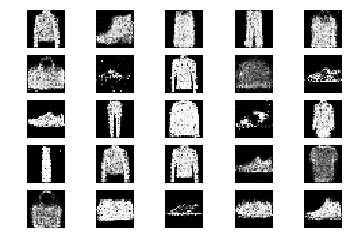

23601 [D loss: 0.701654, acc.: 50.00%] [G loss: 0.832791]
23602 [D loss: 0.664000, acc.: 59.38%] [G loss: 0.982690]
23603 [D loss: 0.683775, acc.: 54.69%] [G loss: 0.995677]
23604 [D loss: 0.645757, acc.: 65.62%] [G loss: 1.045248]
23605 [D loss: 0.635429, acc.: 71.88%] [G loss: 0.939348]
23606 [D loss: 0.720323, acc.: 50.00%] [G loss: 0.987651]
23607 [D loss: 0.579745, acc.: 68.75%] [G loss: 0.861989]
23608 [D loss: 0.637028, acc.: 64.06%] [G loss: 0.895891]
23609 [D loss: 0.659329, acc.: 64.06%] [G loss: 0.744894]
23610 [D loss: 0.702263, acc.: 54.69%] [G loss: 0.951215]
23611 [D loss: 0.639723, acc.: 59.38%] [G loss: 0.945240]
23612 [D loss: 0.528556, acc.: 76.56%] [G loss: 0.876873]
23613 [D loss: 0.630935, acc.: 64.06%] [G loss: 0.862075]
23614 [D loss: 0.687082, acc.: 56.25%] [G loss: 0.999578]
23615 [D loss: 0.553449, acc.: 70.31%] [G loss: 0.964279]
23616 [D loss: 0.643396, acc.: 64.06%] [G loss: 1.011590]
23617 [D loss: 0.632184, acc.: 64.06%] [G loss: 0.948964]
23618 [D loss:

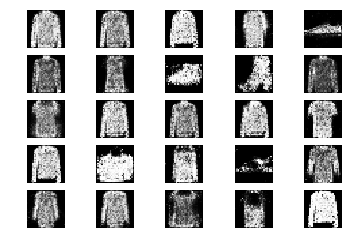

23801 [D loss: 0.641865, acc.: 65.62%] [G loss: 0.848363]
23802 [D loss: 0.647658, acc.: 46.88%] [G loss: 0.960111]
23803 [D loss: 0.682230, acc.: 45.31%] [G loss: 0.904427]
23804 [D loss: 0.690517, acc.: 54.69%] [G loss: 0.931791]
23805 [D loss: 0.689260, acc.: 56.25%] [G loss: 0.882459]
23806 [D loss: 0.624114, acc.: 62.50%] [G loss: 0.898720]
23807 [D loss: 0.602489, acc.: 73.44%] [G loss: 0.896455]
23808 [D loss: 0.656277, acc.: 64.06%] [G loss: 0.934711]
23809 [D loss: 0.654379, acc.: 56.25%] [G loss: 0.980575]
23810 [D loss: 0.658656, acc.: 57.81%] [G loss: 1.004371]
23811 [D loss: 0.641264, acc.: 64.06%] [G loss: 0.939947]
23812 [D loss: 0.636298, acc.: 65.62%] [G loss: 0.923023]
23813 [D loss: 0.587979, acc.: 78.12%] [G loss: 0.947567]
23814 [D loss: 0.648670, acc.: 59.38%] [G loss: 0.986966]
23815 [D loss: 0.613255, acc.: 67.19%] [G loss: 0.989043]
23816 [D loss: 0.648616, acc.: 62.50%] [G loss: 0.904099]
23817 [D loss: 0.613293, acc.: 67.19%] [G loss: 0.934014]
23818 [D loss:

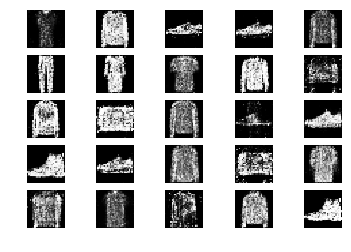

24001 [D loss: 0.678798, acc.: 60.94%] [G loss: 0.884090]
24002 [D loss: 0.616134, acc.: 60.94%] [G loss: 0.865152]
24003 [D loss: 0.646591, acc.: 60.94%] [G loss: 1.013435]
24004 [D loss: 0.693212, acc.: 45.31%] [G loss: 0.956400]
24005 [D loss: 0.593557, acc.: 67.19%] [G loss: 0.991059]
24006 [D loss: 0.644599, acc.: 67.19%] [G loss: 0.918854]
24007 [D loss: 0.627240, acc.: 60.94%] [G loss: 0.962556]
24008 [D loss: 0.639441, acc.: 70.31%] [G loss: 1.081359]
24009 [D loss: 0.648320, acc.: 51.56%] [G loss: 0.985348]
24010 [D loss: 0.642302, acc.: 60.94%] [G loss: 1.055537]
24011 [D loss: 0.626119, acc.: 67.19%] [G loss: 0.930862]
24012 [D loss: 0.579308, acc.: 70.31%] [G loss: 1.039632]
24013 [D loss: 0.664686, acc.: 59.38%] [G loss: 0.986394]
24014 [D loss: 0.618588, acc.: 64.06%] [G loss: 0.935851]
24015 [D loss: 0.637274, acc.: 60.94%] [G loss: 0.901028]
24016 [D loss: 0.600007, acc.: 64.06%] [G loss: 0.921511]
24017 [D loss: 0.679737, acc.: 57.81%] [G loss: 0.854922]
24018 [D loss:

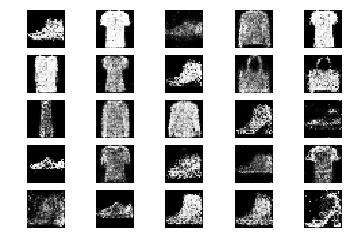

24201 [D loss: 0.677531, acc.: 65.62%] [G loss: 0.954309]
24202 [D loss: 0.642057, acc.: 59.38%] [G loss: 0.958316]
24203 [D loss: 0.557283, acc.: 75.00%] [G loss: 1.016261]
24204 [D loss: 0.665967, acc.: 56.25%] [G loss: 1.002526]
24205 [D loss: 0.619218, acc.: 64.06%] [G loss: 1.021187]
24206 [D loss: 0.619377, acc.: 65.62%] [G loss: 0.935047]
24207 [D loss: 0.651161, acc.: 57.81%] [G loss: 0.985790]
24208 [D loss: 0.640893, acc.: 59.38%] [G loss: 0.919086]
24209 [D loss: 0.599032, acc.: 71.88%] [G loss: 1.087847]
24210 [D loss: 0.571143, acc.: 75.00%] [G loss: 0.949667]
24211 [D loss: 0.691627, acc.: 57.81%] [G loss: 1.010885]
24212 [D loss: 0.620003, acc.: 67.19%] [G loss: 1.031869]
24213 [D loss: 0.639637, acc.: 60.94%] [G loss: 0.941558]
24214 [D loss: 0.696824, acc.: 48.44%] [G loss: 0.971929]
24215 [D loss: 0.669254, acc.: 54.69%] [G loss: 0.864504]
24216 [D loss: 0.642043, acc.: 62.50%] [G loss: 0.902541]
24217 [D loss: 0.628347, acc.: 65.62%] [G loss: 0.839904]
24218 [D loss:

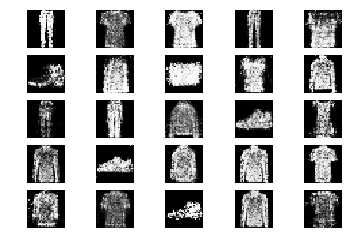

24401 [D loss: 0.703508, acc.: 60.94%] [G loss: 0.985613]
24402 [D loss: 0.705028, acc.: 57.81%] [G loss: 0.954603]
24403 [D loss: 0.637625, acc.: 68.75%] [G loss: 0.982695]
24404 [D loss: 0.635682, acc.: 59.38%] [G loss: 1.016138]
24405 [D loss: 0.590574, acc.: 67.19%] [G loss: 0.904535]
24406 [D loss: 0.673420, acc.: 62.50%] [G loss: 0.907439]
24407 [D loss: 0.670822, acc.: 54.69%] [G loss: 0.915148]
24408 [D loss: 0.582636, acc.: 71.88%] [G loss: 1.086251]
24409 [D loss: 0.627208, acc.: 68.75%] [G loss: 0.908303]
24410 [D loss: 0.644312, acc.: 60.94%] [G loss: 1.026686]
24411 [D loss: 0.623628, acc.: 60.94%] [G loss: 0.967942]
24412 [D loss: 0.660378, acc.: 60.94%] [G loss: 1.008259]
24413 [D loss: 0.695771, acc.: 56.25%] [G loss: 1.007159]
24414 [D loss: 0.670204, acc.: 60.94%] [G loss: 1.106815]
24415 [D loss: 0.687477, acc.: 57.81%] [G loss: 1.047433]
24416 [D loss: 0.628511, acc.: 60.94%] [G loss: 0.955517]
24417 [D loss: 0.523074, acc.: 81.25%] [G loss: 1.022870]
24418 [D loss:

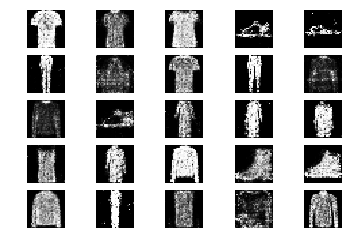

24601 [D loss: 0.591270, acc.: 68.75%] [G loss: 0.894617]
24602 [D loss: 0.607356, acc.: 71.88%] [G loss: 0.887427]
24603 [D loss: 0.756866, acc.: 45.31%] [G loss: 0.933547]
24604 [D loss: 0.612640, acc.: 70.31%] [G loss: 1.001572]
24605 [D loss: 0.647870, acc.: 62.50%] [G loss: 1.062775]
24606 [D loss: 0.636872, acc.: 68.75%] [G loss: 0.961363]
24607 [D loss: 0.634201, acc.: 57.81%] [G loss: 0.988943]
24608 [D loss: 0.631711, acc.: 65.62%] [G loss: 0.947530]
24609 [D loss: 0.676424, acc.: 59.38%] [G loss: 0.855704]
24610 [D loss: 0.642710, acc.: 65.62%] [G loss: 0.846221]
24611 [D loss: 0.648160, acc.: 59.38%] [G loss: 0.867241]
24612 [D loss: 0.693485, acc.: 56.25%] [G loss: 0.907134]
24613 [D loss: 0.736224, acc.: 48.44%] [G loss: 0.909382]
24614 [D loss: 0.660340, acc.: 60.94%] [G loss: 0.941954]
24615 [D loss: 0.596277, acc.: 70.31%] [G loss: 1.025653]
24616 [D loss: 0.734692, acc.: 56.25%] [G loss: 0.861441]
24617 [D loss: 0.682391, acc.: 60.94%] [G loss: 0.921768]
24618 [D loss:

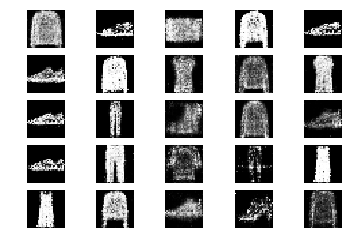

24801 [D loss: 0.686242, acc.: 64.06%] [G loss: 0.990701]
24802 [D loss: 0.592887, acc.: 70.31%] [G loss: 0.914240]
24803 [D loss: 0.679983, acc.: 57.81%] [G loss: 0.974992]
24804 [D loss: 0.699596, acc.: 50.00%] [G loss: 0.931025]
24805 [D loss: 0.592328, acc.: 67.19%] [G loss: 0.955492]
24806 [D loss: 0.621199, acc.: 64.06%] [G loss: 0.959236]
24807 [D loss: 0.613987, acc.: 71.88%] [G loss: 0.947653]
24808 [D loss: 0.638199, acc.: 70.31%] [G loss: 0.981673]
24809 [D loss: 0.625840, acc.: 70.31%] [G loss: 0.892393]
24810 [D loss: 0.570478, acc.: 75.00%] [G loss: 0.918144]
24811 [D loss: 0.587212, acc.: 68.75%] [G loss: 0.986602]
24812 [D loss: 0.558444, acc.: 73.44%] [G loss: 0.868585]
24813 [D loss: 0.649017, acc.: 60.94%] [G loss: 0.887707]
24814 [D loss: 0.631393, acc.: 62.50%] [G loss: 0.944366]
24815 [D loss: 0.710335, acc.: 54.69%] [G loss: 0.944926]
24816 [D loss: 0.635675, acc.: 60.94%] [G loss: 1.037718]
24817 [D loss: 0.748610, acc.: 50.00%] [G loss: 1.085333]
24818 [D loss:

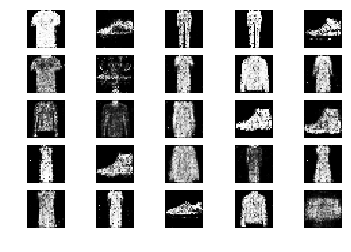

25001 [D loss: 0.520060, acc.: 84.38%] [G loss: 0.873188]
25002 [D loss: 0.596053, acc.: 76.56%] [G loss: 0.871562]
25003 [D loss: 0.610948, acc.: 64.06%] [G loss: 0.883340]
25004 [D loss: 0.589955, acc.: 73.44%] [G loss: 0.846256]
25005 [D loss: 0.603256, acc.: 64.06%] [G loss: 0.918576]
25006 [D loss: 0.612038, acc.: 67.19%] [G loss: 0.954795]
25007 [D loss: 0.612021, acc.: 62.50%] [G loss: 0.915265]
25008 [D loss: 0.620670, acc.: 64.06%] [G loss: 0.944050]
25009 [D loss: 0.671322, acc.: 59.38%] [G loss: 0.901064]
25010 [D loss: 0.641518, acc.: 62.50%] [G loss: 0.958463]
25011 [D loss: 0.658113, acc.: 67.19%] [G loss: 0.931845]
25012 [D loss: 0.604898, acc.: 60.94%] [G loss: 0.953604]
25013 [D loss: 0.589068, acc.: 75.00%] [G loss: 0.902938]
25014 [D loss: 0.708022, acc.: 51.56%] [G loss: 0.883091]
25015 [D loss: 0.683056, acc.: 59.38%] [G loss: 0.920514]
25016 [D loss: 0.600166, acc.: 71.88%] [G loss: 0.990428]
25017 [D loss: 0.635761, acc.: 64.06%] [G loss: 0.957169]
25018 [D loss:

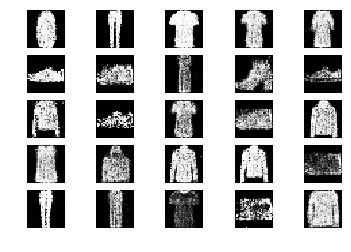

25201 [D loss: 0.583689, acc.: 71.88%] [G loss: 0.853019]
25202 [D loss: 0.626919, acc.: 64.06%] [G loss: 1.070676]
25203 [D loss: 0.689898, acc.: 57.81%] [G loss: 0.944827]
25204 [D loss: 0.634794, acc.: 65.62%] [G loss: 0.941858]
25205 [D loss: 0.677062, acc.: 62.50%] [G loss: 0.918451]
25206 [D loss: 0.686856, acc.: 53.12%] [G loss: 0.923773]
25207 [D loss: 0.610524, acc.: 67.19%] [G loss: 0.972756]
25208 [D loss: 0.670081, acc.: 57.81%] [G loss: 1.019947]
25209 [D loss: 0.688288, acc.: 53.12%] [G loss: 0.991811]
25210 [D loss: 0.658825, acc.: 62.50%] [G loss: 0.928533]
25211 [D loss: 0.628218, acc.: 67.19%] [G loss: 0.960018]
25212 [D loss: 0.592966, acc.: 67.19%] [G loss: 0.929268]
25213 [D loss: 0.557238, acc.: 71.88%] [G loss: 0.953696]
25214 [D loss: 0.627757, acc.: 62.50%] [G loss: 0.974754]
25215 [D loss: 0.634203, acc.: 62.50%] [G loss: 1.075744]
25216 [D loss: 0.617046, acc.: 64.06%] [G loss: 0.984671]
25217 [D loss: 0.651528, acc.: 56.25%] [G loss: 0.929008]
25218 [D loss:

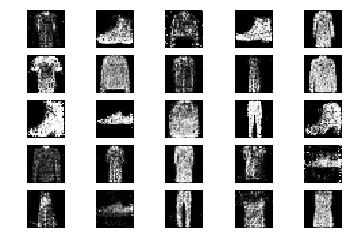

25401 [D loss: 0.673274, acc.: 60.94%] [G loss: 0.983093]
25402 [D loss: 0.581807, acc.: 68.75%] [G loss: 0.927973]
25403 [D loss: 0.716567, acc.: 59.38%] [G loss: 1.040619]
25404 [D loss: 0.600620, acc.: 76.56%] [G loss: 0.868435]
25405 [D loss: 0.707706, acc.: 60.94%] [G loss: 0.910257]
25406 [D loss: 0.574630, acc.: 68.75%] [G loss: 0.771126]
25407 [D loss: 0.730014, acc.: 46.88%] [G loss: 0.918995]
25408 [D loss: 0.638081, acc.: 59.38%] [G loss: 0.915794]
25409 [D loss: 0.643064, acc.: 64.06%] [G loss: 1.014833]
25410 [D loss: 0.638898, acc.: 62.50%] [G loss: 1.056599]
25411 [D loss: 0.620250, acc.: 71.88%] [G loss: 0.980881]
25412 [D loss: 0.559661, acc.: 75.00%] [G loss: 1.124858]
25413 [D loss: 0.647382, acc.: 62.50%] [G loss: 0.975389]
25414 [D loss: 0.572345, acc.: 79.69%] [G loss: 1.057111]
25415 [D loss: 0.626631, acc.: 68.75%] [G loss: 0.993828]
25416 [D loss: 0.680543, acc.: 56.25%] [G loss: 0.915773]
25417 [D loss: 0.640304, acc.: 68.75%] [G loss: 1.031322]
25418 [D loss:

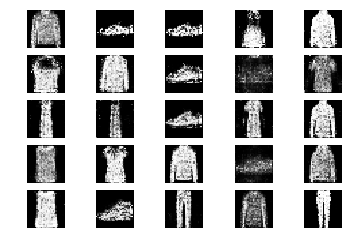

25601 [D loss: 0.731842, acc.: 42.19%] [G loss: 1.030455]
25602 [D loss: 0.630518, acc.: 64.06%] [G loss: 1.038552]
25603 [D loss: 0.627622, acc.: 64.06%] [G loss: 1.004177]
25604 [D loss: 0.639963, acc.: 59.38%] [G loss: 0.986490]
25605 [D loss: 0.618022, acc.: 71.88%] [G loss: 0.956816]
25606 [D loss: 0.589901, acc.: 70.31%] [G loss: 1.140758]
25607 [D loss: 0.695744, acc.: 57.81%] [G loss: 0.942429]
25608 [D loss: 0.696225, acc.: 56.25%] [G loss: 0.911105]
25609 [D loss: 0.618244, acc.: 67.19%] [G loss: 0.911095]
25610 [D loss: 0.602204, acc.: 70.31%] [G loss: 0.869230]
25611 [D loss: 0.578537, acc.: 68.75%] [G loss: 0.880905]
25612 [D loss: 0.675923, acc.: 56.25%] [G loss: 0.961206]
25613 [D loss: 0.569721, acc.: 70.31%] [G loss: 0.937869]
25614 [D loss: 0.653534, acc.: 62.50%] [G loss: 0.950907]
25615 [D loss: 0.591454, acc.: 68.75%] [G loss: 0.955797]
25616 [D loss: 0.639210, acc.: 53.12%] [G loss: 1.038789]
25617 [D loss: 0.687069, acc.: 62.50%] [G loss: 1.019382]
25618 [D loss:

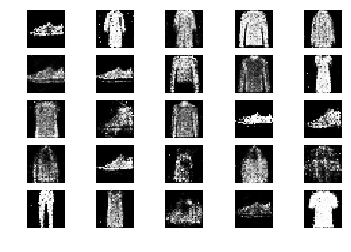

25801 [D loss: 0.633202, acc.: 64.06%] [G loss: 0.984416]
25802 [D loss: 0.631731, acc.: 68.75%] [G loss: 0.964432]
25803 [D loss: 0.562859, acc.: 67.19%] [G loss: 1.034552]
25804 [D loss: 0.583447, acc.: 65.62%] [G loss: 1.055371]
25805 [D loss: 0.619832, acc.: 64.06%] [G loss: 1.117806]
25806 [D loss: 0.702272, acc.: 64.06%] [G loss: 1.052572]
25807 [D loss: 0.621792, acc.: 64.06%] [G loss: 1.042915]
25808 [D loss: 0.732490, acc.: 51.56%] [G loss: 0.932399]
25809 [D loss: 0.591074, acc.: 65.62%] [G loss: 0.865307]
25810 [D loss: 0.664278, acc.: 57.81%] [G loss: 0.876299]
25811 [D loss: 0.683658, acc.: 64.06%] [G loss: 0.995073]
25812 [D loss: 0.608021, acc.: 64.06%] [G loss: 0.964385]
25813 [D loss: 0.628723, acc.: 59.38%] [G loss: 0.926220]
25814 [D loss: 0.591377, acc.: 67.19%] [G loss: 1.055591]
25815 [D loss: 0.646303, acc.: 62.50%] [G loss: 1.119050]
25816 [D loss: 0.669266, acc.: 62.50%] [G loss: 1.013379]
25817 [D loss: 0.584311, acc.: 70.31%] [G loss: 1.082219]
25818 [D loss:

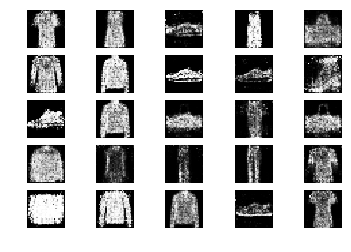

26001 [D loss: 0.618820, acc.: 59.38%] [G loss: 1.020544]
26002 [D loss: 0.651056, acc.: 60.94%] [G loss: 0.997646]
26003 [D loss: 0.608902, acc.: 60.94%] [G loss: 1.076822]
26004 [D loss: 0.681298, acc.: 64.06%] [G loss: 1.021852]
26005 [D loss: 0.606774, acc.: 60.94%] [G loss: 0.964691]
26006 [D loss: 0.607994, acc.: 67.19%] [G loss: 0.926356]
26007 [D loss: 0.639305, acc.: 71.88%] [G loss: 1.035196]
26008 [D loss: 0.577737, acc.: 64.06%] [G loss: 1.046674]
26009 [D loss: 0.689701, acc.: 54.69%] [G loss: 0.978323]
26010 [D loss: 0.667914, acc.: 56.25%] [G loss: 0.916484]
26011 [D loss: 0.641475, acc.: 60.94%] [G loss: 0.939221]
26012 [D loss: 0.576961, acc.: 70.31%] [G loss: 0.908539]
26013 [D loss: 0.641251, acc.: 60.94%] [G loss: 0.893778]
26014 [D loss: 0.602453, acc.: 71.88%] [G loss: 0.952326]
26015 [D loss: 0.643142, acc.: 62.50%] [G loss: 0.879444]
26016 [D loss: 0.631931, acc.: 59.38%] [G loss: 0.986061]
26017 [D loss: 0.707021, acc.: 51.56%] [G loss: 0.923450]
26018 [D loss:

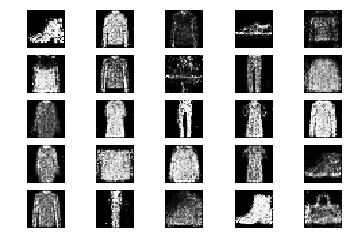

26201 [D loss: 0.655465, acc.: 59.38%] [G loss: 0.866556]
26202 [D loss: 0.629920, acc.: 67.19%] [G loss: 0.918335]
26203 [D loss: 0.662248, acc.: 56.25%] [G loss: 0.962535]
26204 [D loss: 0.675156, acc.: 57.81%] [G loss: 0.924069]
26205 [D loss: 0.654893, acc.: 54.69%] [G loss: 1.063737]
26206 [D loss: 0.674386, acc.: 57.81%] [G loss: 0.941772]
26207 [D loss: 0.571822, acc.: 78.12%] [G loss: 1.054242]
26208 [D loss: 0.589942, acc.: 73.44%] [G loss: 0.980060]
26209 [D loss: 0.587146, acc.: 68.75%] [G loss: 1.049473]
26210 [D loss: 0.648877, acc.: 60.94%] [G loss: 1.018364]
26211 [D loss: 0.627974, acc.: 70.31%] [G loss: 1.017501]
26212 [D loss: 0.659842, acc.: 56.25%] [G loss: 0.969170]
26213 [D loss: 0.617415, acc.: 65.62%] [G loss: 0.979006]
26214 [D loss: 0.627519, acc.: 59.38%] [G loss: 1.010769]
26215 [D loss: 0.648302, acc.: 59.38%] [G loss: 0.940361]
26216 [D loss: 0.560746, acc.: 75.00%] [G loss: 1.004673]
26217 [D loss: 0.615994, acc.: 64.06%] [G loss: 0.892566]
26218 [D loss:

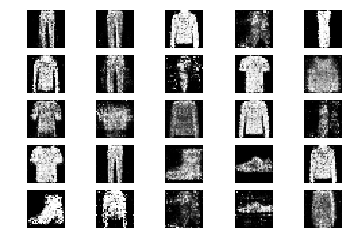

26401 [D loss: 0.651159, acc.: 60.94%] [G loss: 0.999130]
26402 [D loss: 0.629591, acc.: 60.94%] [G loss: 0.925005]
26403 [D loss: 0.563746, acc.: 68.75%] [G loss: 0.978352]
26404 [D loss: 0.653578, acc.: 65.62%] [G loss: 0.962538]
26405 [D loss: 0.647540, acc.: 53.12%] [G loss: 0.924062]
26406 [D loss: 0.610741, acc.: 65.62%] [G loss: 1.020357]
26407 [D loss: 0.594543, acc.: 70.31%] [G loss: 0.942174]
26408 [D loss: 0.682510, acc.: 51.56%] [G loss: 1.019967]
26409 [D loss: 0.600795, acc.: 71.88%] [G loss: 1.002374]
26410 [D loss: 0.691395, acc.: 59.38%] [G loss: 0.928303]
26411 [D loss: 0.684365, acc.: 57.81%] [G loss: 0.949865]
26412 [D loss: 0.674197, acc.: 53.12%] [G loss: 0.914766]
26413 [D loss: 0.572631, acc.: 73.44%] [G loss: 1.043044]
26414 [D loss: 0.653259, acc.: 62.50%] [G loss: 0.930776]
26415 [D loss: 0.612846, acc.: 65.62%] [G loss: 0.963072]
26416 [D loss: 0.669448, acc.: 59.38%] [G loss: 0.849784]
26417 [D loss: 0.606358, acc.: 70.31%] [G loss: 0.957517]
26418 [D loss:

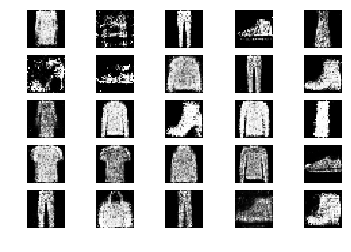

26601 [D loss: 0.676469, acc.: 53.12%] [G loss: 0.958542]
26602 [D loss: 0.612576, acc.: 64.06%] [G loss: 0.922544]
26603 [D loss: 0.616764, acc.: 70.31%] [G loss: 0.978567]
26604 [D loss: 0.634017, acc.: 67.19%] [G loss: 0.936500]
26605 [D loss: 0.653916, acc.: 60.94%] [G loss: 0.949922]
26606 [D loss: 0.640342, acc.: 60.94%] [G loss: 0.967822]
26607 [D loss: 0.649984, acc.: 67.19%] [G loss: 0.960954]
26608 [D loss: 0.637776, acc.: 67.19%] [G loss: 0.970418]
26609 [D loss: 0.651796, acc.: 65.62%] [G loss: 1.025265]
26610 [D loss: 0.642245, acc.: 64.06%] [G loss: 0.996838]
26611 [D loss: 0.655581, acc.: 65.62%] [G loss: 0.925226]
26612 [D loss: 0.638496, acc.: 62.50%] [G loss: 0.985609]
26613 [D loss: 0.684231, acc.: 57.81%] [G loss: 0.916119]
26614 [D loss: 0.609249, acc.: 67.19%] [G loss: 0.957236]
26615 [D loss: 0.639839, acc.: 65.62%] [G loss: 0.976534]
26616 [D loss: 0.594229, acc.: 73.44%] [G loss: 0.935683]
26617 [D loss: 0.642098, acc.: 64.06%] [G loss: 1.007646]
26618 [D loss:

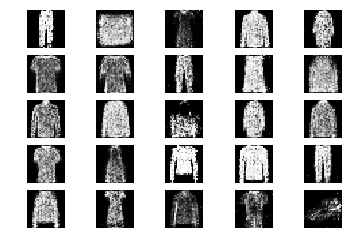

26801 [D loss: 0.627167, acc.: 62.50%] [G loss: 0.912143]
26802 [D loss: 0.646268, acc.: 64.06%] [G loss: 0.925920]
26803 [D loss: 0.624161, acc.: 64.06%] [G loss: 0.959319]
26804 [D loss: 0.681360, acc.: 60.94%] [G loss: 0.898390]
26805 [D loss: 0.583154, acc.: 70.31%] [G loss: 0.943995]
26806 [D loss: 0.615747, acc.: 62.50%] [G loss: 0.875869]
26807 [D loss: 0.672232, acc.: 54.69%] [G loss: 0.882348]
26808 [D loss: 0.587029, acc.: 71.88%] [G loss: 0.950629]
26809 [D loss: 0.636043, acc.: 59.38%] [G loss: 0.986413]
26810 [D loss: 0.595902, acc.: 64.06%] [G loss: 1.035030]
26811 [D loss: 0.669688, acc.: 54.69%] [G loss: 0.972504]
26812 [D loss: 0.763515, acc.: 40.62%] [G loss: 0.961496]
26813 [D loss: 0.667127, acc.: 57.81%] [G loss: 0.943409]
26814 [D loss: 0.645308, acc.: 60.94%] [G loss: 0.942958]
26815 [D loss: 0.600546, acc.: 70.31%] [G loss: 0.912577]
26816 [D loss: 0.676753, acc.: 60.94%] [G loss: 0.960822]
26817 [D loss: 0.595902, acc.: 70.31%] [G loss: 0.969036]
26818 [D loss:

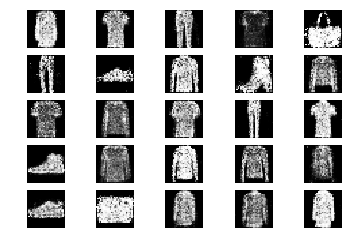

27001 [D loss: 0.670533, acc.: 59.38%] [G loss: 0.894912]
27002 [D loss: 0.643946, acc.: 62.50%] [G loss: 0.955137]
27003 [D loss: 0.645795, acc.: 68.75%] [G loss: 0.996608]
27004 [D loss: 0.670225, acc.: 60.94%] [G loss: 0.954557]
27005 [D loss: 0.672030, acc.: 60.94%] [G loss: 0.867423]
27006 [D loss: 0.622297, acc.: 62.50%] [G loss: 0.976928]
27007 [D loss: 0.661339, acc.: 54.69%] [G loss: 0.942214]
27008 [D loss: 0.636280, acc.: 60.94%] [G loss: 0.863265]
27009 [D loss: 0.672989, acc.: 62.50%] [G loss: 1.022013]
27010 [D loss: 0.619804, acc.: 65.62%] [G loss: 0.948900]
27011 [D loss: 0.601144, acc.: 68.75%] [G loss: 0.945397]
27012 [D loss: 0.628567, acc.: 67.19%] [G loss: 0.976242]
27013 [D loss: 0.656409, acc.: 59.38%] [G loss: 0.946648]
27014 [D loss: 0.639931, acc.: 67.19%] [G loss: 0.966086]
27015 [D loss: 0.648539, acc.: 60.94%] [G loss: 1.073296]
27016 [D loss: 0.673129, acc.: 64.06%] [G loss: 0.958774]
27017 [D loss: 0.586656, acc.: 70.31%] [G loss: 0.951806]
27018 [D loss:

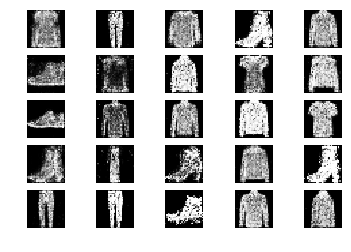

27201 [D loss: 0.653648, acc.: 57.81%] [G loss: 1.052364]
27202 [D loss: 0.638772, acc.: 59.38%] [G loss: 1.014091]
27203 [D loss: 0.657852, acc.: 56.25%] [G loss: 0.970615]
27204 [D loss: 0.577721, acc.: 71.88%] [G loss: 0.943551]
27205 [D loss: 0.701559, acc.: 53.12%] [G loss: 0.952317]
27206 [D loss: 0.660001, acc.: 62.50%] [G loss: 0.978935]
27207 [D loss: 0.715369, acc.: 57.81%] [G loss: 0.887473]
27208 [D loss: 0.624311, acc.: 59.38%] [G loss: 0.992246]
27209 [D loss: 0.602436, acc.: 68.75%] [G loss: 0.879721]
27210 [D loss: 0.650045, acc.: 54.69%] [G loss: 0.946616]
27211 [D loss: 0.656670, acc.: 59.38%] [G loss: 0.995828]
27212 [D loss: 0.582908, acc.: 73.44%] [G loss: 0.956297]
27213 [D loss: 0.610753, acc.: 70.31%] [G loss: 0.849670]
27214 [D loss: 0.595215, acc.: 67.19%] [G loss: 0.857842]
27215 [D loss: 0.614693, acc.: 67.19%] [G loss: 0.885431]
27216 [D loss: 0.638330, acc.: 60.94%] [G loss: 1.082657]
27217 [D loss: 0.589799, acc.: 73.44%] [G loss: 1.058203]
27218 [D loss:

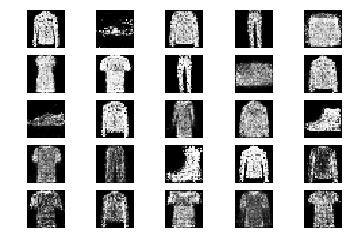

27401 [D loss: 0.610400, acc.: 64.06%] [G loss: 1.099390]
27402 [D loss: 0.582564, acc.: 65.62%] [G loss: 1.184675]
27403 [D loss: 0.619837, acc.: 64.06%] [G loss: 1.113766]
27404 [D loss: 0.630882, acc.: 60.94%] [G loss: 1.002625]
27405 [D loss: 0.679392, acc.: 60.94%] [G loss: 0.944270]
27406 [D loss: 0.758429, acc.: 50.00%] [G loss: 0.978597]
27407 [D loss: 0.640232, acc.: 65.62%] [G loss: 0.931668]
27408 [D loss: 0.567445, acc.: 75.00%] [G loss: 0.888624]
27409 [D loss: 0.594008, acc.: 64.06%] [G loss: 1.027215]
27410 [D loss: 0.664621, acc.: 57.81%] [G loss: 0.929849]
27411 [D loss: 0.730518, acc.: 46.88%] [G loss: 1.031864]
27412 [D loss: 0.647834, acc.: 65.62%] [G loss: 0.954215]
27413 [D loss: 0.593748, acc.: 70.31%] [G loss: 0.933310]
27414 [D loss: 0.628670, acc.: 64.06%] [G loss: 0.981899]
27415 [D loss: 0.639849, acc.: 59.38%] [G loss: 0.902252]
27416 [D loss: 0.633939, acc.: 64.06%] [G loss: 1.048880]
27417 [D loss: 0.629942, acc.: 60.94%] [G loss: 1.018249]
27418 [D loss:

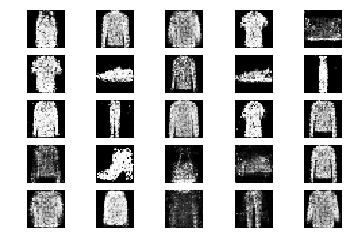

27601 [D loss: 0.652835, acc.: 57.81%] [G loss: 0.938788]
27602 [D loss: 0.684310, acc.: 50.00%] [G loss: 1.023993]
27603 [D loss: 0.673706, acc.: 70.31%] [G loss: 1.014328]
27604 [D loss: 0.612104, acc.: 65.62%] [G loss: 1.038010]
27605 [D loss: 0.635378, acc.: 57.81%] [G loss: 1.083882]
27606 [D loss: 0.653316, acc.: 57.81%] [G loss: 0.890190]
27607 [D loss: 0.655723, acc.: 62.50%] [G loss: 1.011735]
27608 [D loss: 0.650842, acc.: 56.25%] [G loss: 1.034198]
27609 [D loss: 0.581008, acc.: 68.75%] [G loss: 1.035964]
27610 [D loss: 0.643092, acc.: 60.94%] [G loss: 0.927281]
27611 [D loss: 0.678783, acc.: 57.81%] [G loss: 0.998617]
27612 [D loss: 0.628877, acc.: 68.75%] [G loss: 1.035256]
27613 [D loss: 0.685002, acc.: 56.25%] [G loss: 0.918039]
27614 [D loss: 0.647912, acc.: 62.50%] [G loss: 0.909491]
27615 [D loss: 0.660605, acc.: 59.38%] [G loss: 0.890778]
27616 [D loss: 0.633862, acc.: 62.50%] [G loss: 0.949909]
27617 [D loss: 0.627505, acc.: 67.19%] [G loss: 0.860314]
27618 [D loss:

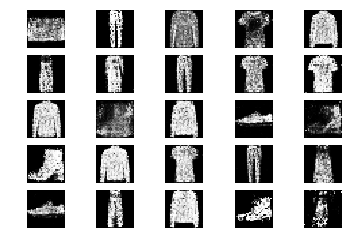

27801 [D loss: 0.653549, acc.: 64.06%] [G loss: 1.009888]
27802 [D loss: 0.595745, acc.: 67.19%] [G loss: 0.980319]
27803 [D loss: 0.680724, acc.: 54.69%] [G loss: 0.880836]
27804 [D loss: 0.644487, acc.: 64.06%] [G loss: 0.988621]
27805 [D loss: 0.631578, acc.: 60.94%] [G loss: 0.973941]
27806 [D loss: 0.511262, acc.: 79.69%] [G loss: 0.924749]
27807 [D loss: 0.631621, acc.: 64.06%] [G loss: 1.011465]
27808 [D loss: 0.579948, acc.: 68.75%] [G loss: 0.892733]
27809 [D loss: 0.588055, acc.: 70.31%] [G loss: 0.885061]
27810 [D loss: 0.626179, acc.: 59.38%] [G loss: 0.936305]
27811 [D loss: 0.626013, acc.: 70.31%] [G loss: 1.037503]
27812 [D loss: 0.561112, acc.: 75.00%] [G loss: 1.084497]
27813 [D loss: 0.618510, acc.: 59.38%] [G loss: 1.043504]
27814 [D loss: 0.606466, acc.: 67.19%] [G loss: 1.008281]
27815 [D loss: 0.589025, acc.: 68.75%] [G loss: 0.963733]
27816 [D loss: 0.537697, acc.: 70.31%] [G loss: 0.968966]
27817 [D loss: 0.628095, acc.: 62.50%] [G loss: 0.900400]
27818 [D loss:

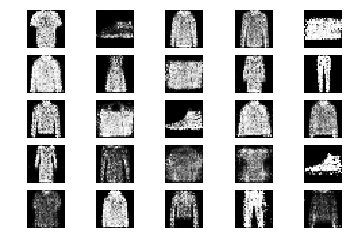

28001 [D loss: 0.620014, acc.: 73.44%] [G loss: 0.931825]
28002 [D loss: 0.637685, acc.: 62.50%] [G loss: 0.921907]
28003 [D loss: 0.614201, acc.: 67.19%] [G loss: 0.851122]
28004 [D loss: 0.615968, acc.: 68.75%] [G loss: 0.847529]
28005 [D loss: 0.675964, acc.: 59.38%] [G loss: 0.868485]
28006 [D loss: 0.705253, acc.: 56.25%] [G loss: 0.902035]
28007 [D loss: 0.652251, acc.: 60.94%] [G loss: 0.968087]
28008 [D loss: 0.629634, acc.: 60.94%] [G loss: 0.901133]
28009 [D loss: 0.671079, acc.: 50.00%] [G loss: 0.878728]
28010 [D loss: 0.657117, acc.: 65.62%] [G loss: 0.970851]
28011 [D loss: 0.569114, acc.: 71.88%] [G loss: 0.952489]
28012 [D loss: 0.586053, acc.: 73.44%] [G loss: 1.017069]
28013 [D loss: 0.652618, acc.: 64.06%] [G loss: 1.005585]
28014 [D loss: 0.605121, acc.: 65.62%] [G loss: 1.008079]
28015 [D loss: 0.627979, acc.: 65.62%] [G loss: 1.085536]
28016 [D loss: 0.602165, acc.: 64.06%] [G loss: 1.075035]
28017 [D loss: 0.661925, acc.: 60.94%] [G loss: 0.988873]
28018 [D loss:

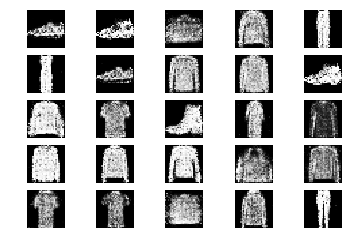

28201 [D loss: 0.602425, acc.: 71.88%] [G loss: 0.911910]
28202 [D loss: 0.633327, acc.: 59.38%] [G loss: 1.029411]
28203 [D loss: 0.640201, acc.: 64.06%] [G loss: 0.957543]
28204 [D loss: 0.650459, acc.: 60.94%] [G loss: 0.893320]
28205 [D loss: 0.596080, acc.: 65.62%] [G loss: 0.860645]
28206 [D loss: 0.584750, acc.: 73.44%] [G loss: 1.009252]
28207 [D loss: 0.604141, acc.: 73.44%] [G loss: 1.090719]
28208 [D loss: 0.721282, acc.: 53.12%] [G loss: 1.022905]
28209 [D loss: 0.568438, acc.: 67.19%] [G loss: 1.019353]
28210 [D loss: 0.681691, acc.: 56.25%] [G loss: 0.981802]
28211 [D loss: 0.651628, acc.: 59.38%] [G loss: 1.022073]
28212 [D loss: 0.645605, acc.: 65.62%] [G loss: 1.076486]
28213 [D loss: 0.659291, acc.: 56.25%] [G loss: 0.980632]
28214 [D loss: 0.631785, acc.: 65.62%] [G loss: 0.918999]
28215 [D loss: 0.642015, acc.: 64.06%] [G loss: 0.921741]
28216 [D loss: 0.750445, acc.: 48.44%] [G loss: 0.837799]
28217 [D loss: 0.666888, acc.: 59.38%] [G loss: 0.900392]
28218 [D loss:

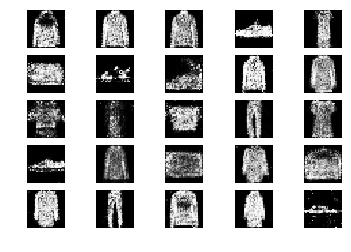

28401 [D loss: 0.703253, acc.: 60.94%] [G loss: 0.916588]
28402 [D loss: 0.673104, acc.: 56.25%] [G loss: 0.943288]
28403 [D loss: 0.616402, acc.: 67.19%] [G loss: 1.002095]
28404 [D loss: 0.644601, acc.: 70.31%] [G loss: 0.954651]
28405 [D loss: 0.677647, acc.: 64.06%] [G loss: 1.035170]
28406 [D loss: 0.675086, acc.: 64.06%] [G loss: 0.932226]
28407 [D loss: 0.625937, acc.: 70.31%] [G loss: 0.913669]
28408 [D loss: 0.648193, acc.: 62.50%] [G loss: 0.995322]
28409 [D loss: 0.696659, acc.: 54.69%] [G loss: 1.047761]
28410 [D loss: 0.611048, acc.: 70.31%] [G loss: 0.999171]
28411 [D loss: 0.647168, acc.: 70.31%] [G loss: 0.984607]
28412 [D loss: 0.650355, acc.: 62.50%] [G loss: 0.951450]
28413 [D loss: 0.617792, acc.: 64.06%] [G loss: 0.845860]
28414 [D loss: 0.720916, acc.: 45.31%] [G loss: 0.834836]
28415 [D loss: 0.588824, acc.: 71.88%] [G loss: 0.986960]
28416 [D loss: 0.625441, acc.: 70.31%] [G loss: 0.976844]
28417 [D loss: 0.632358, acc.: 62.50%] [G loss: 0.946007]
28418 [D loss:

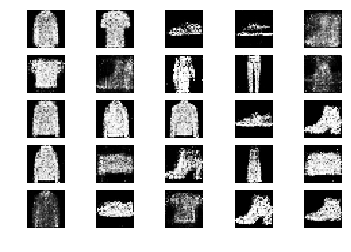

28601 [D loss: 0.622957, acc.: 65.62%] [G loss: 0.925291]
28602 [D loss: 0.667458, acc.: 65.62%] [G loss: 0.966989]
28603 [D loss: 0.669802, acc.: 51.56%] [G loss: 0.931795]
28604 [D loss: 0.663705, acc.: 57.81%] [G loss: 0.928832]
28605 [D loss: 0.640300, acc.: 59.38%] [G loss: 0.941705]
28606 [D loss: 0.651498, acc.: 62.50%] [G loss: 0.945196]
28607 [D loss: 0.649533, acc.: 65.62%] [G loss: 1.056364]
28608 [D loss: 0.629597, acc.: 62.50%] [G loss: 0.902836]
28609 [D loss: 0.715014, acc.: 48.44%] [G loss: 0.837372]
28610 [D loss: 0.666913, acc.: 67.19%] [G loss: 0.862697]
28611 [D loss: 0.649916, acc.: 64.06%] [G loss: 0.925403]
28612 [D loss: 0.577252, acc.: 73.44%] [G loss: 0.995486]
28613 [D loss: 0.637027, acc.: 62.50%] [G loss: 0.887159]
28614 [D loss: 0.606301, acc.: 68.75%] [G loss: 0.880957]
28615 [D loss: 0.609776, acc.: 70.31%] [G loss: 0.827978]
28616 [D loss: 0.688681, acc.: 56.25%] [G loss: 0.972904]
28617 [D loss: 0.584327, acc.: 60.94%] [G loss: 0.986233]
28618 [D loss:

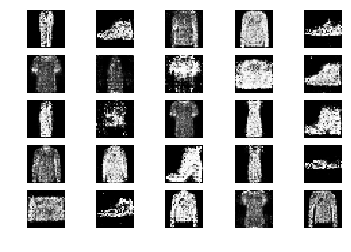

28801 [D loss: 0.577199, acc.: 76.56%] [G loss: 1.000847]
28802 [D loss: 0.605056, acc.: 70.31%] [G loss: 0.903503]
28803 [D loss: 0.672429, acc.: 60.94%] [G loss: 0.950856]
28804 [D loss: 0.649275, acc.: 60.94%] [G loss: 0.885644]
28805 [D loss: 0.653090, acc.: 62.50%] [G loss: 0.874250]
28806 [D loss: 0.621739, acc.: 70.31%] [G loss: 1.045216]
28807 [D loss: 0.661070, acc.: 53.12%] [G loss: 0.956246]
28808 [D loss: 0.623777, acc.: 67.19%] [G loss: 0.879293]
28809 [D loss: 0.683549, acc.: 56.25%] [G loss: 0.975869]
28810 [D loss: 0.597964, acc.: 68.75%] [G loss: 1.025249]
28811 [D loss: 0.630951, acc.: 64.06%] [G loss: 0.937163]
28812 [D loss: 0.670309, acc.: 57.81%] [G loss: 0.996091]
28813 [D loss: 0.686925, acc.: 53.12%] [G loss: 0.946546]
28814 [D loss: 0.624199, acc.: 65.62%] [G loss: 1.020093]
28815 [D loss: 0.674707, acc.: 51.56%] [G loss: 1.004774]
28816 [D loss: 0.669590, acc.: 60.94%] [G loss: 1.048188]
28817 [D loss: 0.649464, acc.: 64.06%] [G loss: 1.065158]
28818 [D loss:

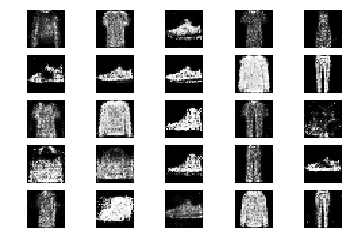

29001 [D loss: 0.659131, acc.: 59.38%] [G loss: 1.102707]
29002 [D loss: 0.664252, acc.: 68.75%] [G loss: 1.011803]
29003 [D loss: 0.635297, acc.: 67.19%] [G loss: 0.971783]
29004 [D loss: 0.657231, acc.: 64.06%] [G loss: 0.860569]
29005 [D loss: 0.601121, acc.: 64.06%] [G loss: 0.861319]
29006 [D loss: 0.550302, acc.: 71.88%] [G loss: 0.921382]
29007 [D loss: 0.660281, acc.: 60.94%] [G loss: 0.891060]
29008 [D loss: 0.633498, acc.: 64.06%] [G loss: 0.966958]
29009 [D loss: 0.604579, acc.: 65.62%] [G loss: 0.977857]
29010 [D loss: 0.691581, acc.: 60.94%] [G loss: 0.947528]
29011 [D loss: 0.739511, acc.: 46.88%] [G loss: 0.917812]
29012 [D loss: 0.609266, acc.: 62.50%] [G loss: 0.885766]
29013 [D loss: 0.664049, acc.: 62.50%] [G loss: 0.954473]
29014 [D loss: 0.576236, acc.: 68.75%] [G loss: 1.085267]
29015 [D loss: 0.670095, acc.: 54.69%] [G loss: 0.987386]
29016 [D loss: 0.610638, acc.: 70.31%] [G loss: 0.942373]
29017 [D loss: 0.632878, acc.: 67.19%] [G loss: 0.991966]
29018 [D loss:

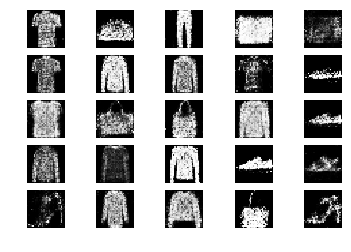

29201 [D loss: 0.622522, acc.: 59.38%] [G loss: 0.972970]
29202 [D loss: 0.556872, acc.: 71.88%] [G loss: 0.977071]
29203 [D loss: 0.688260, acc.: 57.81%] [G loss: 1.044492]
29204 [D loss: 0.596670, acc.: 67.19%] [G loss: 1.025606]
29205 [D loss: 0.663408, acc.: 56.25%] [G loss: 1.083398]
29206 [D loss: 0.613623, acc.: 64.06%] [G loss: 1.012379]
29207 [D loss: 0.656599, acc.: 59.38%] [G loss: 0.904019]
29208 [D loss: 0.606486, acc.: 67.19%] [G loss: 1.008271]
29209 [D loss: 0.630840, acc.: 64.06%] [G loss: 0.980360]
29210 [D loss: 0.610766, acc.: 62.50%] [G loss: 1.042391]
29211 [D loss: 0.596815, acc.: 64.06%] [G loss: 0.911851]
29212 [D loss: 0.638861, acc.: 62.50%] [G loss: 0.892127]
29213 [D loss: 0.615134, acc.: 75.00%] [G loss: 1.009043]
29214 [D loss: 0.589468, acc.: 67.19%] [G loss: 1.013477]
29215 [D loss: 0.670595, acc.: 57.81%] [G loss: 1.000473]
29216 [D loss: 0.631886, acc.: 62.50%] [G loss: 0.991981]
29217 [D loss: 0.647052, acc.: 59.38%] [G loss: 0.915141]
29218 [D loss:

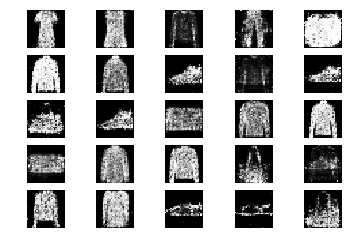

29401 [D loss: 0.699164, acc.: 64.06%] [G loss: 1.016377]
29402 [D loss: 0.638800, acc.: 62.50%] [G loss: 0.956381]
29403 [D loss: 0.635225, acc.: 70.31%] [G loss: 1.020969]
29404 [D loss: 0.671830, acc.: 60.94%] [G loss: 0.972363]
29405 [D loss: 0.692829, acc.: 59.38%] [G loss: 1.093023]
29406 [D loss: 0.642686, acc.: 65.62%] [G loss: 0.934974]
29407 [D loss: 0.643832, acc.: 60.94%] [G loss: 0.901230]
29408 [D loss: 0.633574, acc.: 64.06%] [G loss: 0.967871]
29409 [D loss: 0.650220, acc.: 56.25%] [G loss: 0.947063]
29410 [D loss: 0.542168, acc.: 75.00%] [G loss: 0.972699]
29411 [D loss: 0.607839, acc.: 64.06%] [G loss: 0.983979]
29412 [D loss: 0.660354, acc.: 60.94%] [G loss: 0.901125]
29413 [D loss: 0.754529, acc.: 46.88%] [G loss: 0.999952]
29414 [D loss: 0.624498, acc.: 65.62%] [G loss: 0.905017]
29415 [D loss: 0.682387, acc.: 60.94%] [G loss: 0.862439]
29416 [D loss: 0.575297, acc.: 67.19%] [G loss: 0.909588]
29417 [D loss: 0.593454, acc.: 60.94%] [G loss: 1.089083]
29418 [D loss:

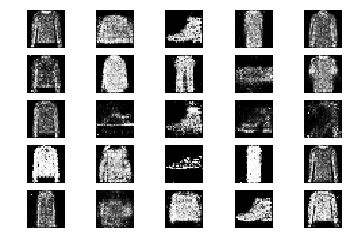

29601 [D loss: 0.577239, acc.: 68.75%] [G loss: 0.959423]
29602 [D loss: 0.595545, acc.: 60.94%] [G loss: 0.903141]
29603 [D loss: 0.590942, acc.: 59.38%] [G loss: 0.901247]
29604 [D loss: 0.663115, acc.: 57.81%] [G loss: 0.980327]
29605 [D loss: 0.636566, acc.: 64.06%] [G loss: 0.967296]
29606 [D loss: 0.611595, acc.: 71.88%] [G loss: 0.934526]
29607 [D loss: 0.632100, acc.: 56.25%] [G loss: 0.894252]
29608 [D loss: 0.624453, acc.: 65.62%] [G loss: 0.875918]
29609 [D loss: 0.636647, acc.: 59.38%] [G loss: 0.921074]
29610 [D loss: 0.619109, acc.: 71.88%] [G loss: 0.859989]
29611 [D loss: 0.521322, acc.: 81.25%] [G loss: 0.929639]
29612 [D loss: 0.639222, acc.: 60.94%] [G loss: 0.921367]
29613 [D loss: 0.676519, acc.: 57.81%] [G loss: 0.860459]
29614 [D loss: 0.623247, acc.: 65.62%] [G loss: 0.843770]
29615 [D loss: 0.734251, acc.: 59.38%] [G loss: 0.975622]
29616 [D loss: 0.682392, acc.: 56.25%] [G loss: 0.925238]
29617 [D loss: 0.630600, acc.: 64.06%] [G loss: 0.965860]
29618 [D loss:

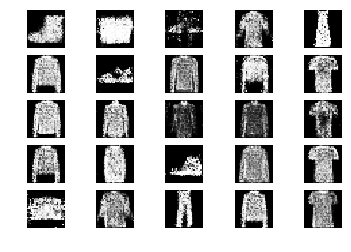

29801 [D loss: 0.697659, acc.: 56.25%] [G loss: 0.928924]
29802 [D loss: 0.713315, acc.: 54.69%] [G loss: 0.969949]
29803 [D loss: 0.588943, acc.: 68.75%] [G loss: 0.924222]
29804 [D loss: 0.651455, acc.: 57.81%] [G loss: 0.941931]
29805 [D loss: 0.646152, acc.: 59.38%] [G loss: 0.976271]
29806 [D loss: 0.737213, acc.: 50.00%] [G loss: 0.921204]
29807 [D loss: 0.697465, acc.: 60.94%] [G loss: 0.973802]
29808 [D loss: 0.587405, acc.: 75.00%] [G loss: 1.050929]
29809 [D loss: 0.602286, acc.: 64.06%] [G loss: 1.018734]
29810 [D loss: 0.718352, acc.: 50.00%] [G loss: 1.059252]
29811 [D loss: 0.654437, acc.: 64.06%] [G loss: 1.063640]
29812 [D loss: 0.576784, acc.: 68.75%] [G loss: 0.996817]
29813 [D loss: 0.637226, acc.: 65.62%] [G loss: 1.015453]
29814 [D loss: 0.529546, acc.: 75.00%] [G loss: 1.007499]
29815 [D loss: 0.700004, acc.: 53.12%] [G loss: 1.053205]
29816 [D loss: 0.666220, acc.: 51.56%] [G loss: 0.870893]
29817 [D loss: 0.659624, acc.: 64.06%] [G loss: 1.004304]
29818 [D loss:

In [0]:
gan = GAN()
gan.train(epochs=30000, batch_size=32, sample_interval=200)

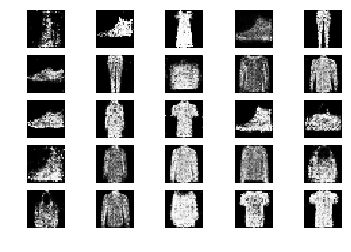

In [0]:
# plot some sample images
gan.sample_images(0)

In [0]:
 # fuction to plot a signel image 
 def plot_image(gan):
        noise = np.random.normal(0, 1, (1, gan.latent_dim))
        gen_imgs = gan.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
        plt.show()
        plt.close()

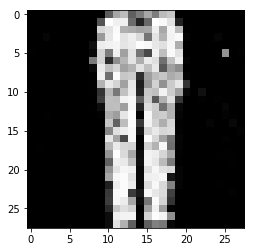

In [0]:
# plot a single image 
plot_image(gan)

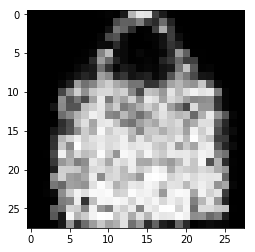

In [0]:
# plot another image 
plot_image(gan)